<a href="https://colab.research.google.com/github/descartesmbogning/Key-Players/blob/main/patent_Key_Players.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install nltk matplotlib wordcloud scikit-learn


In [ ]:
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Downloads
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize your stopwords set with wordcloud's stopwords
s = set(STOPWORDS)

# Get stopwords for all languages in NLTK
languages = stopwords.fileids()
for language in languages:
    s.update(stopwords.words(language))

# Add any additional stopwords if needed
s.add('amp')

# If you really need the resulting stopwords as a list:
stopwords_list = list(s)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Load your dataset (Assuming it's a CSV with a column 'abstract' for patent abstracts)

# import data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
#data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()
pd.set_option('display.max_columns', None)
print(len(data))
data.head()

2365


,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED


# data preprocessing

In [ ]:
data['Application Date'] = pd.to_datetime(data['Application Date'])
data['Earliest Priority Date'] = pd.to_datetime(data['Earliest Priority Date'])

In [ ]:
data['Application Year'] = data['Application Date'].dt.year
data['Earliest Priority Year'] = data['Earliest Priority Date'].dt.year

In [ ]:
# Convert 'Publication Year' to integers
data['Publication Year'] = data['Publication Year'].astype('Int64')
data['Application Year'] = data['Application Year'].astype('Int64')
data['Earliest Priority Year'] = data['Earliest Priority Year'].astype('Int64')

In [ ]:
def group_years_in_ranges(df, col_name):
    bins = list(range(1960, 2026, 5))
    labels = [f"{i}-{i+4}" for i in bins[:-1]]
    return pd.cut(data['Application Year'], bins=bins, labels=labels, right=False)


In [ ]:
data['Application_Year_Range'] = group_years_in_ranges(data, 'Application Year')


In [ ]:
data['IPCR Classifications']

0                                    A61K35/76;;A61P31/06
1               C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09
2                         A61K35/76;;C12N9/14;;G01N33/569
3                           A61K35/76;;A61K9/00;;C12N7/00
4                                     A61K35/76;;C12N7/00
                              ...                        
2360                                            C07H19/14
2361    C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...
2362                                             C12Q1/68
2363     A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00
2364    A61K39/00;;A61K39/29;;A61K39/295;;A61K39/385;;...
Name: IPCR Classifications, Length: 2365, dtype: object

In [ ]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_sections(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[0] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Sections'] = data['IPCR Classifications'].apply(process_ipcr_sections)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Sections']]


,IPCR Classifications,IPCR Sections
0,A61K35/76;;A61P31/06,A
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A;;C
2,A61K35/76;;C12N9/14;;G01N33/569,A;;C;;G
3,A61K35/76;;A61K9/00;;C12N7/00,A;;C
4,A61K35/76;;C12N7/00,A;;C
...,...,...
2360,C07H19/14,C
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C
2362,C12Q1/68,C
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A;;C


In [ ]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_class(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:3] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Class'] = data['IPCR Classifications'].apply(process_ipcr_class)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Class']]


,IPCR Classifications,IPCR Class
0,A61K35/76;;A61P31/06,A61
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61;;C12
2,A61K35/76;;C12N9/14;;G01N33/569,A61;;C12;;G01
3,A61K35/76;;A61K9/00;;C12N7/00,A61;;C12
4,A61K35/76;;C12N7/00,A61;;C12
...,...,...
2360,C07H19/14,C07
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07;;C08;;C12
2362,C12Q1/68,C12
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21;;A23;;C12


In [ ]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_subclass(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:4] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Subclass'] = data['IPCR Classifications'].apply(process_ipcr_subclass)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Subclass']]


,IPCR Classifications,IPCR Subclass
0,A61K35/76;;A61P31/06,A61K;;A61P
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61K;;A61P;;C12N
2,A61K35/76;;C12N9/14;;G01N33/569,A61K;;C12N;;G01N
3,A61K35/76;;A61K9/00;;C12N7/00,A61K;;C12N
4,A61K35/76;;C12N7/00,A61K;;C12N
...,...,...
2360,C07H19/14,C07H
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07H;;C08F;;C12P
2362,C12Q1/68,C12Q
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21D;;A23C;;C12N;;C12P


In [ ]:
data['Jurisdiction'].unique()

array(['RU', 'JP', 'AU', 'US', 'CN', 'CA', 'WO', 'EP', 'SG', 'KR', 'NZ',
       'GB', 'GE', 'DE', 'CZ', 'MX', 'TN', 'ES', 'IN', 'EA', 'TW', 'UA',
       'MY', 'SU', 'FR', 'CH', 'PH', 'SK', 'NL', 'LV', 'ZA', 'PL', 'BG'],
      dtype=object)

In [ ]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

jurisdiction_codes = {
    'RU': 'Russia',
    'JP': 'Japan',
    'AU': 'Australia',
    'US': 'United States',
    'CN': 'China',
    'CA': 'Canada',
    'WO': 'World Intellectual Property Organization',
    'EP': 'European Patent Office',
    'SG': 'Singapore',
    'KR': 'South Korea',
    'NZ': 'New Zealand',
    'GB': 'United Kingdom (Great Britain)',
    'GE': 'Georgia',  # or 'Germany' for historical East Germany
    'DE': 'Germany',
    'CZ': 'Czech Republic',
    'MX': 'Mexico',
    'TN': 'Tunisia',
    'ES': 'Spain',
    'IN': 'India',
    'EA': 'Eurasian Patent Organization',
    'TW': 'Taiwan',
    'UA': 'Ukraine',
    'MY': 'Malaysia',
    'SU': 'Soviet Union (historical)',
    'FR': 'France',
    'CH': 'Switzerland',
    'PH': 'Philippines',
    'SK': 'Slovakia',
    'NL': 'Netherlands',
    'LV': 'Latvia',
    'ZA': 'South Africa',
    'PL': 'Poland',
    'BG': 'Bulgaria',
}

# Replace the codes with names in the 'Jurisdiction' column
data['Jurisdiction_name'] = data['Jurisdiction'].map(jurisdiction_codes).fillna(data['Jurisdiction'])

#data[['Jurisdiction', 'Jurisdiction_name']]

In [ ]:
import pandas as pd

# Your existing DataFrame is 'data', and it contains a column 'Jurisdiction'

# Map of jurisdiction codes to their respective continent or region names
jurisdiction_to_region = {
    # Western Europe
    'GB': 'Western Europe', 'DE': 'Western Europe', 'FR': 'Western Europe',
    'CH': 'Western Europe', 'NL': 'Western Europe', 'ES': 'Western Europe',

    # Eastern Europe
    'RU': 'Eastern Europe', 'CZ': 'Eastern Europe', 'UA': 'Eastern Europe',
    'SK': 'Eastern Europe', 'LV': 'Eastern Europe', 'PL': 'Eastern Europe',
    'GE': 'Eastern Europe', 'BG': 'Eastern Europe',

    # Rest of the regions
    'JP': 'Asia', 'AU': 'Oceania', 'US': 'North America', 'CN': 'Asia',
    'CA': 'North America', 'WO': 'International', 'EP': 'Europe', 'SG': 'Asia',
    'KR': 'Asia', 'NZ': 'Oceania', 'MX': 'North America', 'TN': 'Africa',
    'IN': 'Asia', 'EA': 'Eurasia', 'TW': 'Asia', 'MY': 'Asia',
    'SU': 'Eurasia', 'PH': 'Asia', 'ZA': 'Africa'
}

# Create a new column 'Region' by mapping the 'Jurisdiction' column using the dictionary
data['Jurisdiction_Region'] = data['Jurisdiction'].map(jurisdiction_to_region).fillna(data['Jurisdiction'])

data[['Jurisdiction', 'Jurisdiction_name', 'Jurisdiction_Region']]


,Jurisdiction,Jurisdiction_name,Jurisdiction_Region
0,RU,Russia,Eastern Europe
1,JP,Japan,Asia
2,AU,Australia,Oceania
3,US,United States,North America
4,AU,Australia,Oceania
...,...,...,...
2360,GB,United Kingdom (Great Britain),Western Europe
2361,GB,United Kingdom (Great Britain),Western Europe
2362,SG,Singapore,Asia
2363,SG,Singapore,Asia


In [ ]:
data['Jurisdiction_name'].unique()

array(['Russia', 'Japan', 'Australia', 'United States', 'China', 'Canada',
       'World Intellectual Property Organization',
       'European Patent Office', 'Singapore', 'South Korea',
       'New Zealand', 'United Kingdom (Great Britain)', 'Georgia',
       'Germany', 'Czech Republic', 'Mexico', 'Tunisia', 'Spain', 'India',
       'Eurasian Patent Organization', 'Taiwan', 'Ukraine', 'Malaysia',
       'Soviet Union (historical)', 'France', 'Switzerland',
       'Philippines', 'Slovakia', 'Netherlands', 'Latvia', 'South Africa',
       'Poland', 'Bulgaria'], dtype=object)

In [ ]:
data['Jurisdiction_Region'].unique()

array(['Eastern Europe', 'Asia', 'Oceania', 'North America',
       'International', 'Europe', 'Western Europe', 'Africa', 'Eurasia'],
      dtype=object)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2365 entries, 0 to 2364
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   #                            2365 non-null   int64         
 1   Jurisdiction                 2365 non-null   object        
 2   Kind                         2365 non-null   object        
 3   Display Key                  2365 non-null   object        
 4   Lens ID                      2365 non-null   object        
 5   Publication Date             2365 non-null   object        
 6   Publication Year             2365 non-null   Int64         
 7   Application Number           2365 non-null   object        
 8   Application Date             2365 non-null   datetime64[ns]
 9   Priority Numbers             2363 non-null   object        
 10  Earliest Priority Date       2363 non-null   datetime64[ns]
 11  Title                        2365 non-null 

# Key Players:
  •	Objective: Recognize leading institutions, companies, or researchers in phage therapy.
  
  o	Research Question: Who are the main assignees of phage therapy patents, and what are their primary focus areas?


In [ ]:
data[["Applicants","Inventors","Owners"]].count()

Applicants    2343
Inventors     2330
Owners         296
dtype: int64

## Applicants

In [ ]:
data[["Applicants","Inventors","Owners"]]

,Applicants,Inventors,Owners
0,NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN
1,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN
2,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM..."
3,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...
4,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN
...,...,...,...
2360,UPJOHN CO,NaN,NaN
2361,UPJOHN CO,NaN,NaN
2362,TCM BIOTECH INT CORP,LIN YOU-YU;;WANG YA-CHUN;;TZENG SHENG-TAI,NaN
2363,FLAGSHIP PIONEERING INNOVATIONS V INC,MARTINEZ IGNACIO;;ARMEN ZACHARY;;CEZAR CHRISTI...,NaN


### process_applicants_data : count patents and sum citations per applicant

In [ ]:
import pandas as pd

def process_applicants_data(data, pickle_path=None, csv_path=None):
    """
    Process the given data to count patents and sum citations per applicant.

    Parameters:
    - data (pd.DataFrame): The input data containing the relevant fields.
    - pickle_path (str, optional): The path to save the processed data as a pickle file.
    - csv_path (str, optional): The path to save the processed data as a CSV file.

    Returns:
    - grouped (pd.DataFrame): The processed data.
    """

    # Set the index
    applicants_data = data.set_index(['Lens ID', 'Application Year', 'Cited by Patent Count'])

    # Split and explode the 'Applicants' field
    applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip()

    # Count the unique applicants names
    unique_applicants_count = applicants_list.nunique()
    print('The number of unique applicants is:', unique_applicants_count)

    # Reset the index to re-organize data
    applicants_list2 = applicants_list.to_frame().reset_index()

    # Group by Applicants to count patents and sum citations
    grouped = applicants_list2.groupby('Applicants').agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate additional metrics
    grouped['%'] = (grouped['Lens ID'] / applicants_data['Applicants'].count()) * 100
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Applicants', 'Patent Count', 'Total Citations', 'Percentage of Total Patents', 'Average Citation Count']

    # Save the data if paths are provided
    if pickle_path:
        grouped.to_pickle(pickle_path)
    if csv_path:
        grouped.to_csv(csv_path)

    return grouped

# Example usage:
#grouped_data = process_applicants_data(data, pickle_path='/path/to/your/directory/applicants_count_citation_therapy.pkl', csv_path='/path/to/your/directory/applicants_count_citation_therapy.csv')
#grouped_data#.head(50)


In [ ]:
grouped_data = process_applicants_data(data)
grouped_data

The number of unique applicants is: 1971


,Applicants,Patent Count,Total Citations,Percentage of Total Patents,Average Citation Count
0,4D PHARMA LEON S L U,1,0,0.042680,0.0
1,ABAEV IGOR V,2,1,0.085361,0.5
2,ABBOTT LAB,1,2,0.042680,2.0
3,ABCELEX TECH INC,1,0,0.042680,0.0
4,ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD,1,0,0.042680,0.0
...,...,...,...,...,...
1966,БЕРІНГЕР МАННХАЙМ ГМБХ,3,0,0.128041,0.0
1967,“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIG...,1,0,0.042680,0.0
1968,경북대학교 산학협력단,1,0,0.042680,0.0
1969,주식회사 비엠씨,1,0,0.042680,0.0


In [ ]:
sorted_df = grouped_data[['Applicants', 'Patent Count']].sort_values(by='Patent Count', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Patent Count
1103,Optipharm Co Ltd,49
700,Intron Biotechnology Inc,45
1203,Qingdao No Antibiotics Biotechnology Co Ltd,33
699,Intron Biotechnology Co Ltd,29
263,Cj Cheiljedang Corp,29
1256,Ruikemeng Qingdao Biological Eng Co Ltd,24
893,Loomis Lawrence,22
1775,Univ Zhejiang,21
426,Fischetti Vincent,19
1716,Univ Rockefeller,19


In [ ]:
sorted_df = grouped_data[['Applicants', 'Total Citations']].sort_values(by='Total Citations', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Total Citations
893,Loomis Lawrence,333
1048,New Horizons Diagnostics Corp,313
426,Fischetti Vincent,236
20,Affymax Tech Nv,212
573,Harvard College,205
171,Broad Inst Inc,188
166,Borody Thomas J,181
427,Fischetti Vincent A,146
1792,Us Dept Veterans Affairs,131
415,Finegold Sidney M,131


### Patent Applications and Applicant Counts Over the Years

In [ ]:
# Set the index
applicants_data = data.set_index(['Application Year'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Application Year,Applicants
0,2001,NOVOSIB NII T
1,2001,UBERKULEZA
2,2015,TECNIFAR-INDUSTRIA TECNICA FARM S A
3,2015,TECHNOPHAGE INVESTIG E DES
4,2015,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A
...,...,...
3337,2007,CHUNQING LUO
3340,1999,GAMBRO INC
3343,2018,TCM BIOTECH INT CORP
3344,2018,FLAGSHIP PIONEERING INNOVATIONS V INC


In [ ]:
applicants_count_year = applicants_list['Application Year'].value_counts().rename('Applicants counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

2021    171
2020    154
2019    146
2022    144
2008    118
2010    117
2012    112
2018    107
2017    106
2003    103
2015    102
2011     98
2009     93
2016     91
2007     74
2002     70
2004     69
2013     68
2001     67
2014     66
2005     64
2006     61
2000     51
2023     45
1997     39
1999     37
1994     33
1998     28
1995     25
1990     23
1996     22
1991     21
1989     18
1993     16
1988     14
1992     10
1986      9
1987      9
1985      8
1984      7
1977      5
1955      3
1982      3
1981      3
1969      2
1959      2
1971      2
1972      2
1963      1
1968      1
1980      1
1979      1
1958      1
1983      1
1964      1
1967      1
1978      1
1966      1
Name: Applicants counts, dtype: Int64

In [ ]:
#count_year_1

#### table

In [ ]:
count_year_1 = data['Application Year'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Year'}).sort_values('Year', ascending=False)
data_trend_applicants_count.head(60)

,Year,Application,Applicants counts
19,2023,46,45
2,2022,175,144
0,2021,206,171
1,2020,180,154
3,2019,165,146
5,2018,124,107
4,2017,164,106
6,2016,114,91
7,2015,106,102
9,2014,74,66


#### graph

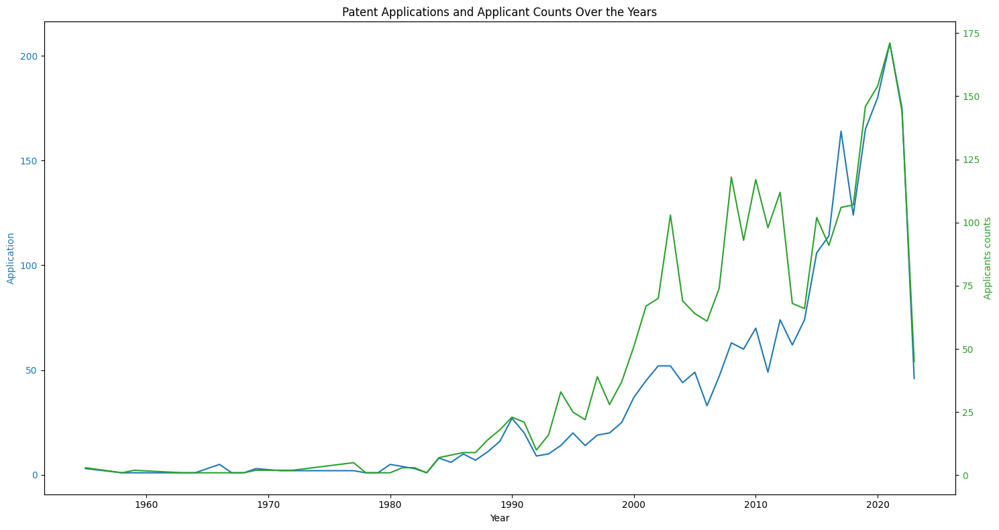

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (replace this with your actual DataFrame)

# Sorting the DataFrame by year
df = data_trend_applicants_count.sort_values(by='Year')

# Creating the plot
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting 'Application' on the primary y-axis
color = 'tab:blue'
ax1.set_xlabel('Year')
ax1.set_ylabel('Application', color=color)
ax1.plot(df['Year'], df['Application'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Creating a secondary y-axis for 'Applicants counts'
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Applicants counts', color=color)
ax2.plot(df['Year'], df['Applicants counts'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Title and layout
plt.title('Patent Applications and Applicant Counts Over the Years')
fig.tight_layout()

# Show the plot
plt.show()


### Graph + stat : Relationship Between Number of Applicants and Number of Applications

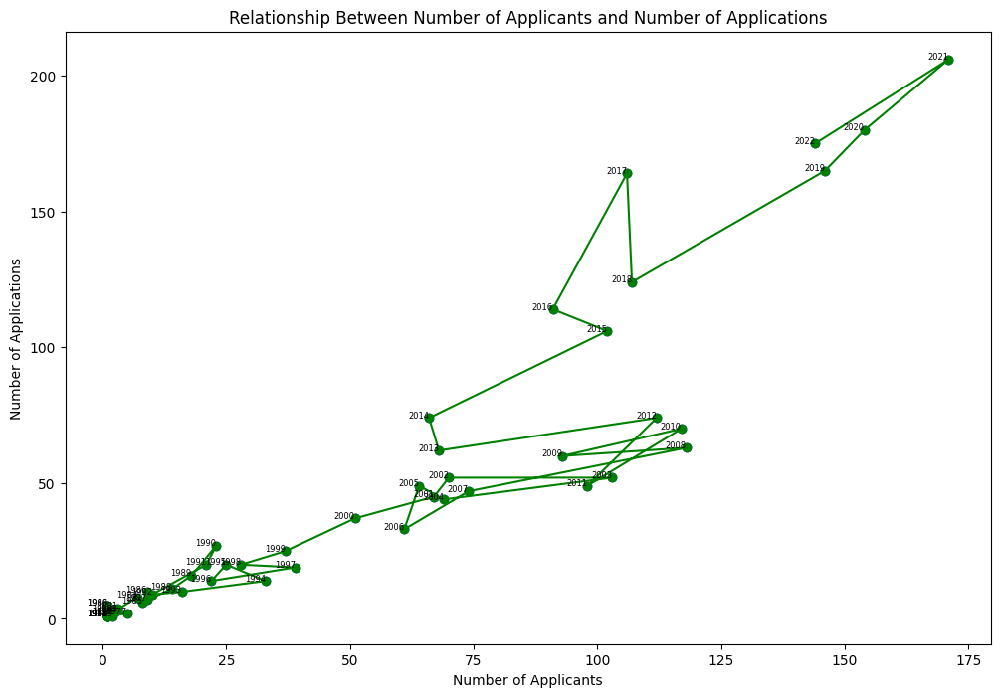

Pearson Correlation Coefficient: 0.9214709772455268
p value: 3.0006802021493124e-24
The correlation is statistically significant.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats

# Sample DataFrame (replace this with your actual DataFrame)
df = data_trend_applicants_count.sort_values(by='Year')
# Delete rows where 'Year' is 2023
df = df[df['Year'] != 2023]
# Creating the scatter plot and line plot
plt.figure(figsize=(12, 8))
plt.scatter(df['Applicants counts'], df['Application'], c='blue', marker='o')
plt.plot(df['Applicants counts'], df['Application'], c='green', marker='o')  # Line connecting the points

# Adding year labels to each point
for idx, row in df.iterrows():
    plt.text(row['Applicants counts'], row['Application'], str(row['Year']), fontsize=6, ha='right')

# Adding labels and title
plt.xlabel('Number of Applicants')
plt.ylabel('Number of Applications')
plt.title('Relationship Between Number of Applicants and Number of Applications')

# Show the plot
plt.show()

# Pearson Correlation Coefficient
correlation_coefficient, p_value = scipy.stats.pearsonr(df['Applicants counts'], df['Application'])
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")
print(f"p value: {p_value}")

# Interpreting the results
if p_value < 0.05:
    print("The correlation is statistically significant.")
else:
    print("The correlation is not statistically significant.")


### Graph : Top 10 Applicants by Patent Count/ Total Citations + Patent Count vs. Average Citation Count

The number of unique applicants is: 1971


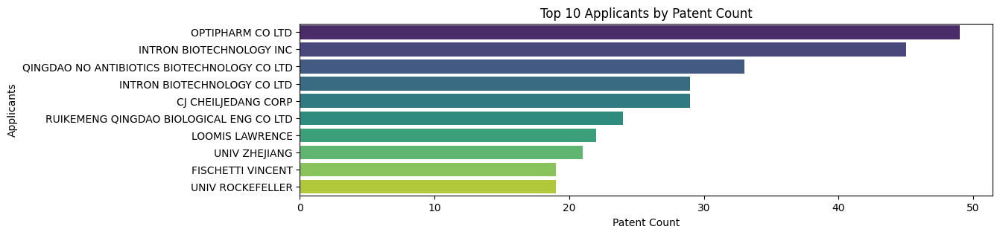

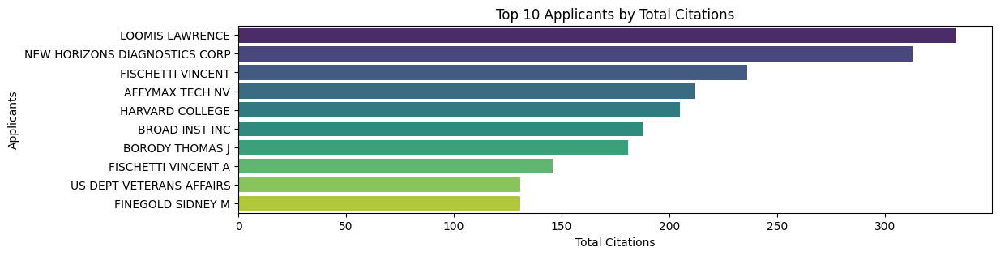

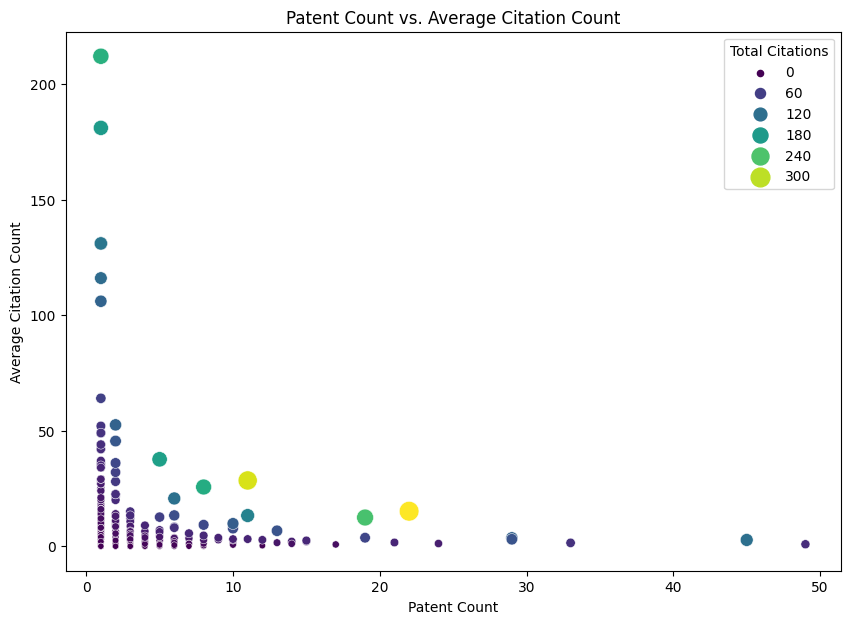

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_applicant_data(grouped_data):
    grouped_data = process_applicants_data(data)

    # Top Applicants by Patent Count
    plt.figure(figsize=(12, 3))
    top_applicants_by_patents = grouped_data.sort_values(by="Patent Count", ascending=False).head(10)
    sns.barplot(data=top_applicants_by_patents, y='Applicants', x='Patent Count', palette='viridis')
    plt.title("Top 10 Applicants by Patent Count")
    plt.show()

    # Top Applicants by Total Citations
    plt.figure(figsize=(12, 3))
    top_applicants_by_citations = grouped_data.sort_values(by="Total Citations", ascending=False).head(10)
    sns.barplot(data=top_applicants_by_citations, y='Applicants', x='Total Citations', palette='viridis')
    plt.title("Top 10 Applicants by Total Citations")
    plt.show()

    # Scatter Plot of Patent Count vs. Average Citation Count
    plt.figure(figsize=(10, 7))
    sns.scatterplot(data=grouped_data, x='Patent Count', y='Average Citation Count', hue='Total Citations', size='Total Citations', sizes=(20, 200), palette='viridis')
    plt.title("Patent Count vs. Average Citation Count")
    plt.show()

# Call the function
plot_applicant_data(grouped_data)


### group_and_pivot_applicants : Group patent data by 'Application Year' and 'Applicants' and then pivot the result

In [ ]:
import pandas as pd

def group_and_pivot_applicants(applicants_list2: pd.DataFrame) -> pd.DataFrame:
    """
    Group patent data by 'Application Year' and 'Applicants' and then pivot the result.

    Parameters:
    - applicants_list2 (pd.DataFrame): DataFrame containing patent data.

    Returns:
    - pd.DataFrame: Pivoted DataFrame with metrics as multi-level columns and years as sub-columns.
    """
    # Set the index
    applicants_data = data.set_index(['Lens ID', 'Application Year', 'Cited by Patent Count'])

    # Split and explode the 'Applicants' field
    applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip()

    # Count the unique applicants names
    unique_applicants_count = applicants_list.nunique()
    print('The number of unique applicants is:', unique_applicants_count)

    # Reset the index to re-organize data
    applicants_list2 = applicants_list.to_frame().reset_index()

    # Convert 'Application Year' to integer type if it's not
    applicants_list2['Application Year'] = applicants_list2['Application Year'].astype(int)

    # Group by 'Application Year' and 'Applicants', count number of patents
    # and sum citations within each group
    grouped = applicants_list2.groupby(['Application Year', 'Applicants']).agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate the average citation count
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Application Year', 'Applicants', 'Publication Count', 'Total Citations', 'Average Citation Count']

    # Pivot the DataFrame to have metrics as multi-level columns and years as sub-columns
    pivot_df = grouped.pivot_table(index='Applicants', columns='Application Year', values=['Publication Count', 'Total Citations', 'Average Citation Count'], aggfunc='sum')

    return pivot_df

# Usage
pivot_df = group_and_pivot_applicants(grouped_data)

# You might want to fill them with a value or drop them, depending on your needs
#pivot_df.fillna(0, inplace=True)  # Replace NaNs with 0, or use `df.dropna()` to remove

# Convert all columns to integers
#pivot_df = pivot_df.astype(int)

# Round the numbers and convert to integer
#pivot_df = pivot_df.round(0).astype(int)
pivot_df


The number of unique applicants is: 1971


Average Citation Count  \
Application Year                                                     1955   
Applicants                                                                  
4D PHARMA LEON S L U                                                  NaN   
ABAEV IGOR V                                                          NaN   
ABBOTT LAB                                                            NaN   
ABCELEX TECH INC                                                      NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                               NaN   
...                                                                   ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                                NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...                    NaN   
경북대학교 산학협력단                                                           NaN   
주식회사 비엠씨                                                              NaN   
한국생명공학연구원                                                             NaN   

                                                                             \
Application Year                                   1958 1959 1963 1964 1966   
Applicants                                                                    
4D PHARMA LEON S L U                                NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V                                        NaN  NaN  NaN  NaN  NaN   
ABBOTT LAB                                          NaN  NaN  NaN  NaN  NaN   
ABCELEX TECH INC                                    NaN  NaN  NaN  NaN  NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD             NaN  NaN  NaN  NaN  NaN   
...                                                 ...  ...  ...  ...  ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                              NaN  NaN  NaN  NaN  NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...  NaN  NaN  NaN  NaN  NaN   
경북대학교 산학협력단                                         NaN  NaN  NaN  NaN  NaN   
주식회사 비엠씨                                            NaN  NaN  NaN  NaN  NaN   
한국생명공학연구원                                           NaN  NaN  NaN  NaN  NaN   

                                                                             \
Application Year                                   1967 1968 1969 1971 1972   
Applicants                                                                    
4D PHARMA LEON S L U                                NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V                                        NaN  NaN  NaN  NaN  NaN   
ABBOTT LAB                                          NaN  2.0  NaN  NaN  NaN   
ABCELEX TECH INC                                    NaN  NaN  NaN  NaN  NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD             NaN  NaN  NaN  NaN  NaN   
...                                                 ...  ...  ...  ...  ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                              NaN  NaN  NaN  NaN  NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...  NaN  NaN  NaN  NaN  NaN   
경북대학교 산학협력단                                         NaN  NaN  NaN  NaN  NaN   
주식회사 비엠씨                                            NaN  NaN  NaN  NaN  NaN   
한국생명공학연구원                                           NaN  NaN  NaN  NaN  NaN   

                                                                             \
Application Year                                   1977 1978 1979 1980 1981   
Applicants                                                                    
4D PHARMA LEON S L U                                NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V                                        NaN  NaN  NaN  NaN  NaN   
ABBOTT LAB                                          NaN  NaN  NaN  NaN  NaN   
ABCELEX TECH INC                                    NaN  NaN  NaN  NaN  NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD             NaN  NaN  NaN  NaN  NaN   
...                                                 ...  ...  ...  ...  ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                         

### plot_top_50_heatmap : heatmap for the given metric for top 50 companies based on Publication Count

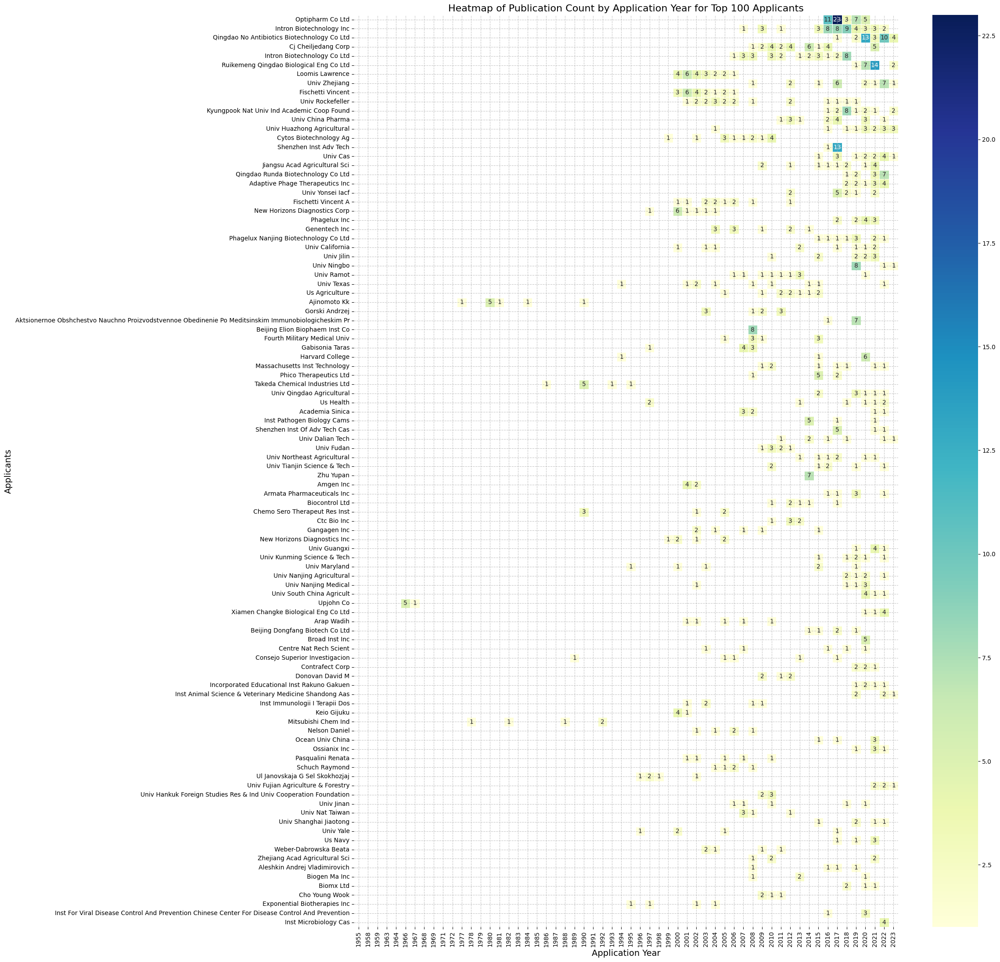

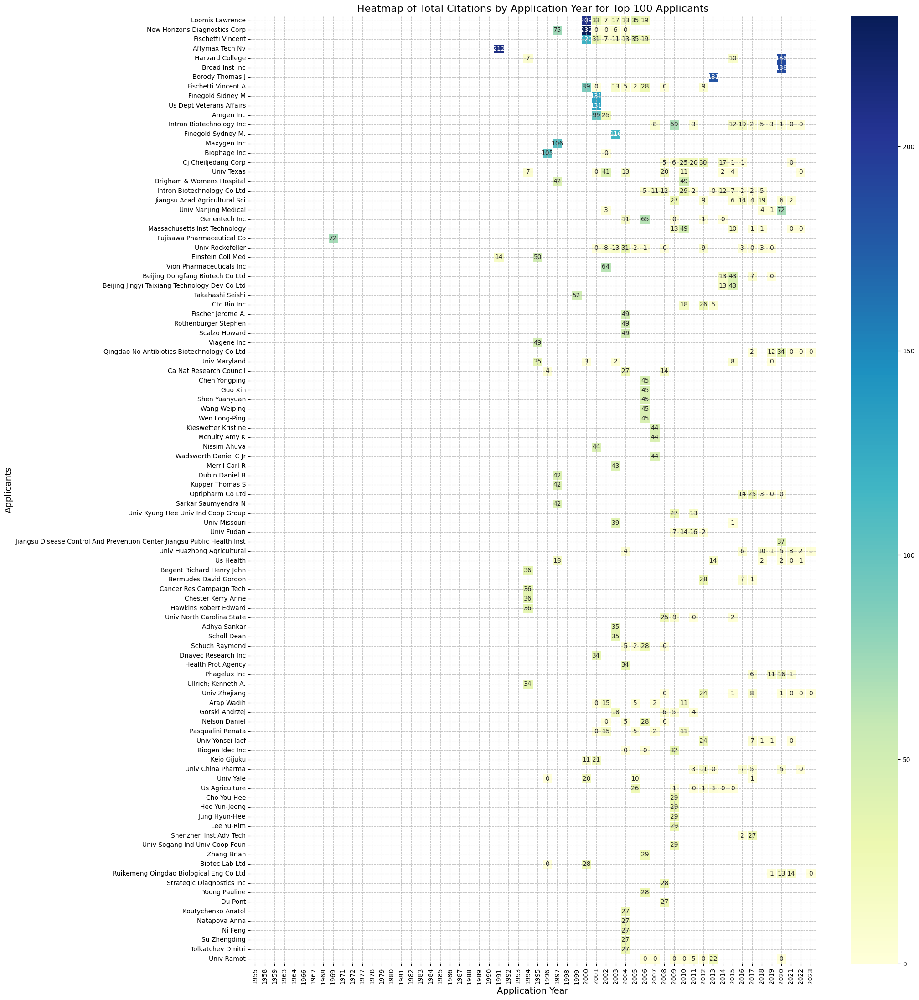

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Applicants'] = data_to_plot.apply(lambda row: f"{row['Applicants'].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index("Applicants")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of {metric} by Application Year for Top 100 Applicants", fontsize=16)
    plt.xlabel("Application Year", fontsize=14)
    plt.ylabel("Applicants", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
plot_top_50_heatmap(pivot_df, "Publication Count")
plot_top_50_heatmap(pivot_df, "Total Citations")
# plot_top_50_heatmap(pivot_df, "Average Citation Count")


### plot_top_applicants_by_interval: Plot the top applicants over a series of 5-year intervals using bar charts for various metrics.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap  # Importing textwrap

def plot_top_applicants_by_interval(pivot_df, start_year, end_year, metrics=("Publication Count", "Total Citations", "Average Citation Count")):
    """
    Plot the top applicants over a series of 5-year intervals using bar charts for various metrics.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame containing the metrics.
    - start_year (int): The starting year.
    - end_year (int): The ending year.
    - metrics (tuple): The metrics to be plotted.

    Returns:
    None.
    """
    # Determine the min and max application years
    start_year = data['Application Year'].min()
    end_year = data['Application Year'].max()


    intervals = [(year, year + 4) for year in range(start_year, end_year, 5)]
    n_intervals = len(intervals)

    for idx, metric in enumerate(metrics, 1):
        plt.figure(figsize=(25, 30))  # Adjusting figure size

        for j, (start, end) in enumerate(intervals, 1):
            try:
                # Aggregate data for this interval
                aggregated_data = pivot_df[metric].loc[:, start:end].sum(axis=1)
                top_10_applicants = aggregated_data.nlargest(10).reset_index()
                top_10_applicants = top_10_applicants.loc[top_10_applicants[0] != 0]


                # Wrapping title with year and applicant name
                top_10_applicants['Wrapped_Applicants'] = top_10_applicants.apply(lambda row: textwrap.fill(f" {row['Applicants'].title()}", 50), axis=1)

                # Plotting
                ax = plt.subplot(10, 3, j)  # Adjusted the subplot arrangement

                # Determine the color palette. Highlight the top applicant.
                #colors = sns.color_palette("coolwarm", n_colors=len(top_10_applicants))
                sns.barplot(y=top_10_applicants["Wrapped_Applicants"], x=top_10_applicants[0], orient='h', ax=ax, palette='viridis')

                ax.set_title(f"Top 10 Applicants for {start}-{end}", fontsize=16)
                ax.set_ylabel('Applicants', fontsize=14)
                ax.set_xlabel(metric, fontsize=14)
                ax.invert_yaxis()  # To have the applicant with the highest value at the top
                ax.grid(axis='x', linestyle='--', alpha=0.7)
                plt.xticks(fontsize=12)
                plt.yticks(fontsize=10)
                plt.gca().invert_yaxis()


            except KeyError as e:
                print(f"Error: {e}. The metric '{metric}' might not exist in the pivot_df. Please check the DataFrame's columns.")

        plt.tight_layout() #pad=3.0)  # Added padding for better spacing


        plt.suptitle('Top Applicants by Contribution & Recognition by 5 Year Interval', fontsize=18, y=1.02)
        plt.show()

# Example Usage:
#plot_top_applicants_by_interval(pivot_df, start_year=start_year, end_year=end_year)


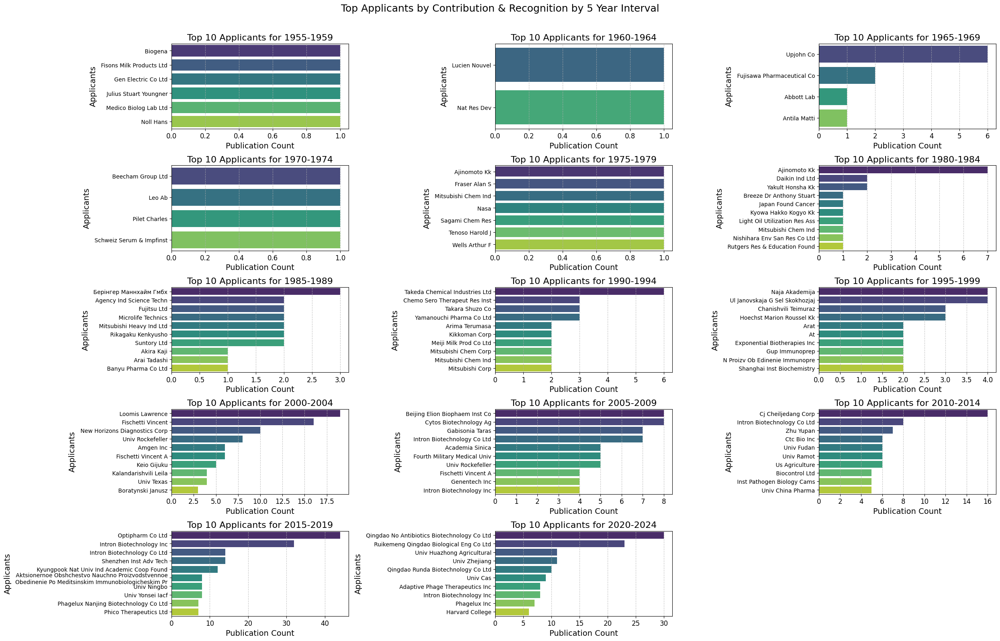

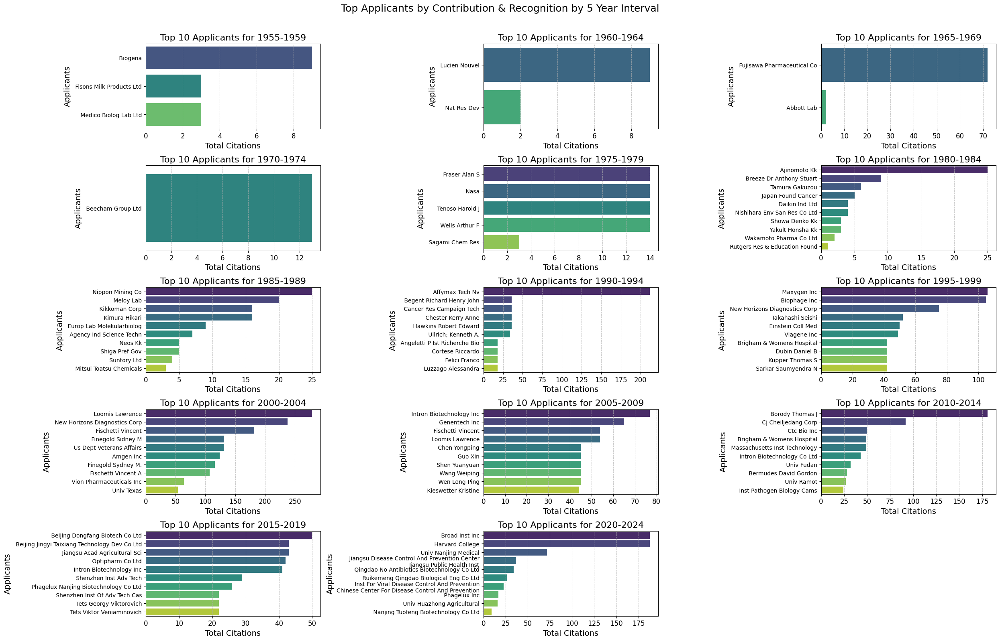

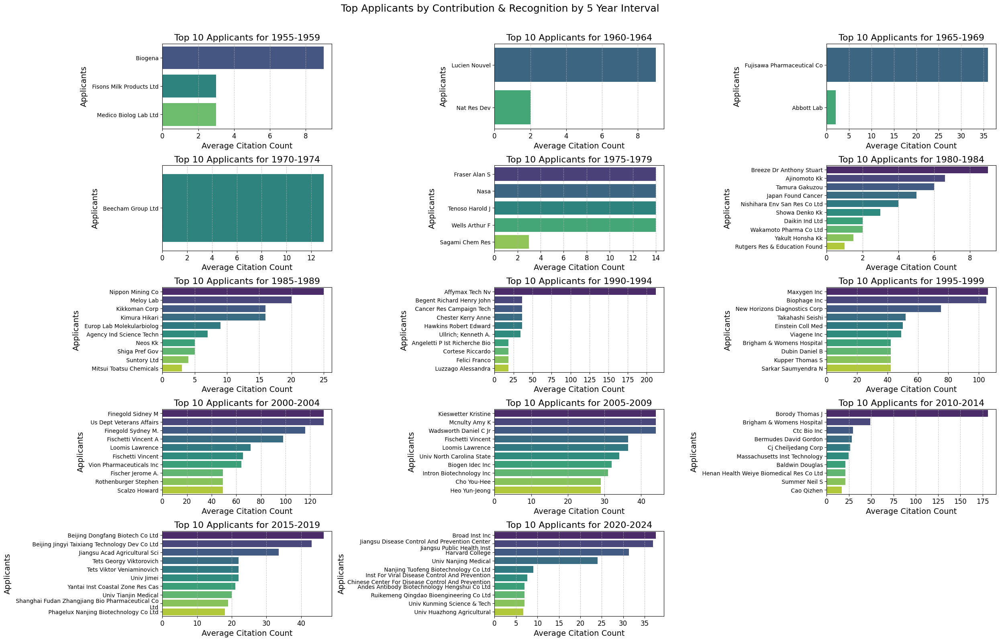

In [ ]:
plot_top_applicants_by_interval(pivot_df, start_year= data['Application Year'].min(), end_year = data['Application Year'].max())

### region

In [ ]:
data['Jurisdiction_Region']

0       Eastern Europe
1                 Asia
2              Oceania
3        North America
4              Oceania
             ...      
2360    Western Europe
2361    Western Europe
2362              Asia
2363              Asia
2364           Eurasia
Name: Jurisdiction_Region, Length: 2365, dtype: object

#### pivot_table applicant/region


In [ ]:
# Set the index
applicants_data = data.set_index(['Lens ID', 'Jurisdiction_Region'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip().to_frame()
    # Reset the index to re-organize data
applicants_list2 = applicants_list.reset_index()

grouped = applicants_list2.groupby(['Jurisdiction_Region', 'Applicants']).agg({
    'Lens ID': 'count'
}).reset_index()

pivot_df = grouped.pivot_table(index='Applicants', columns='Jurisdiction_Region', values=['Lens ID'], aggfunc='sum')#['Lens ID']

pivot_df


Lens ID       \
Jurisdiction_Region                                 Africa Asia   
Applicants                                                        
4D PHARMA LEON S L U                                   NaN  1.0   
ABAEV IGOR V                                           NaN  NaN   
ABBOTT LAB                                             NaN  NaN   
ABCELEX TECH INC                                       NaN  NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                NaN  1.0   
...                                                    ...  ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                 NaN  NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...     NaN  NaN   
경북대학교 산학협력단                                            NaN  1.0   
주식회사 비엠씨                                               NaN  1.0   
한국생명공학연구원                                              NaN  2.0   

                                                                           \
Jurisdiction_Region                                Eastern Europe Eurasia   
Applicants                                                                  
4D PHARMA LEON S L U                                          NaN     NaN   
ABAEV IGOR V                                                  NaN     NaN   
ABBOTT LAB                                                    NaN     NaN   
ABCELEX TECH INC                                              NaN     NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                       NaN     NaN   
...                                                           ...     ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                        3.0     NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...            1.0     NaN   
경북대학교 산학협력단                                                   NaN     NaN   
주식회사 비엠씨                                                      NaN     NaN   
한국생명공학연구원                                                     NaN     NaN   

                                                                         \
Jurisdiction_Region                                Europe International   
Applicants                                                                
4D PHARMA LEON S L U                                  NaN           NaN   
ABAEV IGOR V                                          NaN           NaN   
ABBOTT LAB                                            NaN           NaN   
ABCELEX TECH INC                                      NaN           NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD               NaN           NaN   
...                                                   ...           ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                NaN           NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...    NaN           NaN   
경북대학교 산학협력단                                           NaN           NaN   
주식회사 비엠씨                                              NaN           NaN   
한국생명공학연구원                                             NaN           NaN   

                                                                          \
Jurisdiction_Region                                North America Oceania   
Applicants                                                                 
4D PHARMA LEON S L U                                         NaN     NaN   
ABAEV IGOR V                                                 2.0     NaN   
ABBOTT LAB                                                   NaN     NaN   
ABCELEX TECH INC                                             NaN     1.0   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                      NaN     NaN   
...                                                          ...     ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                       NaN     NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...           NaN     NaN   
경북대학교 산학협력단                                                  NaN     NaN   
주식회사 비엠씨                                                     NaN     N

#### Heatmap of Juridiction Region of Application of the Top 100 Applicants

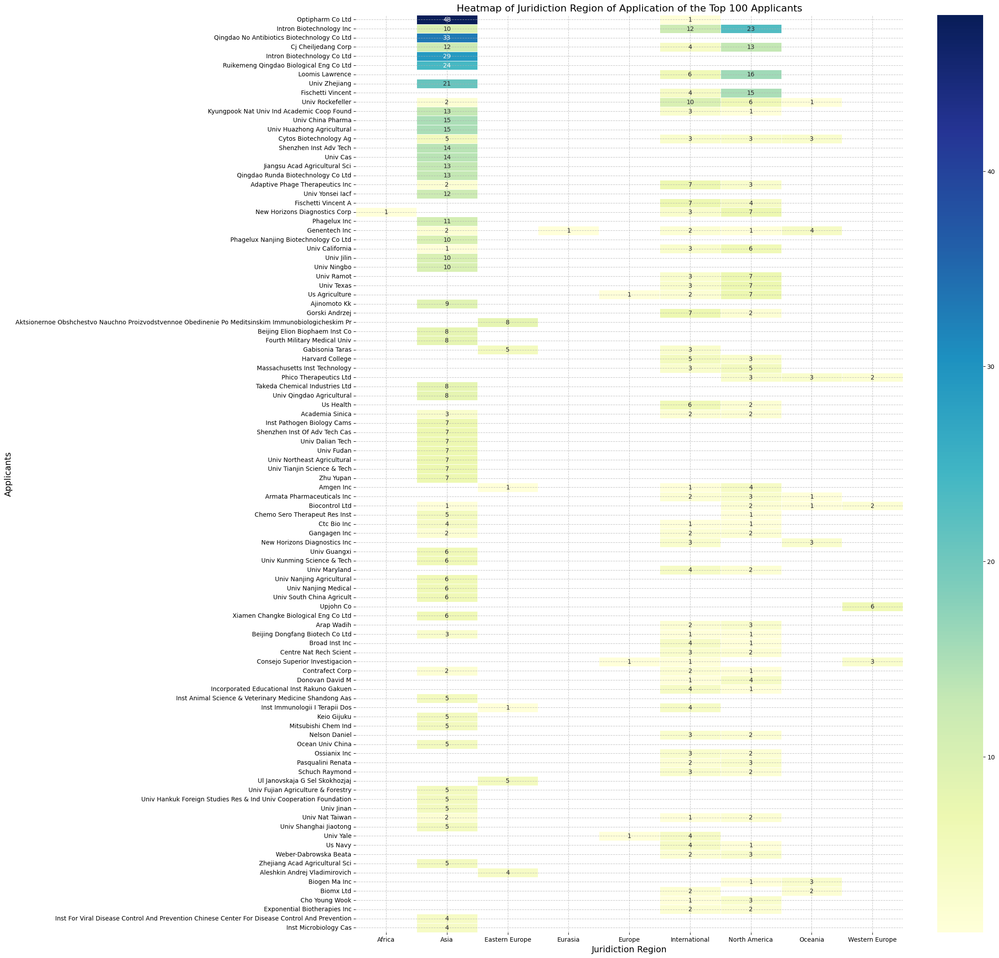

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Applicants'] = data_to_plot.apply(lambda row: f"{row['Applicants'].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index("Applicants")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of Juridiction Region of Application of the Top 100 Applicants", fontsize=16)
    plt.xlabel("Juridiction Region", fontsize=14)
    plt.ylabel("Applicants", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
plot_top_50_heatmap(pivot_df, "Lens ID")
#plot_top_50_heatmap(pivot_df, "Total Citations")
# plot_top_50_heatmap(pivot_df, "Average Citation Count")


#### Plots the top 10 Applicants for each Region

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_10_IPCR_by_country(data, ipcr_column, jurisdiction_column, top_n=10):
    """
    Plots the top 'n' IPCR classifications for each country in the provided data.

    Args:
    - data (pd.DataFrame): DataFrame containing jurisdiction and IPCR classifications columns.
    - ipcr_column (str): Name of the column containing the IPCR classifications.
    - jurisdiction_column (str): Name of the column containing the jurisdiction or country information.
    - top_n (int): The number of top IPCR classifications to plot for each country.

    Returns:
    None
    """
    #data = data.dropna(subset=jurisdiction_column)

    # Exploding the IPCR Classifications into individual rows
    exploded_data = data.assign(IPCR_Classifications=data[ipcr_column].str.split(';;')).explode('IPCR_Classifications').reset_index(drop=True)

    # 1. Group by Jurisdiction and IPCR Classifications
    grouped_data = exploded_data.groupby([jurisdiction_column, 'IPCR_Classifications']).size().reset_index(name='Counts').replace('', np.nan).dropna(subset='Counts')

    # Order jurisdictions by frequency
    jurisdiction_order = exploded_data[jurisdiction_column].value_counts().index.tolist()

    # 2. Extract Top N IPCR Classifications for Each Jurisdiction
    def get_top_n_IPCR(data_subset):
        return data_subset.sort_values(by='Counts', ascending=False).head(top_n)

    top_n_IPCR_per_jurisdiction = grouped_data.groupby(jurisdiction_column).apply(get_top_n_IPCR).reset_index(drop=True)


    # Wrapping title with year and applicant name
    top_n_IPCR_per_jurisdiction['Wrapped_IPCR_Classifications'] = top_n_IPCR_per_jurisdiction.apply(lambda row: textwrap.fill(f" {row['IPCR_Classifications'].title()}", 50), axis=1)



    # 3. Visualization
    jurisdictions = [j for j in jurisdiction_order if j in top_n_IPCR_per_jurisdiction[jurisdiction_column].unique()]

    # Define subplot grid dimensions
    num_columns = 3
    num_rows = -(-len(jurisdictions) // num_columns)  # Calculate ceiling of the division

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(25, 3 * num_rows))

    for idx, jurisdiction in enumerate(jurisdictions):
        ax = axes[idx // num_columns, idx % num_columns]
        jurisdiction_data = top_n_IPCR_per_jurisdiction[top_n_IPCR_per_jurisdiction[jurisdiction_column] == jurisdiction]
        sns.barplot(data=jurisdiction_data, y='Wrapped_IPCR_Classifications', x='Counts', orient='h', palette='viridis', ax=ax)
        ax.set_title(jurisdiction)
        ax.set_ylabel('')  # To reduce redundancy

    # Remove any unused subplots
    for j in range(idx + 1, num_rows * num_columns):
        if j < num_columns * num_rows:
            fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.suptitle('Top ' + str(top_n) + f' {ipcr_column} by Jurisdiction Region', fontsize=20, y=1.02)
    plt.show()

# Example usage:
#plot_top_10_IPCR_by_country(data, 'IPCR Classifications', 'Jurisdiction')


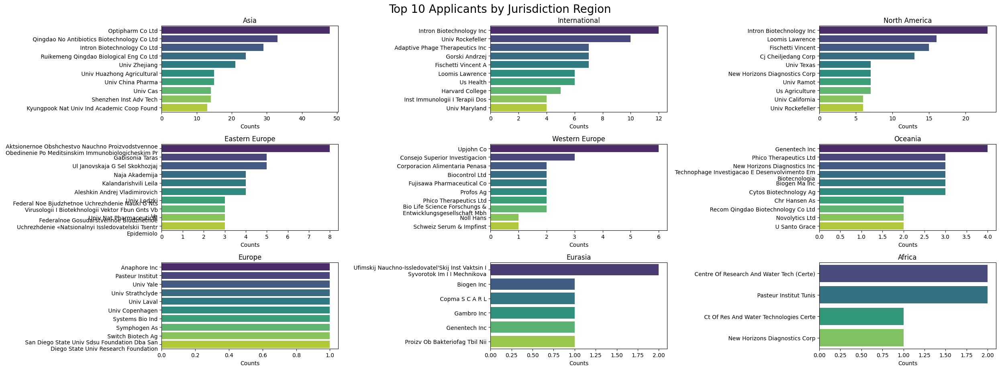

In [ ]:
plot_top_10_IPCR_by_country(data, 'Applicants', 'Jurisdiction_Region')

#### Comparison of Patent Applications, Applicant Counts, and Application/Applicant Ratio by Region

In [ ]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Application Year', 'Earliest Priority Year', 'Application_Year_Range',
       'IPCR Sections', 'IPCR Class', 'IPCR Subclass', 'Jurisdiction_name',
       'Jurisdiction_Region'],
      dtype='object')

In [ ]:
# Set the index
applicants_data = data.set_index(['Jurisdiction_Region'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Jurisdiction_Region,Applicants
0,Eastern Europe,NOVOSIB NII T
1,Eastern Europe,UBERKULEZA
2,Asia,TECNIFAR-INDUSTRIA TECNICA FARM S A
3,Asia,TECHNOPHAGE INVESTIG E DES
4,Oceania,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A
...,...,...
3337,Asia,CHUNQING LUO
3340,Eurasia,GAMBRO INC
3343,Asia,TCM BIOTECH INT CORP
3344,Asia,FLAGSHIP PIONEERING INNOVATIONS V INC


In [ ]:
applicants_count_year = applicants_list['Jurisdiction_Region'].value_counts().rename('Applicants counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

Asia              755
International     631
North America     454
Eastern Europe    177
Western Europe     61
Oceania            51
Europe             31
Eurasia             6
Africa              4
Name: Applicants counts, dtype: int64

##### table


In [ ]:
count_year_1 = data['Jurisdiction_Region'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Region'}).sort_values('Application', ascending=False)
#data_trend_applicants_count['Ratio '] =
data_trend_applicants_count.head(60)

,Region,Application,Applicants counts
0,Asia,1321,755
1,North America,382,454
2,International,333,631
3,Eastern Europe,174,177
4,Western Europe,65,61
5,Oceania,52,51
6,Europe,25,31
7,Eurasia,7,6
8,Africa,6,4


In [ ]:
data_trend_applicants_count['Application'].sum()

2365

##### graph

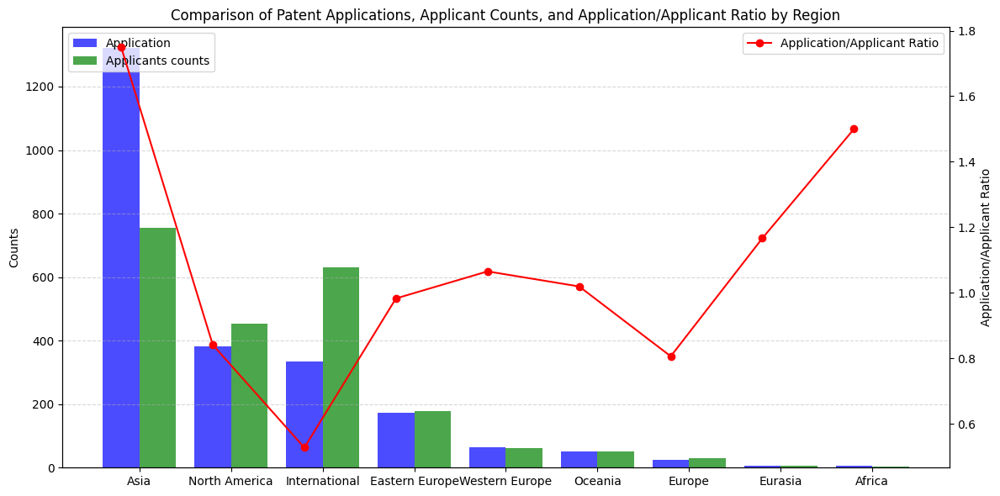

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (replace this with your actual DataFrame)
df = data_trend_applicants_count

# Calculate the ratio of Applications per Applicant
df['Ratio'] = df['Application'] / df['Applicants counts']

# Setting the positions and width for the bars
pos = list(range(len(df['Application'])))
width = 0.4

# Plotting the bars
fig, ax1 = plt.subplots(figsize=(12, 6))

# Creating bars for 'Application'
ax1.bar(pos, df['Application'], width, alpha=0.7, color='blue', label='Application')

# Creating bars for 'Applicants counts' with an offset (pos + width)
ax1.bar([p + width for p in pos], df['Applicants counts'], width, alpha=0.7, color='green', label='Applicants counts')

# Setting axis labels, title, and ticks for the first y-axis
ax1.set_ylabel('Counts')
ax1.set_title('Comparison of Patent Applications, Applicant Counts, and Application/Applicant Ratio by Region')
ax1.set_xticks([p + width / 2 for p in pos])
ax1.set_xticklabels(df['Region'])
ax1.legend(['Application', 'Applicants counts'], loc='upper left')

# Creating a secondary y-axis for the ratio
ax2 = ax1.twinx()
ax2.plot(df['Region'], df['Ratio'], color='red', marker='o', label='Application/Applicant Ratio')
ax2.set_ylabel('Application/Applicant Ratio')
ax2.legend(['Application/Applicant Ratio'], loc='upper right')

# Rotate labels for better readability
plt.xticks(rotation=90)

# Adding grid
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


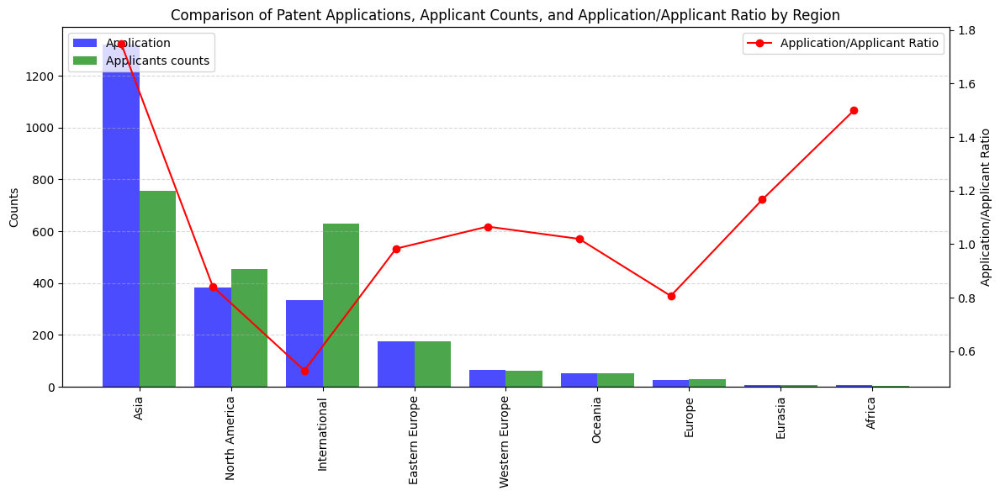

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
df = data_trend_applicants_count

# Calculate the ratio of Applications per Applicant
df['Ratio'] = df['Application'] / df['Applicants counts']

# Setting the positions and width for the bars
pos = list(range(len(df['Application'])))
width = 0.4

# Plotting the bars
fig, ax1 = plt.subplots(figsize=(12, 6))

# Creating bars for 'Application'
ax1.bar(pos, df['Application'], width, alpha=0.7, color='blue', label='Application')

# Creating bars for 'Applicants counts' with an offset (pos + width)
ax1.bar([p + width for p in pos], df['Applicants counts'], width, alpha=0.7, color='green', label='Applicants counts')

# Setting axis labels, title, and ticks for the first y-axis
ax1.set_ylabel('Counts')
ax1.set_title('Comparison of Patent Applications, Applicant Counts, and Application/Applicant Ratio by Region')

# Set the x-ticks and rotate labels for better readability
ax1.set_xticks([p + width / 2 for p in pos])
ax1.set_xticklabels(df['Region'], rotation=90)

# Creating a secondary y-axis for the ratio
ax2 = ax1.twinx()
ax2.plot(df['Region'], df['Ratio'], color='red', marker='o', label='Application/Applicant Ratio')
ax2.set_ylabel('Application/Applicant Ratio')

# Adding legends
ax1.legend(['Application', 'Applicants counts'], loc='upper left')
ax2.legend(['Application/Applicant Ratio'], loc='upper right')

# Adding grid
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


### Country

#### pivot_table applicants/countries

In [ ]:
# Set the index
applicants_data = data.set_index(['Lens ID', 'Jurisdiction_name'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip().to_frame()
    # Reset the index to re-organize data
applicants_list2 = applicants_list.reset_index()

grouped = applicants_list2.groupby(['Jurisdiction_name', 'Applicants']).agg({
    'Lens ID': 'count'
}).reset_index()

pivot_df = grouped.pivot_table(index='Applicants', columns='Jurisdiction_name', values=['Lens ID'], aggfunc='sum')#['Lens ID']

pivot_df


Lens ID                  \
Jurisdiction_name                                  Australia Bulgaria Canada   
Applicants                                                                     
4D PHARMA LEON S L U                                     NaN      NaN    NaN   
ABAEV IGOR V                                             NaN      NaN    NaN   
ABBOTT LAB                                               NaN      NaN    NaN   
ABCELEX TECH INC                                         1.0      NaN    NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                  NaN      NaN    NaN   
...                                                      ...      ...    ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                   NaN      NaN    NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...       NaN      NaN    NaN   
경북대학교 산학협력단                                              NaN      NaN    NaN   
주식회사 비엠씨                                                 NaN      NaN    NaN   
한국생명공학연구원                                                NaN      NaN    NaN   

                                                                         \
Jurisdiction_name                                  China Czech Republic   
Applicants                                                                
4D PHARMA LEON S L U                                 NaN            NaN   
ABAEV IGOR V                                         NaN            NaN   
ABBOTT LAB                                           NaN            NaN   
ABCELEX TECH INC                                     NaN            NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD              1.0            NaN   
...                                                  ...            ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                               NaN            NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...   NaN            NaN   
경북대학교 산학협력단                                          NaN            NaN   
주식회사 비엠씨                                             NaN            NaN   
한국생명공학연구원                                            NaN            NaN   

                                                                                 \
Jurisdiction_name                                  Eurasian Patent Organization   
Applicants                                                                        
4D PHARMA LEON S L U                                                        NaN   
ABAEV IGOR V                                                                NaN   
ABBOTT LAB                                                                  NaN   
ABCELEX TECH INC                                                            NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                                     NaN   
...                                                                         ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                                      NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...                          NaN   
경북대학교 산학협력단                                                                 NaN   
주식회사 비엠씨                                                                    NaN   
한국생명공학연구원                                                                   NaN   

                                                                           \
Jurisdiction_name                                  European Patent Office   
Applicants                                                                  
4D PHARMA LEON S L U                                                  NaN   
ABAEV IGOR V                                                          NaN   
ABBOTT LAB                                                            NaN   
ABCELEX TECH INC                                                      NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                               NaN   
...                                                                   ...   
БЕРІНГЕР МАННХАЙМ ГМБХ   

#### Heatmap of Juridiction Country of Application of the Top 100 Applicants

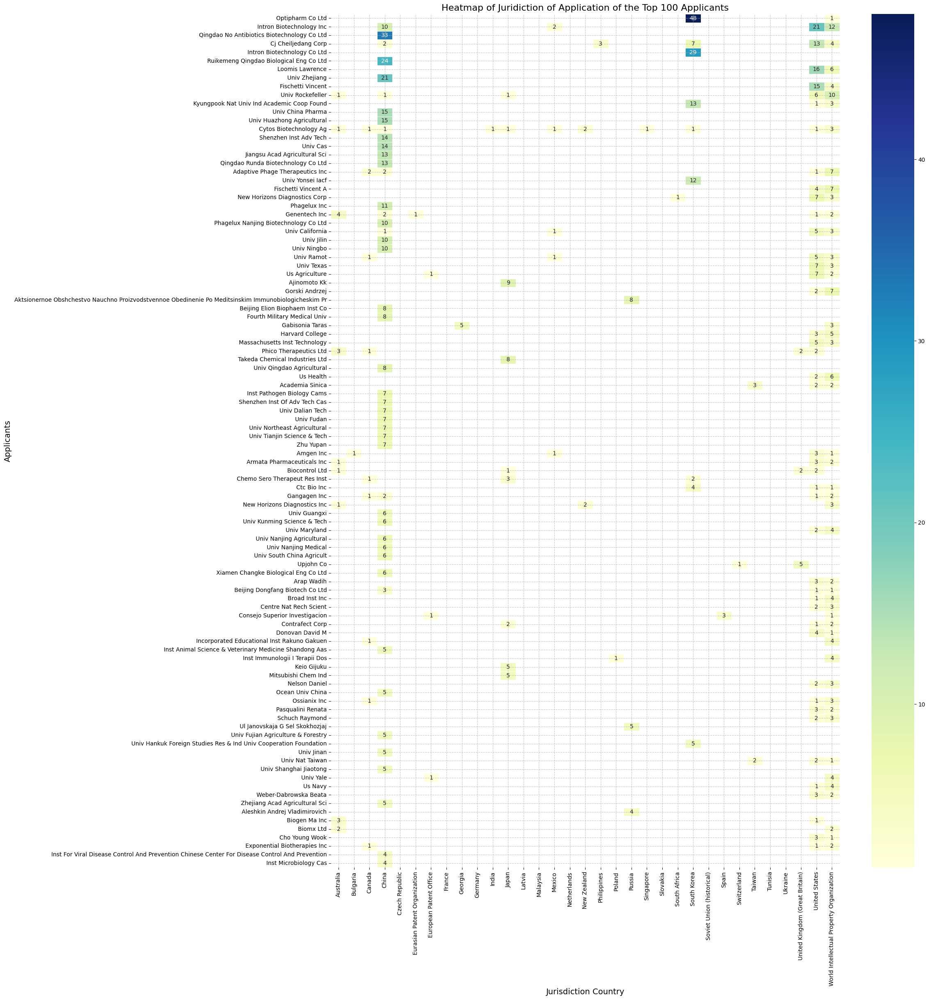

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Applicants'] = data_to_plot.apply(lambda row: f"{row['Applicants'].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index("Applicants")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of Juridiction of Application of the Top 100 Applicants", fontsize=16)
    plt.xlabel("Jurisdiction Country", fontsize=14)
    plt.ylabel("Applicants", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
plot_top_50_heatmap(pivot_df, "Lens ID")
#plot_top_50_heatmap(pivot_df, "Total Citations")
# plot_top_50_heatmap(pivot_df, "Average Citation Count")


#### Plots the top 10 Applicants for each Jurisdiction

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_10_IPCR_by_country(data, ipcr_column, jurisdiction_column, top_n=10):
    """
    Plots the top 'n' IPCR classifications for each country in the provided data.

    Args:
    - data (pd.DataFrame): DataFrame containing jurisdiction and IPCR classifications columns.
    - ipcr_column (str): Name of the column containing the IPCR classifications.
    - jurisdiction_column (str): Name of the column containing the jurisdiction or country information.
    - top_n (int): The number of top IPCR classifications to plot for each country.

    Returns:
    None
    """
    #data = data.dropna(subset=jurisdiction_column)

    # Exploding the IPCR Classifications into individual rows
    exploded_data = data.assign(IPCR_Classifications=data[ipcr_column].str.split(';;')).explode('IPCR_Classifications').reset_index(drop=True)

    # 1. Group by Jurisdiction and IPCR Classifications
    grouped_data = exploded_data.groupby([jurisdiction_column, 'IPCR_Classifications']).size().reset_index(name='Counts').replace('', np.nan).dropna(subset='Counts')

    # Order jurisdictions by frequency
    jurisdiction_order = exploded_data[jurisdiction_column].value_counts().index.tolist()

    # 2. Extract Top N IPCR Classifications for Each Jurisdiction
    def get_top_n_IPCR(data_subset):
        return data_subset.sort_values(by='Counts', ascending=False).head(top_n)

    top_n_IPCR_per_jurisdiction = grouped_data.groupby(jurisdiction_column).apply(get_top_n_IPCR).reset_index(drop=True)


    # Wrapping title with year and applicant name
    top_n_IPCR_per_jurisdiction['Wrapped_IPCR_Classifications'] = top_n_IPCR_per_jurisdiction.apply(lambda row: textwrap.fill(f" {row['IPCR_Classifications'].title()}", 50), axis=1)



    # 3. Visualization
    jurisdictions = [j for j in jurisdiction_order if j in top_n_IPCR_per_jurisdiction[jurisdiction_column].unique()]

    # Define subplot grid dimensions
    num_columns = 3
    num_rows = -(-len(jurisdictions) // num_columns)  # Calculate ceiling of the division

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(25, 3 * num_rows))

    for idx, jurisdiction in enumerate(jurisdictions):
        ax = axes[idx // num_columns, idx % num_columns]
        jurisdiction_data = top_n_IPCR_per_jurisdiction[top_n_IPCR_per_jurisdiction[jurisdiction_column] == jurisdiction]
        sns.barplot(data=jurisdiction_data, y='Wrapped_IPCR_Classifications', x='Counts', orient='h', palette='viridis', ax=ax)
        ax.set_title(jurisdiction)
        ax.set_ylabel('')  # To reduce redundancy

    # Remove any unused subplots
    for j in range(idx + 1, num_rows * num_columns):
        if j < num_columns * num_rows:
            fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.suptitle('Top ' + str(top_n) + f' {ipcr_column} by Jurisdiction', fontsize=20, y=1.02)
    plt.show()

# Example usage:
#plot_top_10_IPCR_by_country(data, 'IPCR Classifications', 'Jurisdiction')


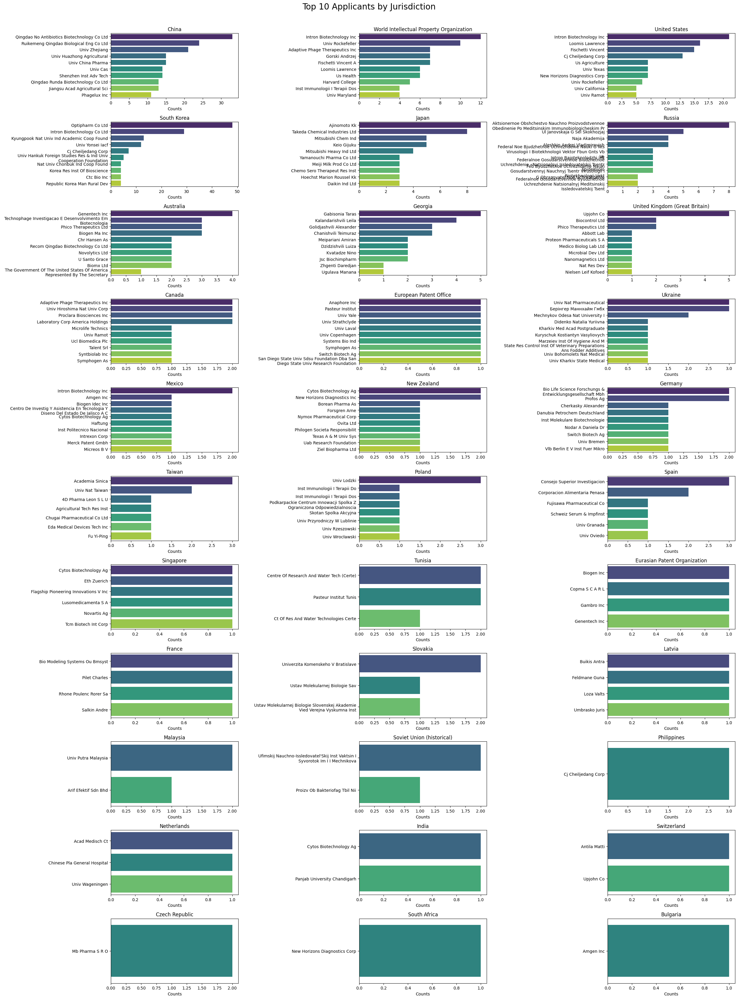

In [ ]:
plot_top_10_IPCR_by_country(data, 'Applicants', 'Jurisdiction_name')

#### Comparison of Patent Applications, Applicant Counts, and Application/Applicant Ratio by Country

In [ ]:
# Set the index
applicants_data = data.set_index(['Jurisdiction_name'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Applicants'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Jurisdiction_name,Applicants
0,Russia,NOVOSIB NII T
1,Russia,UBERKULEZA
2,Japan,TECNIFAR-INDUSTRIA TECNICA FARM S A
3,Japan,TECHNOPHAGE INVESTIG E DES
4,Australia,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A
...,...,...
3339,United Kingdom (Great Britain),FUJISAWA PHARMACEUTICAL CO
3340,Eurasian Patent Organization,GAMBRO INC
3343,Singapore,TCM BIOTECH INT CORP
3344,Singapore,FLAGSHIP PIONEERING INNOVATIONS V INC


In [ ]:
applicants_count_year = applicants_list['Jurisdiction_name'].value_counts().rename('Applicants counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

World Intellectual Property Organization    631
China                                       521
United States                               433
Japan                                       153
Russia                                      119
South Korea                                  75
Australia                                    43
United Kingdom (Great Britain)               39
European Patent Office                       31
Georgia                                      29
Canada                                       29
Mexico                                       15
Ukraine                                      14
New Zealand                                  10
Germany                                       9
Poland                                        8
Taiwan                                        7
Singapore                                     6
Spain                                         6
France                                        4
Latvia                                  

##### table

In [ ]:
count_year_1 = data['Jurisdiction_name'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Country'}).sort_values('Application', ascending=False)
#data_trend_applicants_count['Ratio '] =
data_trend_applicants_count.head(60)

,Country,Application,Applicants counts
0,China,904,521
1,United States,336,433
2,World Intellectual Property Organization,333,631
3,South Korea,209,75
4,Japan,186,153
5,Russia,126,119
6,Australia,40,43
7,United Kingdom (Great Britain),39,39
8,Canada,31,29
9,European Patent Office,25,31


In [ ]:
data_trend_applicants_count['Application'].sum()

2365

##### Graph

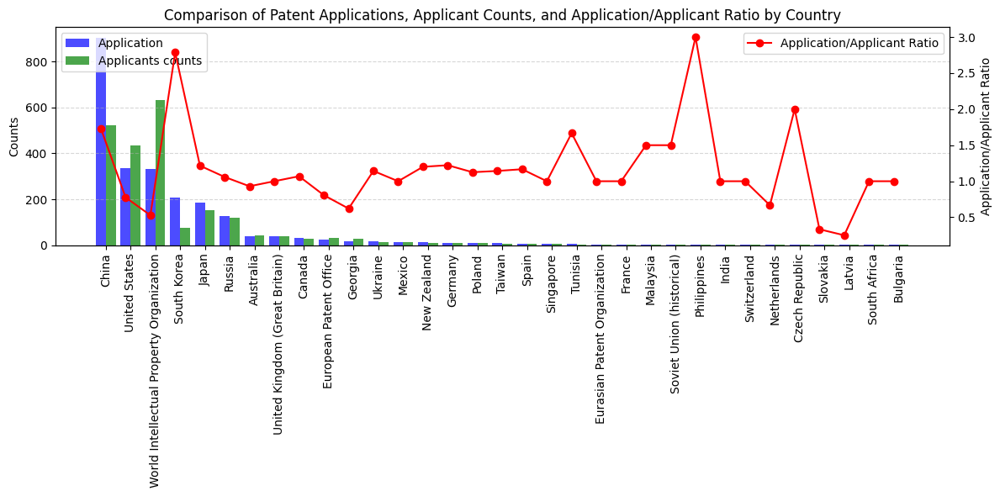

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
df = data_trend_applicants_count

# Calculate the ratio of Applications per Applicant
df['Ratio'] = df['Application'] / df['Applicants counts']

# Setting the positions and width for the bars
pos = list(range(len(df['Application'])))
width = 0.4

# Plotting the bars
fig, ax1 = plt.subplots(figsize=(12, 6))

# Creating bars for 'Application'
ax1.bar(pos, df['Application'], width, alpha=0.7, color='blue', label='Application')

# Creating bars for 'Applicants counts' with an offset (pos + width)
ax1.bar([p + width for p in pos], df['Applicants counts'], width, alpha=0.7, color='green', label='Applicants counts')

# Setting axis labels, title, and ticks for the first y-axis
ax1.set_ylabel('Counts')
ax1.set_title('Comparison of Patent Applications, Applicant Counts, and Application/Applicant Ratio by Country')

# Set the x-ticks and rotate labels for better readability
ax1.set_xticks([p + width / 2 for p in pos])
ax1.set_xticklabels(df['Country'], rotation=90)

# Creating a secondary y-axis for the ratio
ax2 = ax1.twinx()
ax2.plot(df['Country'], df['Ratio'], color='red', marker='o', label='Application/Applicant Ratio')
ax2.set_ylabel('Application/Applicant Ratio')

# Adding legends
ax1.legend(['Application', 'Applicants counts'], loc='upper left')
ax2.legend(['Application/Applicant Ratio'], loc='upper right')

# Adding grid
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


## Inventors

### process_Inventors_data : count patents and sum citations per inventors

In [ ]:
import pandas as pd

def process_Inventors_data(data, pickle_path=None, csv_path=None):
    """
    Process the given data to count patents and sum citations per applicant.

    Parameters:
    - data (pd.DataFrame): The input data containing the relevant fields.
    - pickle_path (str, optional): The path to save the processed data as a pickle file.
    - csv_path (str, optional): The path to save the processed data as a CSV file.

    Returns:
    - grouped (pd.DataFrame): The processed data.
    """

    # Set the index
    Inventors_data = data.set_index(['Lens ID', 'Application Year', 'Cited by Patent Count'])

    # Split and explode the 'Inventors' field
    Inventors_list = Inventors_data['Inventors'].str.split(';;').explode().str.strip()

    # Count the unique Inventors names
    unique_Inventors_count = Inventors_list.nunique()
    print('The number of unique Inventors is:', unique_Inventors_count)

    # Reset the index to re-organize data
    Inventors_list2 = Inventors_list.to_frame().reset_index()

    # Group by Inventors to count patents and sum citations
    grouped = Inventors_list2.groupby('Inventors').agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate additional metrics
    grouped['%'] = (grouped['Lens ID'] / Inventors_data['Inventors'].count()) * 100
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Inventors', 'Patent Count', 'Total Citations', 'Percentage of Total Patents', 'Average Citation Count']

    # Save the data if paths are provided
    if pickle_path:
        grouped.to_pickle(pickle_path)
    if csv_path:
        grouped.to_csv(csv_path)

    return grouped

# Example usage:
#grouped_data = process_Inventors_data(data, pickle_path='/path/to/your/directory/Inventors_count_citation_therapy.pkl', csv_path='/path/to/your/directory/Inventors_count_citation_therapy.csv')
#grouped_data#.head(50)


In [ ]:
grouped_data = process_Inventors_data(data)
grouped_data

The number of unique Inventors is: 5824


,Inventors,Patent Count,Total Citations,Percentage of Total Patents,Average Citation Count
0,A MINA,1,4,0.042918,4.000000
1,A P NETHRAVATHI,1,0,0.042918,0.000000
2,ABAEV IGOR V,3,1,0.128755,0.333333
3,ABDULAMIR AHMED SAHIB,1,0,0.042918,0.000000
4,ABE TAKAYOSHI,1,1,0.042918,1.000000
...,...,...,...,...,...
5819,박선영,2,0,0.085837,0.000000
5820,박예림,1,0,0.042918,0.000000
5821,이남경,2,0,0.085837,0.000000
5822,정혜주,1,0,0.042918,0.000000


In [ ]:
sorted_df = grouped_data[['Inventors', 'Patent Count']].sort_values(by='Patent Count', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Patent Count
1908,Jun Soo Youn,65
1982,Kang Sang Hyeon,65
5306,Yoon Seong Jun,64
2129,Kim Young Ju,50
2077,Kim Hyun Il,49
5261,Yeon Young Eun,42
3454,Park Charl Se,41
4223,Sun Huzhi,41
890,Du Xinyong,40
3707,Ren Huiying,40


In [ ]:
sorted_df = grouped_data[['Inventors', 'Total Citations']].sort_values(by='Total Citations', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Total Citations
2818,Loomis Lawrence,649
1043,Fischetti Vincent,558
725,Cwirla Steven E,212
872,Dower William J,212
200,Barrett Ronald W,212
846,Doman Jordan,185
2686,Liu David,185
309,Borody Thomas Julius,181
1044,Fischetti Vincent A,172
768,Davis Jessie,146


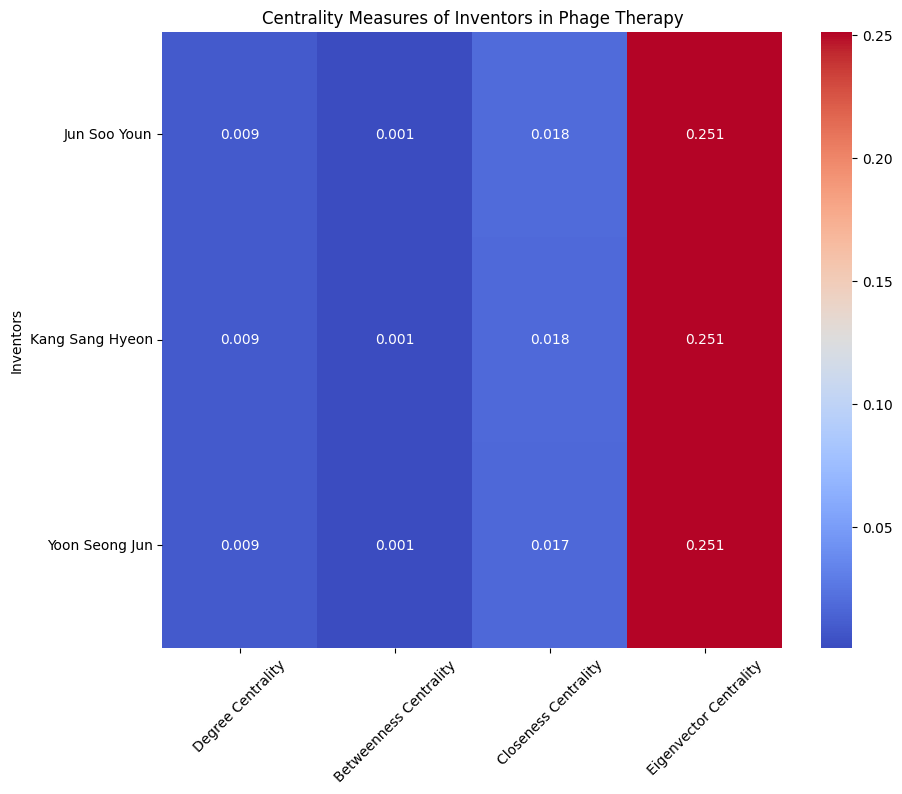

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data - replace this with your actual DataFrame
# Here I'm assuming your DataFrame is named 'df' and it has the following structure
data2 = {
    'Inventors': ['Jun Soo Youn', 'Kang Sang Hyeon', 'Yoon Seong Jun'],  # Add all inventors
    'Degree Centrality': [0.008876, 0.008876, 0.008699],  # Add corresponding values
    'Betweenness Centrality': [0.001376, 0.001322, 0.000766],
    'Closeness Centrality': [0.018476, 0.018138, 0.016974],
    'Eigenvector Centrality': [0.251492, 0.251492, 0.251492]
    # Add other columns if needed
}

df = pd.DataFrame(data2)
df.set_index('Inventors', inplace=True)

# Normalize data if needed
#df = (df - df.min()) / (df.max() - df.min())

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df, annot=True, fmt=".3f", cmap='coolwarm')
plt.title('Centrality Measures of Inventors in Phage Therapy')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


### Patent Inventors and Inventor Counts Over the Years

In [ ]:
# Set the index
applicants_data = data.set_index(['Application Year'])

# Split and explode the 'Inventors' field
applicants_list = applicants_data['Inventors'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Application Year,Inventors
0,2001,KURUNOV JU N
1,2001,KURUNOVA N N
2,2001,SHATALOVA N D
3,2015,MIGUEL ANGELO DA COSTA GARCIA
4,2015,CARLOS JORGE SOUSA DE SAO JOSE
...,...,...
9617,2018,ARMEN ZACHARY
9618,2018,CEZAR CHRISTINE
9619,2018,MARTIN BARRY
9620,2018,AVENDANO AMADO MAIER


In [ ]:
applicants_count_year = applicants_list['Application Year'].value_counts().rename('Inventor counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

2021    720
2022    690
2020    595
2019    564
2017    408
2018    353
2015    336
2016    323
2013    235
2012    232
2010    220
2014    217
2023    215
2008    199
2009    177
2011    174
2002    153
2007    147
2004    147
2003    140
2001    100
2005     96
2006     90
1999     87
1990     82
2000     68
1997     65
1991     63
1998     63
1995     60
1989     47
1994     43
1988     41
1996     29
1986     27
1993     24
1992     23
1984     20
1987     19
1985     18
1977     10
1981     10
1982      6
1955      5
1980      4
1978      2
1969      2
1979      2
1968      1
1959      1
1963      1
1958      1
1983      1
1964      1
1971      1
1967      1
1972      1
1966      1
Name: Inventor counts, dtype: Int64

In [ ]:
#count_year_1

#### table

In [ ]:
count_year_1 = data['Application Year'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Year'}).sort_values('Year', ascending=False)
data_trend_applicants_count.head(60)

,Year,Application,Inventor counts
19,2023,46,215
2,2022,175,690
0,2021,206,720
1,2020,180,595
3,2019,165,564
5,2018,124,353
4,2017,164,408
6,2016,114,323
7,2015,106,336
9,2014,74,217


#### Graph

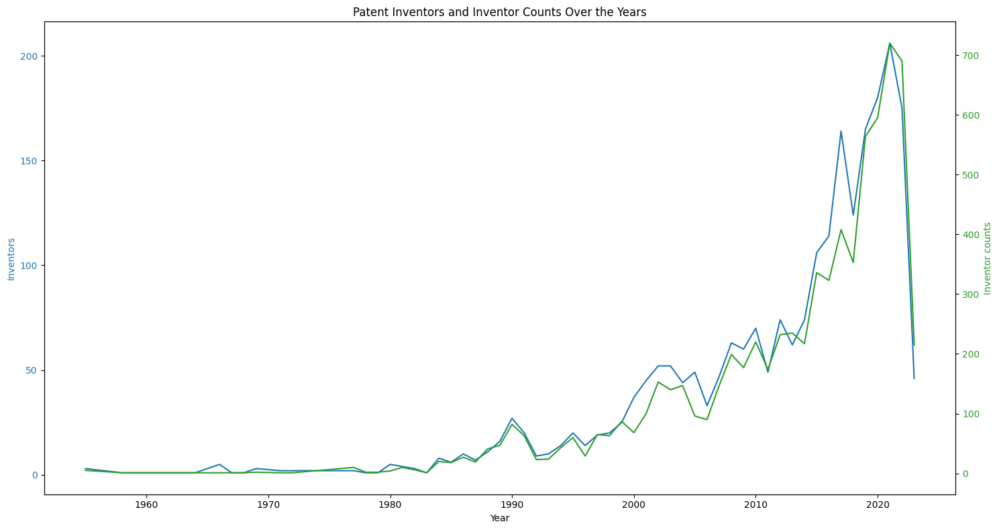

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (replace this with your actual DataFrame)

# Sorting the DataFrame by year
df = data_trend_applicants_count.sort_values(by='Year')

# Creating the plot
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting 'Inventors' on the primary y-axis
color = 'tab:blue'
ax1.set_xlabel('Year')
ax1.set_ylabel('Inventors', color=color)
ax1.plot(df['Year'], df['Application'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Creating a secondary y-axis for 'Inventors counts'
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Inventor counts', color=color)
ax2.plot(df['Year'], df['Inventor counts'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Title and layout
plt.title('Patent Inventors and Inventor Counts Over the Years')
fig.tight_layout()

# Show the plot
plt.show()


### Relationship Between Number of Inventors and Number of Applications

#### Graph

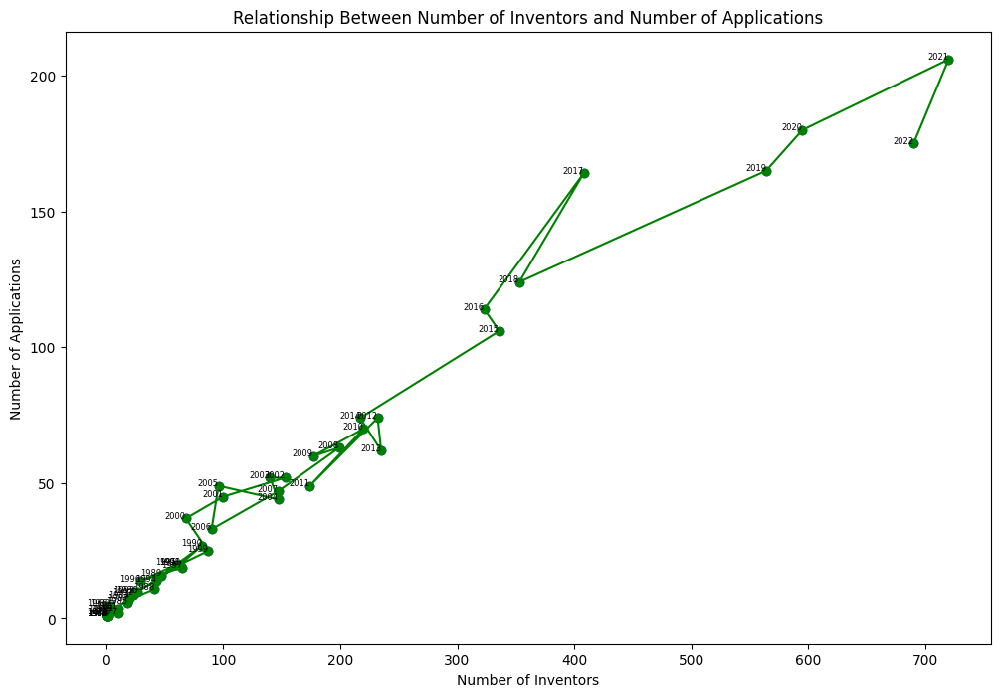

Pearson Correlation Coefficient: 0.9857319650213977
p value: 2.9760197698235986e-44
The correlation is statistically significant.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats

# Sample DataFrame (replace this with your actual DataFrame)
df = pd.DataFrame(data_trend_applicants_count).sort_values(by='Year')
# Delete rows where 'Year' is 2023
df = df[df['Year'] != 2023]

# Creating the scatter plot and line plot
plt.figure(figsize=(12, 8))
plt.scatter(df['Inventor counts'], df['Application'], c='blue', marker='o')
plt.plot(df['Inventor counts'], df['Application'], c='green', marker='o')  # Line connecting the points

# Adding year labels to each point
for idx, row in df.iterrows():
    plt.text(row['Inventor counts'], row['Application'], str(row['Year']), fontsize=6, ha='right')

# Adding labels and title
plt.xlabel('Number of Inventors')
plt.ylabel('Number of Applications')
plt.title('Relationship Between Number of Inventors and Number of Applications')

# Show the plot
plt.show()

# Pearson Correlation Coefficient
correlation_coefficient, p_value = scipy.stats.pearsonr(df['Inventor counts'], df['Application'])
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")
print(f"p value: {p_value}")

# Interpreting the results
if p_value < 0.05:
    print("The correlation is statistically significant.")
else:
    print("The correlation is not statistically significant.")


### Top 10 inventors (Graphs)

1.   Top 10 Inventors by Patent Count
2.   Top 10 Inventors by Total Citations
3.   Patent Count vs. Average Citation Count






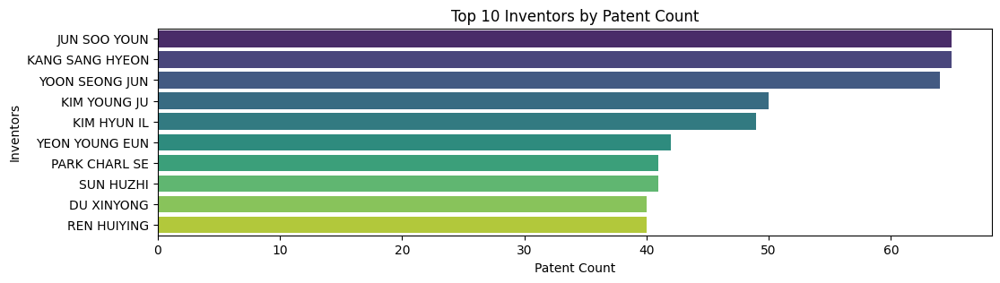

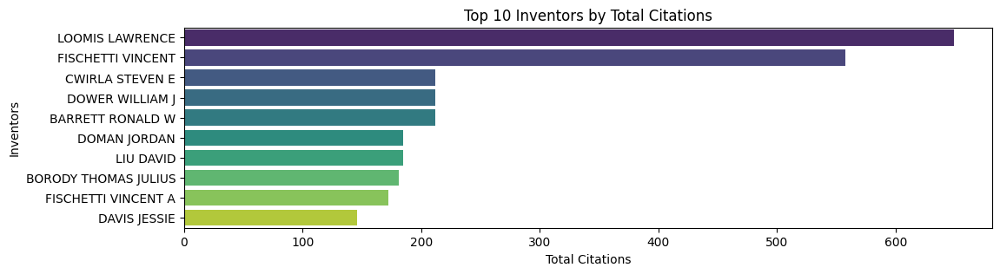

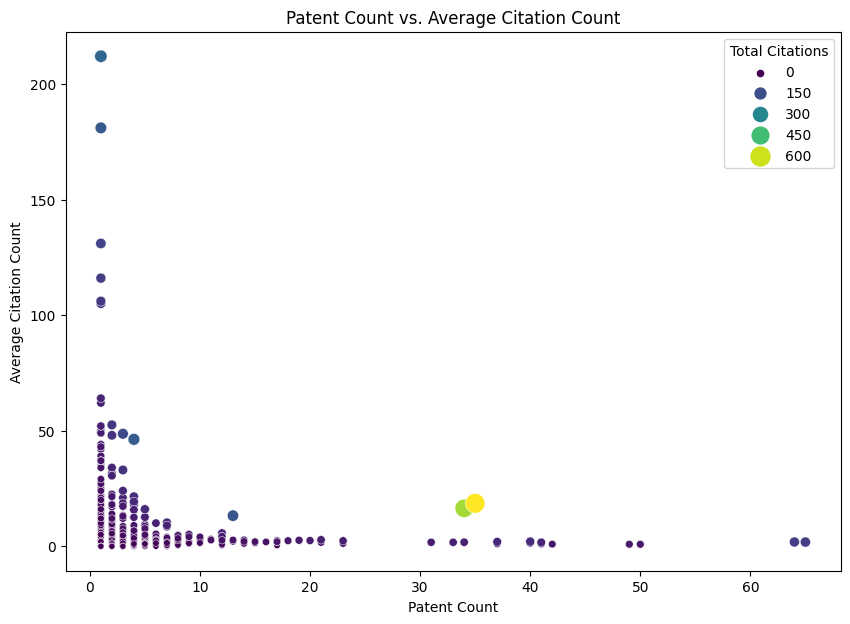

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_applicant_data(grouped_data):

    # Top Inventors by Patent Count
    plt.figure(figsize=(12, 3))
    top_Inventors_by_patents = grouped_data.sort_values(by="Patent Count", ascending=False).head(10)
    sns.barplot(data=top_Inventors_by_patents, y='Inventors', x='Patent Count', palette='viridis')
    plt.title("Top 10 Inventors by Patent Count")
    plt.show()

    # Top Inventors by Total Citations
    plt.figure(figsize=(12, 3))
    top_Inventors_by_citations = grouped_data.sort_values(by="Total Citations", ascending=False).head(10)
    sns.barplot(data=top_Inventors_by_citations, y='Inventors', x='Total Citations', palette='viridis')
    plt.title("Top 10 Inventors by Total Citations")
    plt.show()

    # Scatter Plot of Patent Count vs. Average Citation Count
    plt.figure(figsize=(10, 7))
    sns.scatterplot(data=grouped_data, x='Patent Count', y='Average Citation Count', hue='Total Citations', size='Total Citations', sizes=(20, 200), palette='viridis')
    plt.title("Patent Count vs. Average Citation Count")
    plt.show()

# Call the function
plot_applicant_data(grouped_data)


### Application Year

#### pivot_table inventor/year

In [ ]:
import pandas as pd

def group_and_pivot_Inventors(Inventors_list2: pd.DataFrame) -> pd.DataFrame:
    """
    Group patent data by 'Application Year' and 'Inventors' and then pivot the result.

    Parameters:
    - Inventors_list2 (pd.DataFrame): DataFrame containing patent data.

    Returns:
    - pd.DataFrame: Pivoted DataFrame with metrics as multi-level columns and years as sub-columns.
    """
    # Set the index
    Inventors_data = data.set_index(['Lens ID', 'Application Year', 'Cited by Patent Count'])

    # Split and explode the 'Inventors' field
    Inventors_list = Inventors_data['Inventors'].str.split(';;').explode().str.strip()

    # Count the unique Inventors names
    unique_Inventors_count = Inventors_list.nunique()
    print('The number of unique Inventors is:', unique_Inventors_count)

    # Reset the index to re-organize data
    Inventors_list2 = Inventors_list.to_frame().reset_index()

    # Convert 'Application Year' to integer type if it's not
    Inventors_list2['Application Year'] = Inventors_list2['Application Year'].astype(int)

    # Group by 'Application Year' and 'Inventors', count number of patents
    # and sum citations within each group
    grouped = Inventors_list2.groupby(['Application Year', 'Inventors']).agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate the average citation count
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Application Year', 'Inventors', 'Publication Count', 'Total Citations', 'Average Citation Count']

    # Pivot the DataFrame to have metrics as multi-level columns and years as sub-columns
    pivot_df = grouped.pivot_table(index='Inventors', columns='Application Year', values=['Publication Count', 'Total Citations', 'Average Citation Count'], aggfunc='sum')

    return pivot_df

# Usage
pivot_df = group_and_pivot_Inventors(grouped_data)
pivot_df


The number of unique Inventors is: 5824


Average Citation Count                                \
Application Year                        1955 1963 1967 1969 1977 1978 1979   
Inventors                                                                    
A MINA                                   NaN  NaN  NaN  NaN  NaN  NaN  NaN   
A P NETHRAVATHI                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABDULAMIR AHMED SAHIB                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABE TAKAYOSHI                            NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                                      ...  ...  ...  ...  ...  ...  ...   
박선영                                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
박예림                                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
이남경                                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
정혜주                                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
한지은                                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   

                                                                              \
Application Year      1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990   
Inventors                                                                      
A MINA                 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
A P NETHRAVATHI        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABDULAMIR AHMED SAHIB  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABE TAKAYOSHI          NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
박선영                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
박예림                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
이남경                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
정혜주                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
한지은                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

                                                                              \
Application Year      1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001   
Inventors                                                                      
A MINA                 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
A P NETHRAVATHI        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABDULAMIR AHMED SAHIB  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABE TAKAYOSHI          1.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
박선영                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
박예림                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
이남경                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
정혜주                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
한지은                    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

                                                                              \
Application Year      2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012   
Inventors                                                                      
A MINA                 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
A P NETHRAVATHI        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ABAEV IGOR V           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  0.5   
ABDULAMIR AHMED SAHIB  NaN  NaN  NaN  NaN  NaN  NaN  0.0  NaN  NaN  NaN  NaN   
ABE TAKAYOSHI          NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                    ...  ...  ...  ...  ... 

#### Heatmap of {metric} by Application Year for Top 100 Inventors

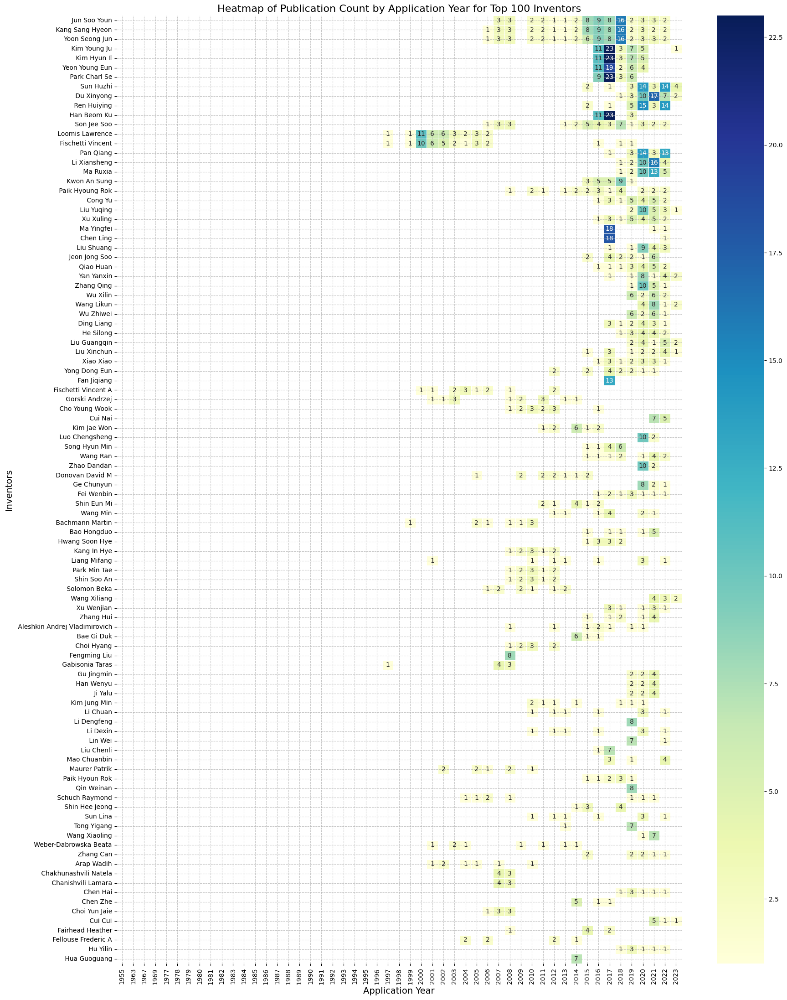

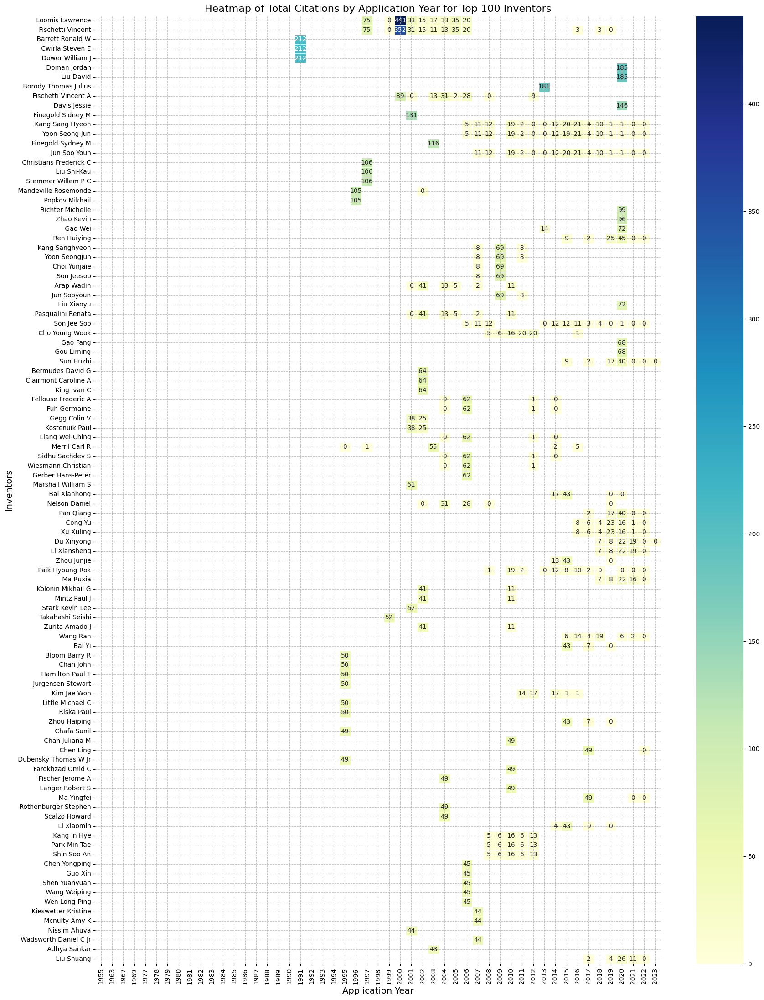

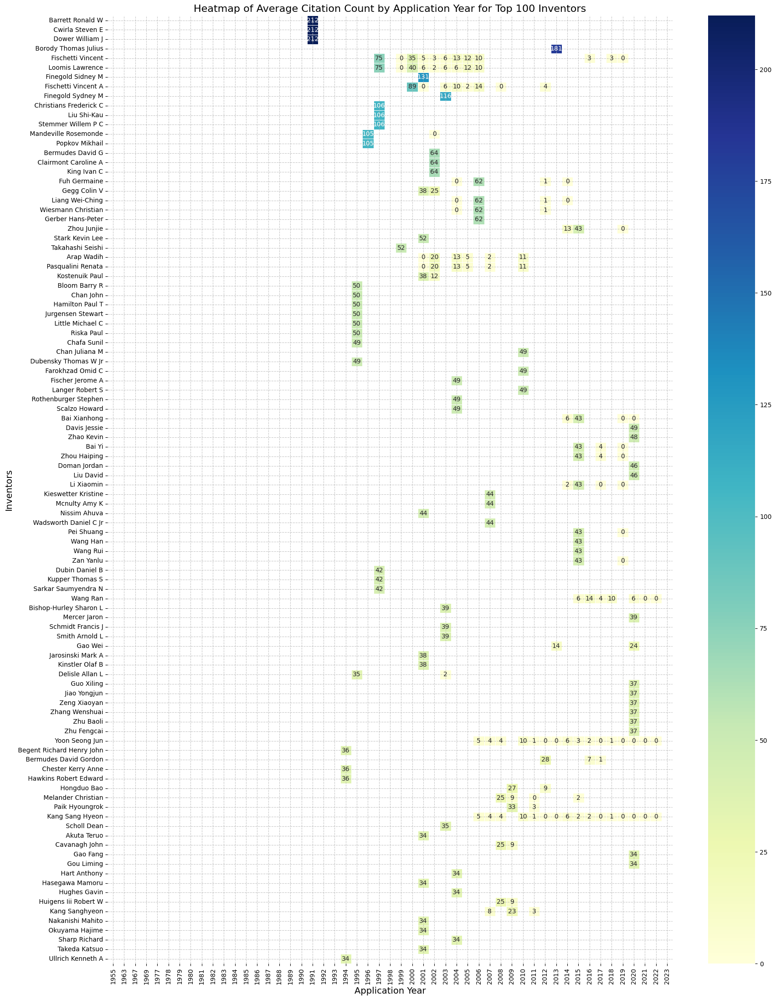

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_Inventors = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_Inventors]

    top_50_data.index = top_50_data.index.to_series().str.title()


    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Inventors'] = data_to_plot.apply(lambda row: textwrap.fill(f" {row['Inventors'].title()}", 50), axis=1)

    data_to_plot = data_to_plot.set_index("Inventors")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of {metric} by Application Year for Top 100 Inventors", fontsize=16)
    plt.xlabel("Application Year", fontsize=14)
    plt.ylabel("Inventors", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
plot_top_50_heatmap(pivot_df, "Publication Count")
plot_top_50_heatmap(pivot_df, "Total Citations")
plot_top_50_heatmap(pivot_df, "Average Citation Count")

### 5 Year Interval

#### Top Inventors by Contribution & Recognition by 5 Year Interval

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap  # Importing textwrap

def plot_top_Inventors_by_interval(pivot_df, start_year, end_year, metrics=("Publication Count", "Total Citations", "Average Citation Count")):
    """
    Plot the top Inventors over a series of 5-year intervals using bar charts for various metrics.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame containing the metrics.
    - start_year (int): The starting year.
    - end_year (int): The ending year.
    - metrics (tuple): The metrics to be plotted.

    Returns:
    None.
    """
    # Determine the min and max application years
    start_year = data['Application Year'].min()
    end_year = data['Application Year'].max()

    intervals = [(year, year + 4) for year in range(start_year, end_year, 5)]
    n_intervals = len(intervals)

    for idx, metric in enumerate(metrics, 1):
        plt.figure(figsize=(25, 30))  # Adjusting figure size

        for j, (start, end) in enumerate(intervals, 1):
            try:
                # Aggregate data for this interval
                aggregated_data = pivot_df[metric].loc[:, start:end].sum(axis=1)
                top_10_Inventors = aggregated_data.nlargest(10).reset_index()
                top_10_Inventors = top_10_Inventors.loc[top_10_Inventors[0] != 0]

                if top_10_Inventors.empty:
                    continue  # Skip the plotting for this interval if there's no data


                # Wrapping title with year and inventor name
                top_10_Inventors['Wrapped_Inventors'] = top_10_Inventors['Inventors'].apply(lambda x: textwrap.fill(f"{x.title()}", 50))


                # Plotting
                ax = plt.subplot(10, 4, j)  # Adjusted the subplot arrangement

                # Determine the color palette. Highlight the top applicant.
                #colors = sns.color_palette("coolwarm", n_colors=len(top_10_Inventors))
                sns.barplot(y=top_10_Inventors["Wrapped_Inventors"], x=top_10_Inventors[0], orient='h', ax=ax, palette='viridis')

                ax.set_title(f"Top 10 Inventors for {start}-{end}", fontsize=16)
                ax.set_ylabel('Inventors', fontsize=14)
                ax.set_xlabel(metric, fontsize=14)
                ax.invert_yaxis()  # To have the applicant with the highest value at the top
                ax.grid(axis='x', linestyle='--', alpha=0.7)
                plt.xticks(fontsize=12)
                plt.yticks(fontsize=10)
                plt.gca().invert_yaxis()

            except KeyError as e:
                print(f"Error: {e}. The metric '{metric}' might not exist in the pivot_df. Please check the DataFrame's columns.")

        plt.tight_layout()  # Improved spacing
        plt.suptitle('Top Inventors by Contribution & Recognition by 5 Year Interval', fontsize=18, y=1.02)
        plt.show()

# Example Usage:


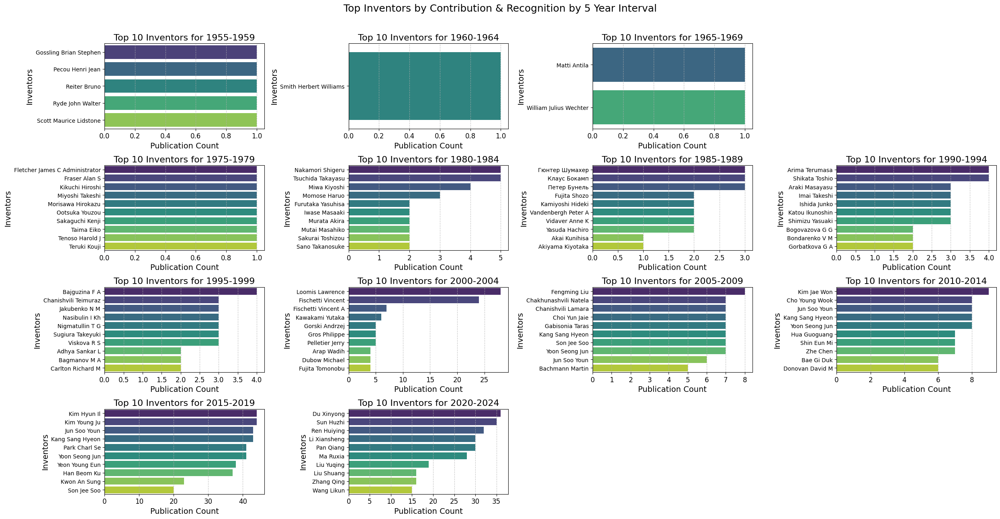

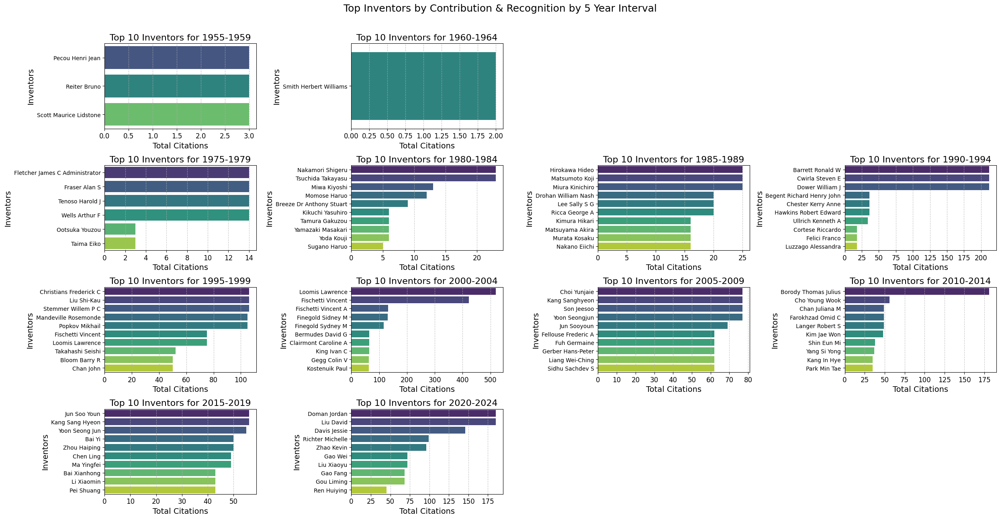

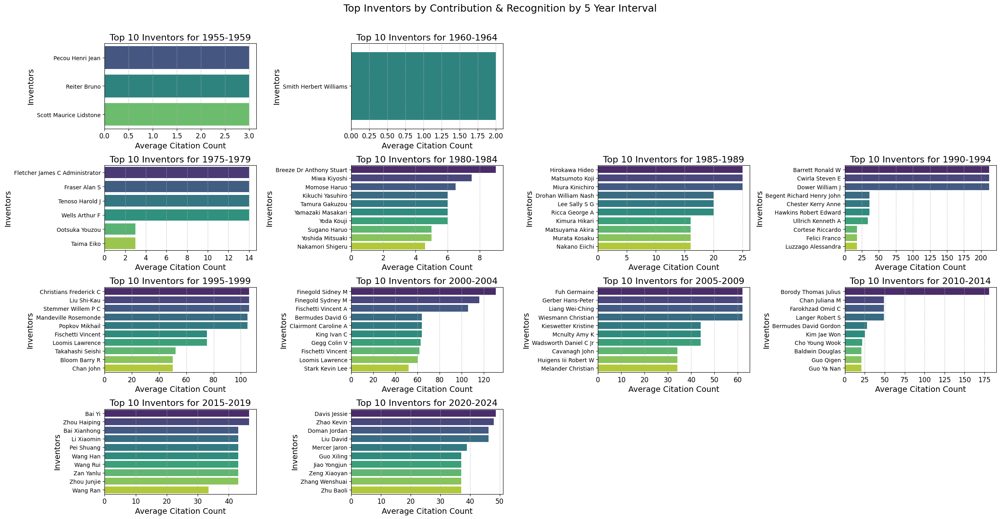

In [ ]:
start_year= data['Application Year'].min()
end_year = data['Application Year'].max()

plot_top_Inventors_by_interval(pivot_df, start_year=start_year, end_year=end_year)


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2365 entries, 0 to 2364
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   #                            2365 non-null   int64         
 1   Jurisdiction                 2365 non-null   object        
 2   Kind                         2365 non-null   object        
 3   Display Key                  2365 non-null   object        
 4   Lens ID                      2365 non-null   object        
 5   Publication Date             2365 non-null   object        
 6   Publication Year             2365 non-null   Int64         
 7   Application Number           2365 non-null   object        
 8   Application Date             2365 non-null   datetime64[ns]
 9   Priority Numbers             2363 non-null   object        
 10  Earliest Priority Date       2363 non-null   datetime64[ns]
 11  Title                        2365 non-null 

### Region

#### pivot_table inventors/regions

In [ ]:
import pandas as pd

def group_and_pivot_Inventors(Inventors_list2: pd.DataFrame) -> pd.DataFrame:
    """
    Group patent data by 'Jurisdiction_Region' and 'Inventors' and then pivot the result.

    Parameters:
    - Inventors_list2 (pd.DataFrame): DataFrame containing patent data.

    Returns:
    - pd.DataFrame: Pivoted DataFrame with metrics as multi-level columns and years as sub-columns.
    """
    # Set the index
    Inventors_data = data.set_index(['Lens ID', 'Jurisdiction_Region', 'Cited by Patent Count'])

    # Split and explode the 'Inventors' field
    Inventors_list = Inventors_data['Inventors'].str.split(';;').explode().str.strip()

    # Count the unique Inventors names
    unique_Inventors_count = Inventors_list.nunique()
    print('The number of unique Inventors is:', unique_Inventors_count)

    # Reset the index to re-organize data
    Inventors_list2 = Inventors_list.to_frame().reset_index()

    # Convert 'Application Year' to integer type if it's not
    Inventors_list2['Jurisdiction_Region'] = Inventors_list2['Jurisdiction_Region'].astype(str)

    # Group by 'Application Year' and 'Inventors', count number of patents
    # and sum citations within each group
    grouped = Inventors_list2.groupby(['Jurisdiction_Region', 'Inventors']).agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate the average citation count
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Jurisdiction_Region', 'Inventors', 'Publication Count', 'Total Citations', 'Average Citation Count']

    # Pivot the DataFrame to have metrics as multi-level columns and years as sub-columns
    my_pivot_df = grouped.pivot_table(index='Inventors', columns='Jurisdiction_Region', values=['Publication Count', 'Total Citations', 'Average Citation Count'], aggfunc='sum')

    return my_pivot_df

# Usage
my_pivot_df = group_and_pivot_Inventors(grouped_data)
my_pivot_df


The number of unique Inventors is: 5824


Average Citation Count                              \
Jurisdiction_Region                   Africa Asia Eastern Europe Eurasia   
Inventors                                                                  
A MINA                                   NaN  4.0            NaN     NaN   
A P NETHRAVATHI                          NaN  NaN            NaN     NaN   
ABAEV IGOR V                             NaN  NaN            NaN     NaN   
ABDULAMIR AHMED SAHIB                    NaN  NaN            NaN     NaN   
ABE TAKAYOSHI                            NaN  1.0            NaN     NaN   
...                                      ...  ...            ...     ...   
박선영                                      NaN  0.0            NaN     NaN   
박예림                                      NaN  0.0            NaN     NaN   
이남경                                      NaN  0.0            NaN     NaN   
정혜주                                      NaN  0.0            NaN     NaN   
한지은                                      NaN  0.0            NaN     NaN   

                                                                  \
Jurisdiction_Region   Europe International North America Oceania   
Inventors                                                          
A MINA                   NaN           NaN           NaN     NaN   
A P NETHRAVATHI          NaN           0.0           NaN     NaN   
ABAEV IGOR V             NaN           NaN      0.333333     NaN   
ABDULAMIR AHMED SAHIB    NaN           NaN           NaN     NaN   
ABE TAKAYOSHI            NaN           NaN           NaN     NaN   
...                      ...           ...           ...     ...   
박선영                      NaN           NaN           NaN     NaN   
박예림                      NaN           NaN           NaN     NaN   
이남경                      NaN           NaN           NaN     NaN   
정혜주                      NaN           NaN           NaN     NaN   
한지은                      NaN           NaN           NaN     NaN   

                                     Publication Count                      \
Jurisdiction_Region   Western Europe            Africa Asia Eastern Europe   
Inventors                                                                    
A MINA                           NaN               NaN  1.0            NaN   
A P NETHRAVATHI                  NaN               NaN  NaN            NaN   
ABAEV IGOR V                     NaN               NaN  NaN            NaN   
ABDULAMIR AHMED SAHIB            0.0               NaN  NaN            NaN   
ABE TAKAYOSHI                    NaN               NaN  1.0            NaN   
...                              ...               ...  ...            ...   
박선영                              NaN               NaN  2.0            NaN   
박예림                              NaN               NaN  1.0            NaN   
이남경                              NaN               NaN  2.0            NaN   
정혜주                              NaN               NaN  1.0            NaN   
한지은                              NaN               NaN  2.0            NaN   

                                                                          \
Jurisdiction_Region   Eurasia Europe International North America Oceania   
Inventors                                                                  
A MINA                    NaN    NaN           NaN           NaN     NaN   
A P NETHRAVATHI           NaN    NaN           1.0           NaN     NaN   
ABAEV IGOR V              NaN    NaN           NaN           3.0     NaN   
ABDULAMIR AHMED SAHIB     NaN    NaN           NaN           NaN     NaN   
ABE TAKAYOSHI             NaN    NaN           NaN           NaN     NaN   
...                       ...    ...           ...           ...     ...   
박선영                       NaN    NaN           NaN           NaN     NaN   
박예림                       NaN    NaN           NaN           NaN     NaN   
이남경                       NaN    NaN           NaN           NaN     NaN   

#### Top 10 Inventors by {metric}'

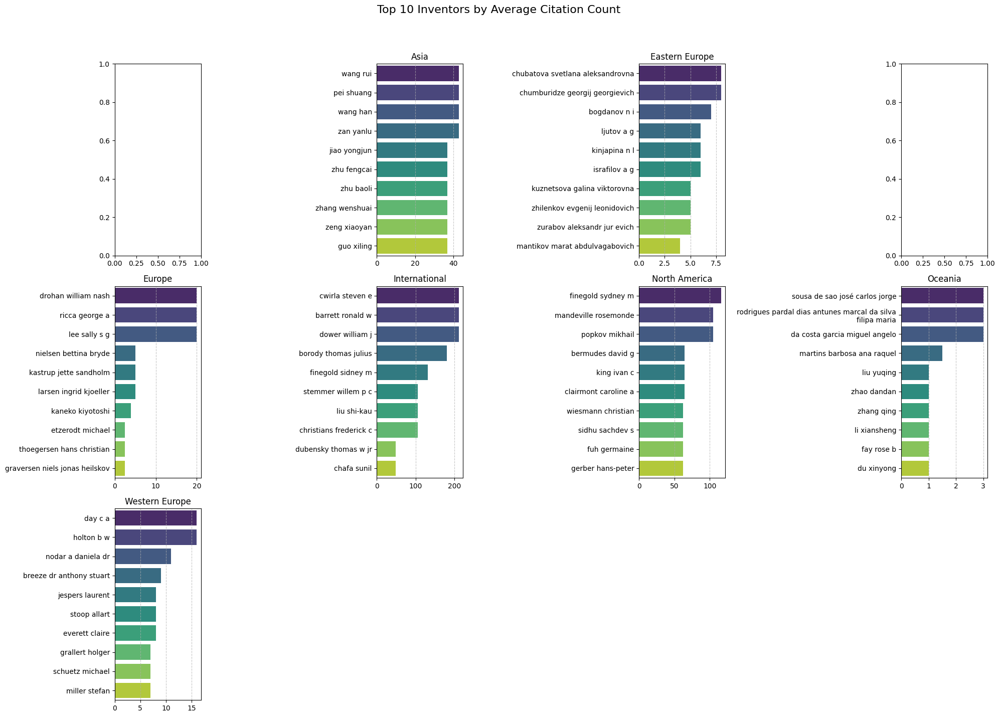

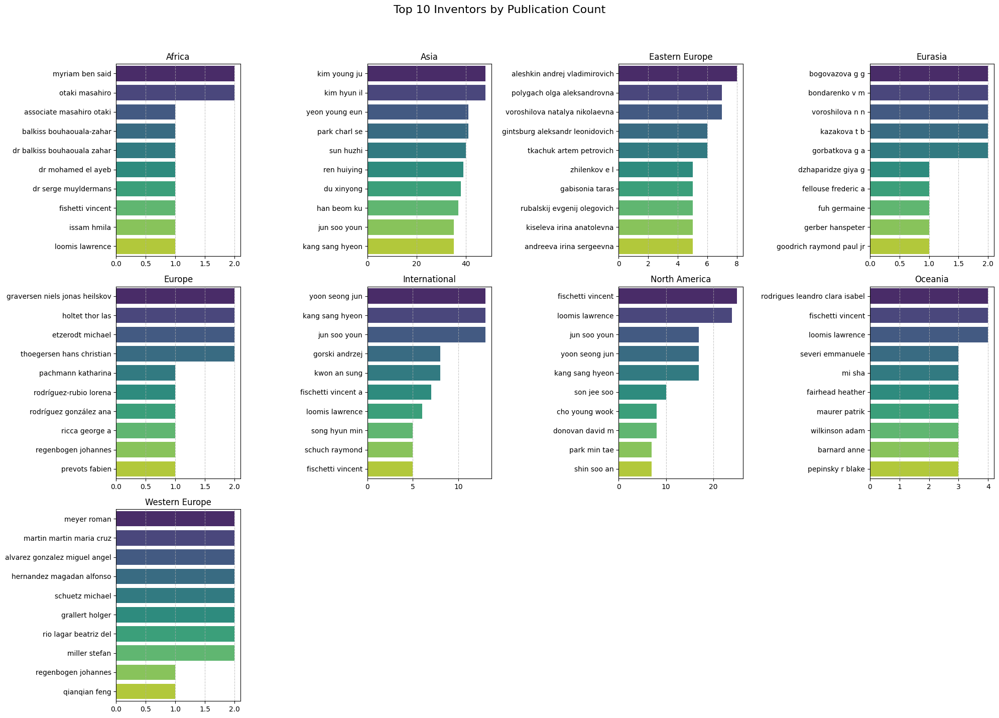

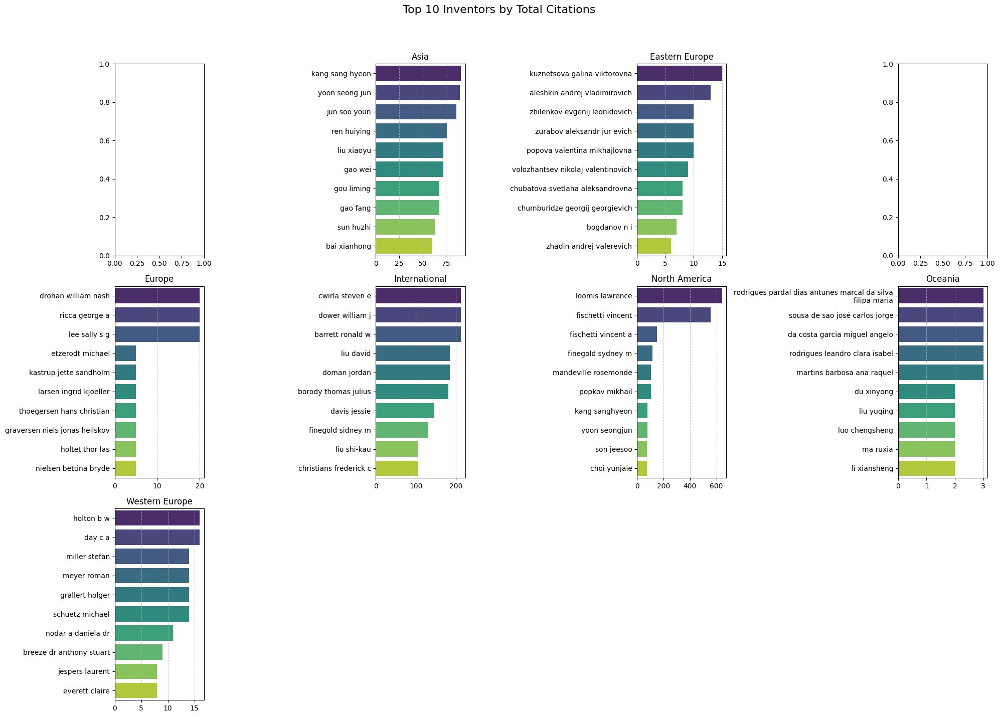

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

# Assuming 'my_pivot_df' is the DataFrame containing the data

# Define the metrics and regions
metrics = ['Average Citation Count', 'Publication Count', 'Total Citations']
regions = ['Africa', 'Asia', 'Eastern Europe', 'Eurasia', 'Europe', 'International', 'North America', 'Oceania', 'Western Europe']

# Calculate the number of rows for the subplots
columns_per_metric = 4
num_regions = len(regions)
rows_per_metric = -(-num_regions // columns_per_metric)  # Ceiling division to get the number of rows

# Process data for each metric
for metric in metrics:
    fig, axes = plt.subplots(nrows=rows_per_metric, ncols=columns_per_metric, figsize=(columns_per_metric * 5, rows_per_metric * 5))
    fig.suptitle(f'Top 10 Inventors by {metric}', fontsize=16)

    # Flatten axes array for easy iteration if it's 2D (i.e., if there's more than one row)
    if rows_per_metric > 1:
        axes = axes.flatten()

    for i, region in enumerate(regions):
      try:
        # Access the data for each metric and region using the MultiIndex
        region_data = my_pivot_df[(metric, region)].dropna().sort_values(ascending=False).head(10).replace(0,np.nan).dropna()
        region_data = region_data.reset_index()

        if region_data.empty:
          continue  # Skip the plotting for this interval if there's no data

        # Convert inventor names to lowercase and wrap them
        region_data['Wrapped_Inventors'] = region_data['Inventors'].str.lower().apply(lambda x: textwrap.fill(x, width=50))

        # Select the appropriate subplot
        ax = axes[i]

        # Plotting
        sns.barplot(x=region_data[(metric, region)], y=region_data['Wrapped_Inventors'], ax=ax, palette='viridis')
        ax.set_title(region, fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.invert_yaxis()  # To have the top value at the top
        ax.grid(axis='x', linestyle='--', alpha=0.7)
        ax.invert_yaxis()  # Inverts the y-axis for the current subplot


        # Adjust the tick parameters
        ax.tick_params(axis='x', labelsize=10)
        ax.tick_params(axis='y', labelsize=10)

      except KeyError as e:
          print(f"Error: {e}. The metric '{metric}' might not exist in the pivot_df. Please check the DataFrame's columns.")


    # If there are any leftover axes in the last row, hide them
    for j in range(i+1, rows_per_metric * columns_per_metric):
        if rows_per_metric > 1:
            fig.delaxes(axes[j])
        else:
            # If only one row, the axes are not a flat array
            fig.delaxes(axes.flatten()[j])

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


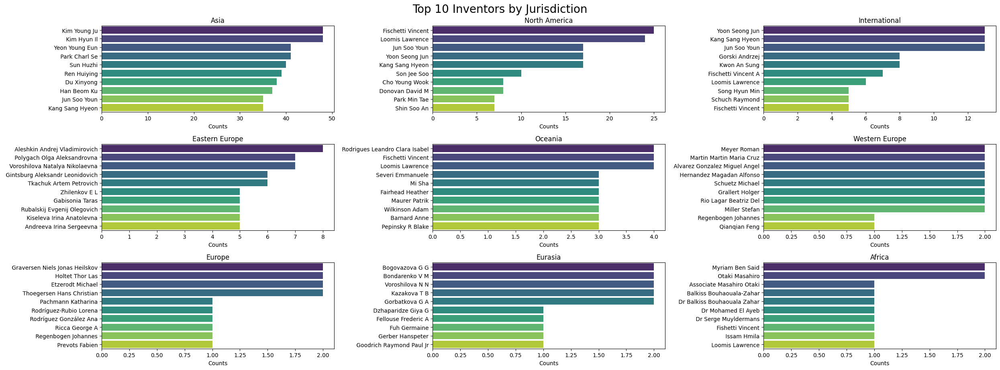

In [ ]:
plot_top_10_IPCR_by_country(data, 'Inventors', 'Jurisdiction_Region')

#### pivot_table applicant/ region

In [ ]:
import pandas as pd

def group_and_pivot_Applicants(Applicants_list2: pd.DataFrame) -> pd.DataFrame:
    """
    Group patent data by 'Jurisdiction_Region' and 'Applicants' and then pivot the result.

    Parameters:
    - Applicants_list2 (pd.DataFrame): DataFrame containing patent data.

    Returns:
    - pd.DataFrame: Pivoted DataFrame with metrics as multi-level columns and years as sub-columns.
    """
    # Set the index
    Applicants_data = data.set_index(['Lens ID', 'Jurisdiction_Region', 'Cited by Patent Count'])

    # Split and explode the 'Applicants' field
    Applicants_list = Applicants_data['Applicants'].str.split(';;').explode().str.strip()

    # Count the unique Applicants names
    unique_Applicants_count = Applicants_list.nunique()
    print('The number of unique Applicants is:', unique_Applicants_count)

    # Reset the index to re-organize data
    Applicants_list2 = Applicants_list.to_frame().reset_index()

    # Convert 'Application Year' to integer type if it's not
    Applicants_list2['Jurisdiction_Region'] = Applicants_list2['Jurisdiction_Region'].astype(str)

    # Group by 'Application Year' and 'Applicants', count number of patents
    # and sum citations within each group
    grouped = Applicants_list2.groupby(['Jurisdiction_Region', 'Applicants']).agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate the average citation count
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Jurisdiction_Region', 'Applicants', 'Publication Count', 'Total Citations', 'Average Citation Count']

    # Pivot the DataFrame to have metrics as multi-level columns and years as sub-columns
    my_pivot_df = grouped.pivot_table(index='Applicants', columns='Jurisdiction_Region', values=['Publication Count', 'Total Citations', 'Average Citation Count'], aggfunc='sum')

    return my_pivot_df

# Usage
my_pivot_df = group_and_pivot_Applicants(grouped_data)
my_pivot_df


The number of unique Applicants is: 1971


Average Citation Count  \
Jurisdiction_Region                                                Africa   
Applicants                                                                  
4D PHARMA LEON S L U                                                  NaN   
ABAEV IGOR V                                                          NaN   
ABBOTT LAB                                                            NaN   
ABCELEX TECH INC                                                      NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                               NaN   
...                                                                   ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                                NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...                    NaN   
경북대학교 산학협력단                                                           NaN   
주식회사 비엠씨                                                              NaN   
한국생명공학연구원                                                             NaN   

                                                                        \
Jurisdiction_Region                                Asia Eastern Europe   
Applicants                                                               
4D PHARMA LEON S L U                                0.0            NaN   
ABAEV IGOR V                                        NaN            NaN   
ABBOTT LAB                                          NaN            NaN   
ABCELEX TECH INC                                    NaN            NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD             0.0            NaN   
...                                                 ...            ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                              NaN            0.0   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...  NaN            0.0   
경북대학교 산학협력단                                         0.0            NaN   
주식회사 비엠씨                                            0.0            NaN   
한국생명공학연구원                                           0.0            NaN   

                                                                   \
Jurisdiction_Region                                Eurasia Europe   
Applicants                                                          
4D PHARMA LEON S L U                                   NaN    NaN   
ABAEV IGOR V                                           NaN    NaN   
ABBOTT LAB                                             NaN    NaN   
ABCELEX TECH INC                                       NaN    NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                NaN    NaN   
...                                                    ...    ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                 NaN    NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...     NaN    NaN   
경북대학교 산학협력단                                            NaN    NaN   
주식회사 비엠씨                                               NaN    NaN   
한국생명공학연구원                                              NaN    NaN   

                                                                  \
Jurisdiction_Region                                International   
Applicants                                                         
4D PHARMA LEON S L U                                         NaN   
ABAEV IGOR V                                                 NaN   
ABBOTT LAB                                                   NaN   
ABCELEX TECH INC                                             NaN   
ABIOCENTER JIANGSU BIOTECHNOLOGY CO LTD                      NaN   
...                                                          ...   
БЕРІНГЕР МАННХАЙМ ГМБХ                                       NaN   
“UKRAINIAN MEDICAL STOMATOLOGICAL ACADEMY” HIGH...           NaN   
경북대학교 산학협력단                                                  NaN   
주식회사 비엠씨                                                     NaN   
한국생명공학연구원                                                    NaN   

               

#### Top 10 Applicants by {metric}

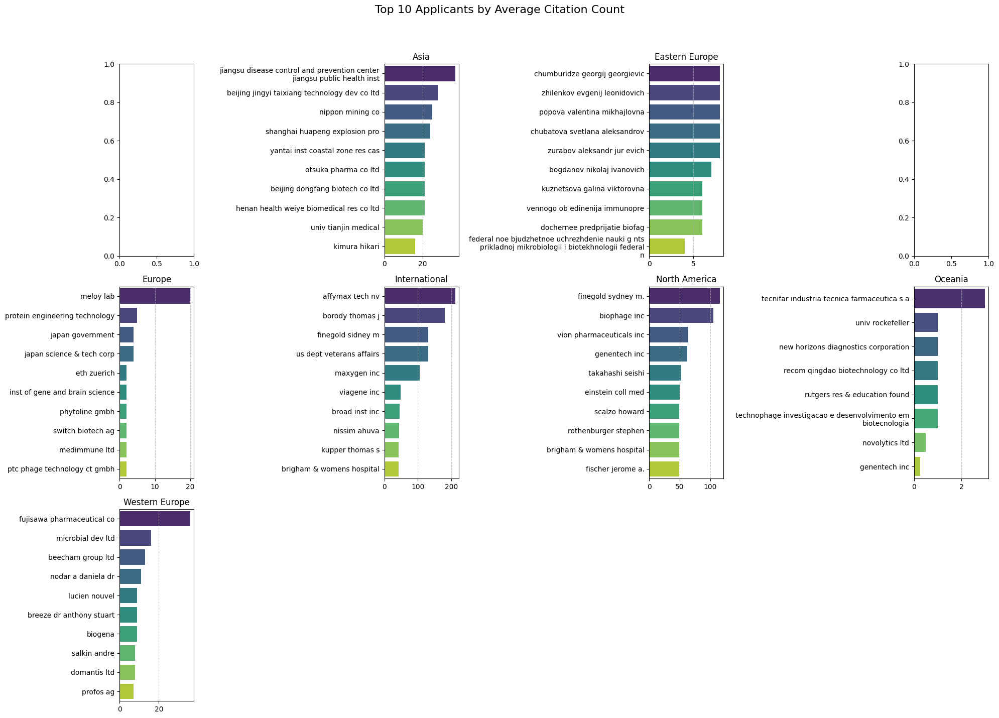

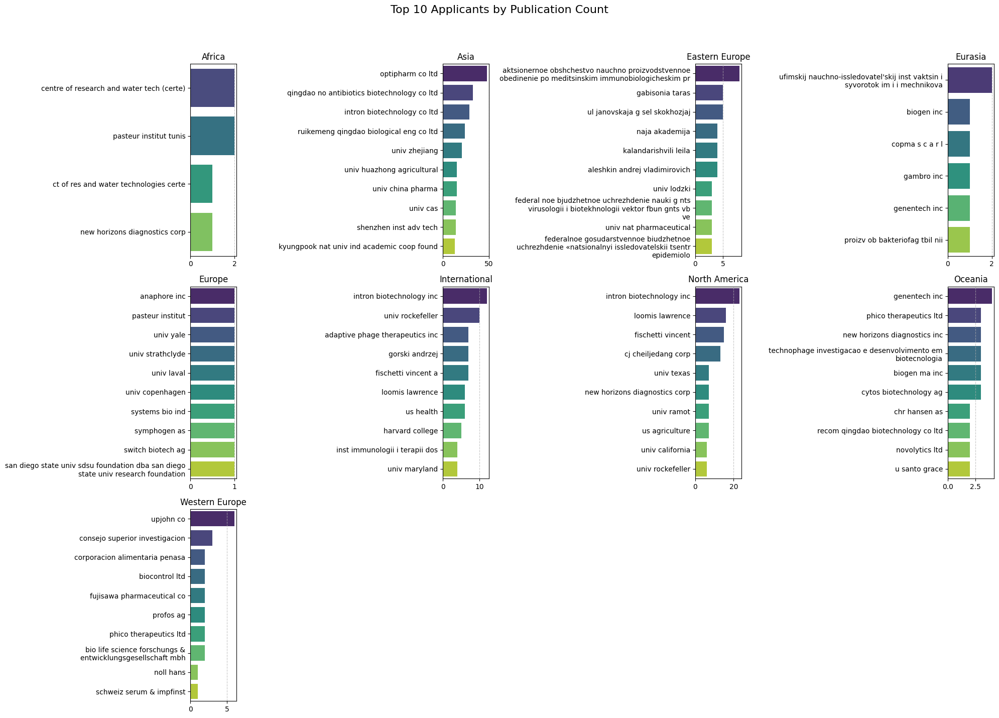

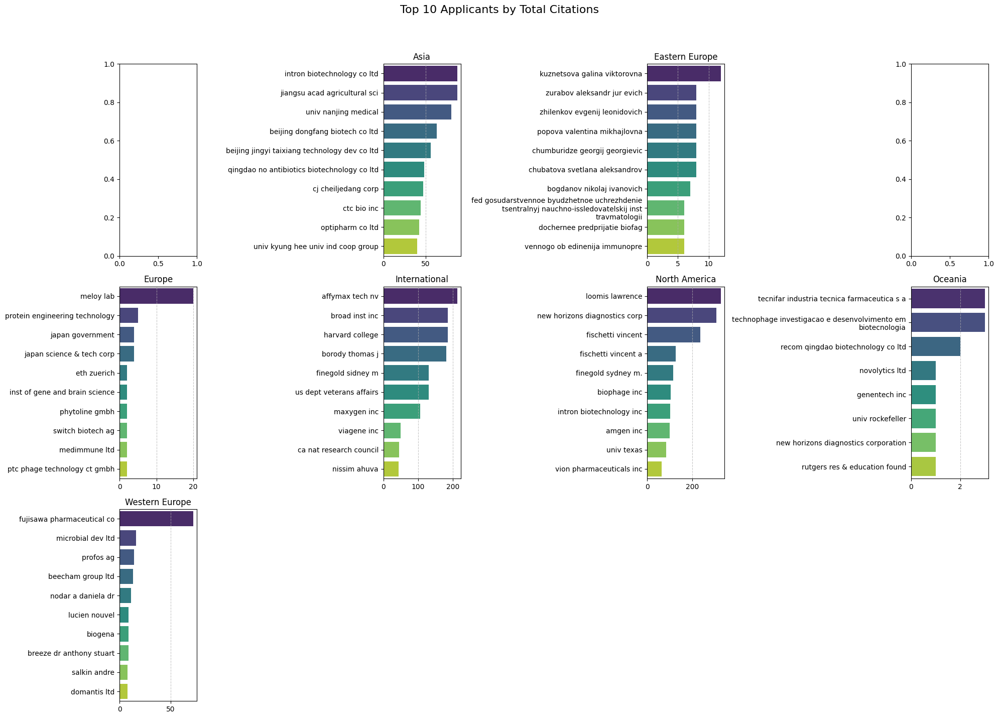

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

# Assuming 'my_pivot_df' is the DataFrame containing the data

# Define the metrics and regions
metrics = ['Average Citation Count', 'Publication Count', 'Total Citations']
regions = ['Africa', 'Asia', 'Eastern Europe', 'Eurasia', 'Europe', 'International', 'North America', 'Oceania', 'Western Europe']

# Calculate the number of rows for the subplots
columns_per_metric = 4
num_regions = len(regions)
rows_per_metric = -(-num_regions // columns_per_metric)  # Ceiling division to get the number of rows

# Process data for each metric
for metric in metrics:
    fig, axes = plt.subplots(nrows=rows_per_metric, ncols=columns_per_metric, figsize=(columns_per_metric * 5, rows_per_metric * 5))
    fig.suptitle(f'Top 10 Applicants by {metric}', fontsize=16)

    # Flatten axes array for easy iteration if it's 2D (i.e., if there's more than one row)
    if rows_per_metric > 1:
        axes = axes.flatten()

    for i, region in enumerate(regions):
      try :

        # Access the data for each metric and region using the MultiIndex
        region_data = my_pivot_df[(metric, region)].dropna().sort_values(ascending=False).head(10).replace(0,np.nan).dropna()
        region_data = region_data.reset_index()


        if region_data.empty:
          continue  # Skip the plotting for this

        # Convert inventor names to lowercase and wrap them
        region_data['Wrapped_Applicants'] = region_data['Applicants'].str.lower().apply(lambda x: textwrap.fill(x, width=50))

        # Select the appropriate subplot
        ax = axes[i]

        # Plotting
        sns.barplot(x=region_data[(metric, region)], y=region_data['Wrapped_Applicants'], ax=ax, palette='viridis')
        ax.set_title(region, fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.invert_yaxis()  # To have the top value at the top
        ax.grid(axis='x', linestyle='--', alpha=0.7)
        ax.invert_yaxis()  # Inverts the y-axis for the current subplot


        # Adjust the tick parameters
        ax.tick_params(axis='x', labelsize=10)
        ax.tick_params(axis='y', labelsize=10)

      except KeyError as e:
          print(f"Error: {e}. The metric '{metric}' might not exist in the pivot_df. Please check the DataFrame's columns.")


    # If there are any leftover axes in the last row, hide them
    for j in range(i+1, rows_per_metric * columns_per_metric):
        if rows_per_metric > 1:
            fig.delaxes(axes[j])
        else:
            # If only one row, the axes are not a flat array
            fig.delaxes(axes.flatten()[j])

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


#### Comparison of Patent Applications, Inventor Counts, and Application/Inventor Ratio by Region

In [ ]:
# Set the index
applicants_data = data.set_index(['Jurisdiction_Region'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Inventors'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Jurisdiction_Region,Inventors
0,Eastern Europe,KURUNOV JU N
1,Eastern Europe,KURUNOVA N N
2,Eastern Europe,SHATALOVA N D
3,Asia,MIGUEL ANGELO DA COSTA GARCIA
4,Asia,CARLOS JORGE SOUSA DE SAO JOSE
...,...,...
9617,Asia,ARMEN ZACHARY
9618,Asia,CEZAR CHRISTINE
9619,Asia,MARTIN BARRY
9620,Asia,AVENDANO AMADO MAIER


In [ ]:
applicants_count_year = applicants_list['Jurisdiction_Region'].value_counts().rename('Inventor counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

Asia              3450
International      929
North America      886
Eastern Europe     593
Oceania            153
Western Europe     128
Europe              92
Eurasia             21
Africa              15
Name: Inventor counts, dtype: int64

##### table

In [ ]:
count_year_1 = data['Jurisdiction_Region'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Region'}).sort_values('Application', ascending=False)
#data_trend_applicants_count['Ratio '] =
data_trend_applicants_count.head(60)

,Region,Application,Inventor counts
0,Asia,1321,3450
1,North America,382,886
2,International,333,929
3,Eastern Europe,174,593
4,Western Europe,65,128
5,Oceania,52,153
6,Europe,25,92
7,Eurasia,7,21
8,Africa,6,15


In [ ]:
data_trend_applicants_count['Application'].sum()

2365

##### graph

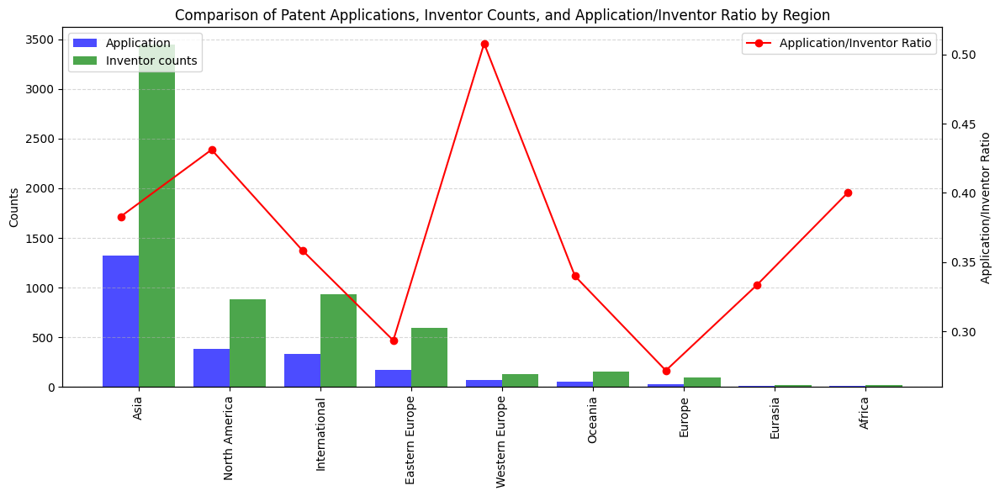

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
df = data_trend_applicants_count

# Calculate the ratio of Applications per Applicant
df['Ratio'] = df['Application'] / df['Inventor counts']

# Setting the positions and width for the bars
pos = list(range(len(df['Application'])))
width = 0.4

# Plotting the bars
fig, ax1 = plt.subplots(figsize=(12, 6))

# Creating bars for 'Application'
ax1.bar(pos, df['Application'], width, alpha=0.7, color='blue', label='Application')

# Creating bars for 'Applicants counts' with an offset (pos + width)
ax1.bar([p + width for p in pos], df['Inventor counts'], width, alpha=0.7, color='green', label='Inventor counts')

# Setting axis labels, title, and ticks for the first y-axis
ax1.set_ylabel('Counts')
ax1.set_title('Comparison of Patent Applications, Inventor Counts, and Application/Inventor Ratio by Region')

# Set the x-ticks and rotate labels for better readability
ax1.set_xticks([p + width / 2 for p in pos])
ax1.set_xticklabels(df['Region'], rotation=90)

# Creating a secondary y-axis for the ratio
ax2 = ax1.twinx()
ax2.plot(df['Region'], df['Ratio'], color='red', marker='o', label='Application/Inventor Ratio')
ax2.set_ylabel('Application/Inventor Ratio')

# Adding legends
ax1.legend(['Application', 'Inventor counts'], loc='upper left')
ax2.legend(['Application/Inventor Ratio'], loc='upper right')

# Adding grid
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


#### Heatmap of Juridiction Region of Application of the Top 100 Inventors

In [ ]:
data['Jurisdiction_Region']

0       Eastern Europe
1                 Asia
2              Oceania
3        North America
4              Oceania
             ...      
2360    Western Europe
2361    Western Europe
2362              Asia
2363              Asia
2364           Eurasia
Name: Jurisdiction_Region, Length: 2365, dtype: object

In [ ]:
# Set the index
applicants_data = data.set_index(['Lens ID', 'Jurisdiction_Region'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Inventors'].str.split(';;').explode().str.strip().to_frame()
    # Reset the index to re-organize data
applicants_list2 = applicants_list.reset_index()

grouped = applicants_list2.groupby(['Jurisdiction_Region', 'Inventors']).agg({
    'Lens ID': 'count'
}).reset_index()

pivot_df = grouped.pivot_table(index='Inventors', columns='Jurisdiction_Region', values=['Lens ID'], aggfunc='sum')#['Lens ID']

pivot_df


Lens ID                                     \
Jurisdiction_Region    Africa Asia Eastern Europe Eurasia Europe   
Inventors                                                          
A MINA                    NaN  1.0            NaN     NaN    NaN   
A P NETHRAVATHI           NaN  NaN            NaN     NaN    NaN   
ABAEV IGOR V              NaN  NaN            NaN     NaN    NaN   
ABDULAMIR AHMED SAHIB     NaN  NaN            NaN     NaN    NaN   
ABE TAKAYOSHI             NaN  1.0            NaN     NaN    NaN   
...                       ...  ...            ...     ...    ...   
박선영                       NaN  2.0            NaN     NaN    NaN   
박예림                       NaN  1.0            NaN     NaN    NaN   
이남경                       NaN  2.0            NaN     NaN    NaN   
정혜주                       NaN  1.0            NaN     NaN    NaN   
한지은                       NaN  2.0            NaN     NaN    NaN   

                                                                          
Jurisdiction_Region   International North America Oceania Western Europe  
Inventors                                                                 
A MINA                          NaN           NaN     NaN            NaN  
A P NETHRAVATHI                 1.0           NaN     NaN            NaN  
ABAEV IGOR V                    NaN           3.0     NaN            NaN  
ABDULAMIR AHMED SAHIB           NaN           NaN     NaN            1.0  
ABE TAKAYOSHI                   NaN           NaN     NaN            NaN  
...                             ...           ...     ...            ...  
박선영                             NaN           NaN     NaN            NaN  
박예림                             NaN           NaN     NaN            NaN  
이남경                             NaN           NaN     NaN            NaN  
정혜주                             NaN           NaN     NaN            NaN  
한지은                             NaN           NaN     NaN            NaN  

[5824 rows x 9 columns]

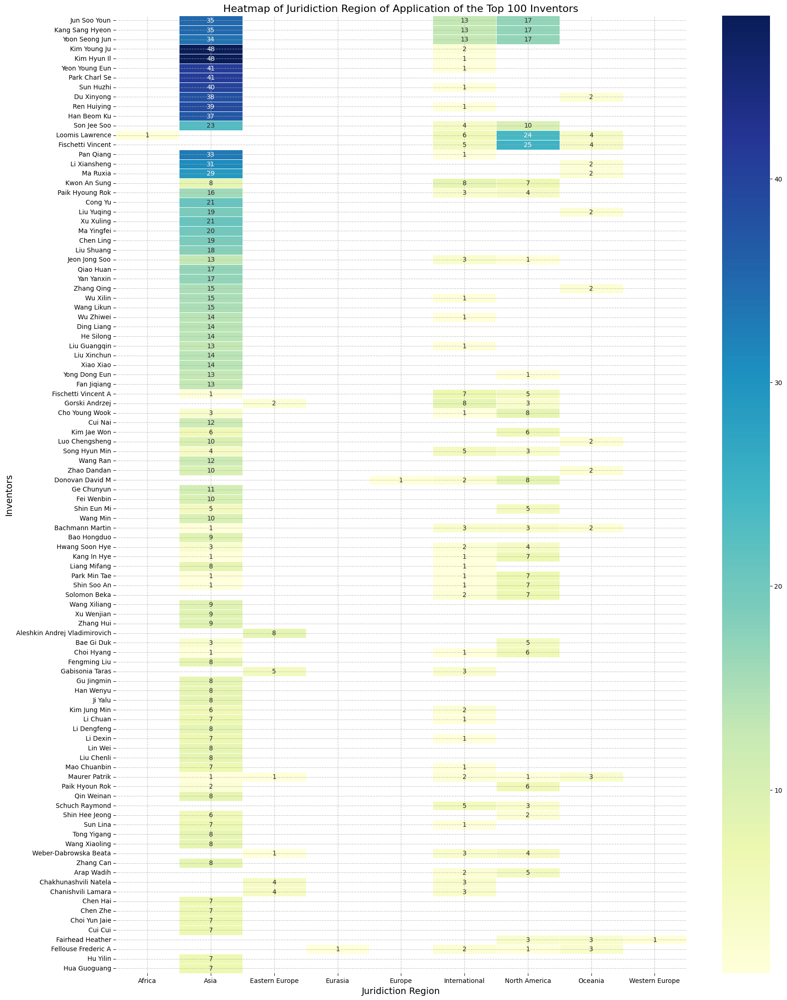

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Inventors'] = data_to_plot.apply(lambda row: f"{row['Inventors'].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index("Inventors")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of Juridiction Region of Application of the Top 100 Inventors", fontsize=16)
    plt.xlabel("Juridiction Region", fontsize=14)
    plt.ylabel("Inventors", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
plot_top_50_heatmap(pivot_df, "Lens ID")
#plot_top_50_heatmap(pivot_df, "Total Citations")
# plot_top_50_heatmap(pivot_df, "Average Citation Count")


### country

#### top_10_inventors_by_country

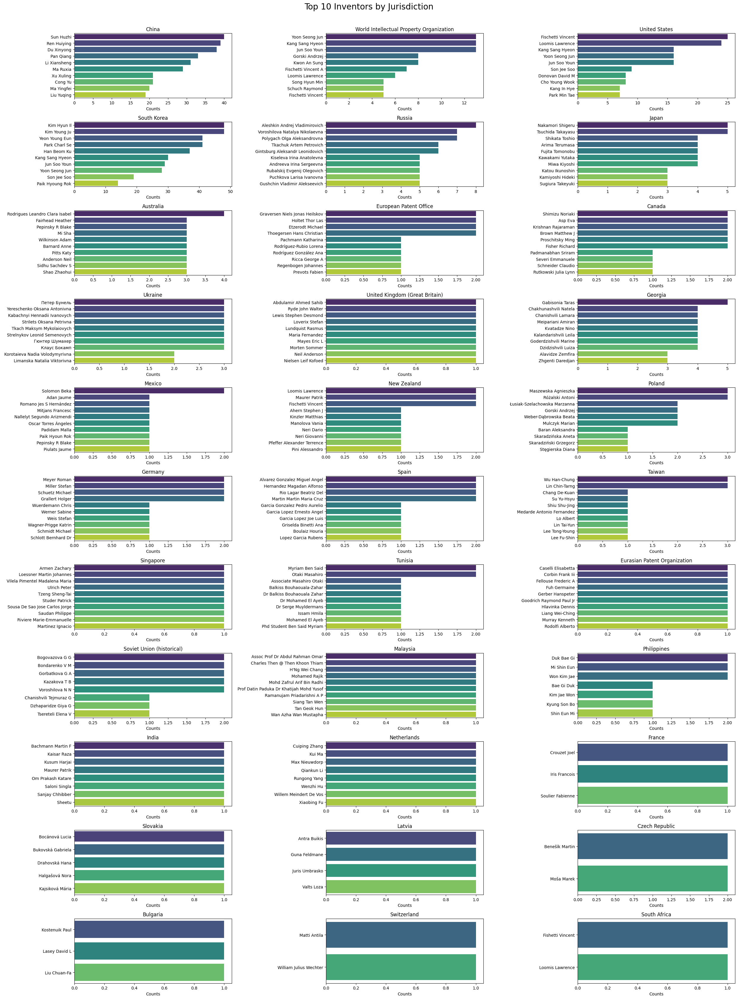

In [ ]:
plot_top_10_IPCR_by_country(data, 'Inventors', 'Jurisdiction_name')

#### Comparison of Patent Applications, Inventor Counts, and Application/Inventor Ratio by Country

In [ ]:
# Set the index
applicants_data = data.set_index(['Jurisdiction_name'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Inventors'].str.split(';;').explode().str.strip().to_frame().reset_index().drop_duplicates()
applicants_list

,Jurisdiction_name,Inventors
0,Russia,KURUNOV JU N
1,Russia,KURUNOVA N N
2,Russia,SHATALOVA N D
3,Japan,MIGUEL ANGELO DA COSTA GARCIA
4,Japan,CARLOS JORGE SOUSA DE SAO JOSE
...,...,...
9617,Singapore,ARMEN ZACHARY
9618,Singapore,CEZAR CHRISTINE
9619,Singapore,MARTIN BARRY
9620,Singapore,AVENDANO AMADO MAIER


In [ ]:
applicants_count_year = applicants_list['Jurisdiction_name'].value_counts().rename('Inventor counts')#.reset_index().sort_values('index', ascending=False)
applicants_count_year

China                                       2587
World Intellectual Property Organization     929
United States                                787
Japan                                        481
Russia                                       457
South Korea                                  338
Australia                                    110
European Patent Office                        92
Canada                                        79
United Kingdom (Great Britain)                67
Mexico                                        60
Ukraine                                       58
New Zealand                                   48
Georgia                                       34
Poland                                        31
Germany                                       29
Singapore                                     23
Spain                                         21
Taiwan                                        20
Tunisia                                       13
Eurasian Patent Orga

##### table

In [ ]:
count_year_1 = data['Jurisdiction_name'].value_counts().rename('Application')

data_trend_applicants_count = pd.concat([count_year_1, applicants_count_year], axis=1).fillna(0).astype(int).reset_index().rename(columns={'index': 'Country'}).sort_values('Application', ascending=False)
#data_trend_applicants_count['Ratio '] =
data_trend_applicants_count.head(60)

,Country,Application,Inventor counts
0,China,904,2587
1,United States,336,787
2,World Intellectual Property Organization,333,929
3,South Korea,209,338
4,Japan,186,481
5,Russia,126,457
6,Australia,40,110
7,United Kingdom (Great Britain),39,67
8,Canada,31,79
9,European Patent Office,25,92


In [ ]:
data_trend_applicants_count['Application'].sum()

2365

##### graph

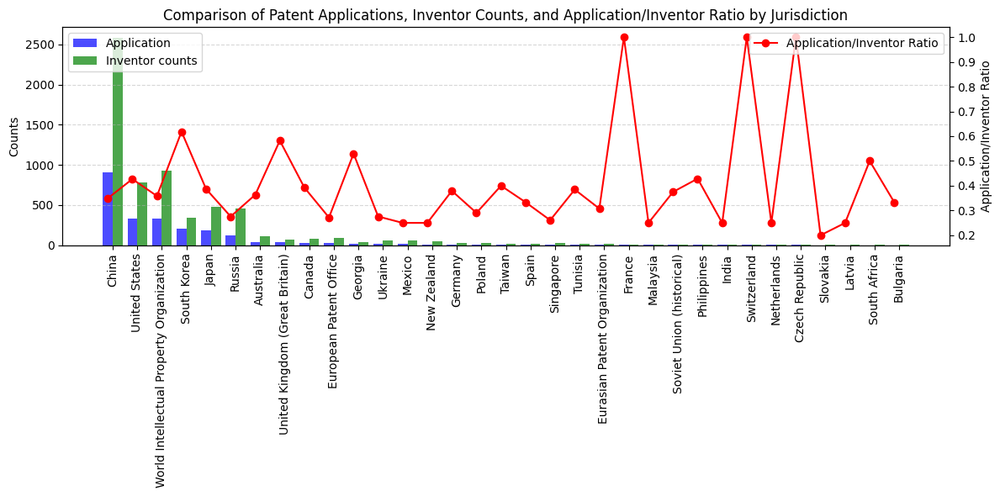

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
df = data_trend_applicants_count

# Calculate the ratio of Applications per Applicant
df['Ratio'] = df['Application'] / df['Inventor counts']

# Setting the positions and width for the bars
pos = list(range(len(df['Application'])))
width = 0.4

# Plotting the bars
fig, ax1 = plt.subplots(figsize=(12, 6))

# Creating bars for 'Application'
ax1.bar(pos, df['Application'], width, alpha=0.7, color='blue', label='Application')

# Creating bars for 'Applicants counts' with an offset (pos + width)
ax1.bar([p + width for p in pos], df['Inventor counts'], width, alpha=0.7, color='green', label='Inventor counts')

# Setting axis labels, title, and ticks for the first y-axis
ax1.set_ylabel('Counts')
ax1.set_title('Comparison of Patent Applications, Inventor Counts, and Application/Inventor Ratio by Jurisdiction')

# Set the x-ticks and rotate labels for better readability
ax1.set_xticks([p + width / 2 for p in pos])
ax1.set_xticklabels(df['Country'], rotation=90)

# Creating a secondary y-axis for the ratio
ax2 = ax1.twinx()
ax2.plot(df['Country'], df['Ratio'], color='red', marker='o', label='Application/Inventor Ratio')
ax2.set_ylabel('Application/Inventor Ratio')

# Adding legends
ax1.legend(['Application', 'Inventor counts'], loc='upper left')
ax2.legend(['Application/Inventor Ratio'], loc='upper right')

# Adding grid
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


#### Heatmap of Juridiction Country of Application of the Top 100 Inventors

##### pivot_table inventors/country

In [ ]:
# Set the index
applicants_data = data.set_index(['Lens ID', 'Jurisdiction_name'])

# Split and explode the 'Applicants' field
applicants_list = applicants_data['Inventors'].str.split(';;').explode().str.strip().to_frame()
    # Reset the index to re-organize data
applicants_list2 = applicants_list.reset_index()

grouped = applicants_list2.groupby(['Jurisdiction_name', 'Inventors']).agg({
    'Lens ID': 'count'
}).reset_index()

pivot_df = grouped.pivot_table(index='Inventors', columns='Jurisdiction_name', values=['Lens ID'], aggfunc='sum')#['Lens ID']

pivot_df


Lens ID                                       \
Jurisdiction_name     Australia Bulgaria Canada China Czech Republic   
Inventors                                                              
A MINA                      NaN      NaN    NaN   1.0            NaN   
A P NETHRAVATHI             NaN      NaN    NaN   NaN            NaN   
ABAEV IGOR V                NaN      NaN    NaN   NaN            NaN   
ABDULAMIR AHMED SAHIB       NaN      NaN    NaN   NaN            NaN   
ABE TAKAYOSHI               NaN      NaN    NaN   NaN            NaN   
...                         ...      ...    ...   ...            ...   
박선영                         NaN      NaN    NaN   NaN            NaN   
박예림                         NaN      NaN    NaN   NaN            NaN   
이남경                         NaN      NaN    NaN   NaN            NaN   
정혜주                         NaN      NaN    NaN   NaN            NaN   
한지은                         NaN      NaN    NaN   NaN            NaN   

                                                                           \
Jurisdiction_name     Eurasian Patent Organization European Patent Office   
Inventors                                                                   
A MINA                                         NaN                    NaN   
A P NETHRAVATHI                                NaN                    NaN   
ABAEV IGOR V                                   NaN                    NaN   
ABDULAMIR AHMED SAHIB                          NaN                    NaN   
ABE TAKAYOSHI                                  NaN                    NaN   
...                                            ...                    ...   
박선영                                            NaN                    NaN   
박예림                                            NaN                    NaN   
이남경                                            NaN                    NaN   
정혜주                                            NaN                    NaN   
한지은                                            NaN                    NaN   

                                                                          \
Jurisdiction_name     France Georgia Germany India Japan Latvia Malaysia   
Inventors                                                                  
A MINA                   NaN     NaN     NaN   NaN   NaN    NaN      NaN   
A P NETHRAVATHI          NaN     NaN     NaN   NaN   NaN    NaN      NaN   
ABAEV IGOR V             NaN     NaN     NaN   NaN   NaN    NaN      NaN   
ABDULAMIR AHMED SAHIB    NaN     NaN     NaN   NaN   NaN    NaN      NaN   
ABE TAKAYOSHI            NaN     NaN     NaN   NaN   1.0    NaN      NaN   
...                      ...     ...     ...   ...   ...    ...      ...   
박선영                      NaN     NaN     NaN   NaN   NaN    NaN      NaN   
박예림                      NaN     NaN     NaN   NaN   NaN    NaN      NaN   
이남경                      NaN     NaN     NaN   NaN   NaN    NaN      NaN   
정혜주                      NaN     NaN     NaN   NaN   NaN    NaN      NaN   
한지은                      NaN     NaN     NaN   NaN   NaN    NaN      NaN   

                                                                         \
Jurisdiction_name     Mexico Netherlands New Zealand Philippines Poland   
Inventors                                                                 
A MINA                   NaN         NaN         NaN         NaN    NaN   
A P NETHRAVATHI          NaN         NaN         NaN         NaN    NaN   
ABAEV IGOR V             NaN         NaN         NaN         NaN    NaN   
ABDULAMIR AHMED SAHIB    NaN         NaN         NaN         NaN    NaN   
ABE TAKAYOSHI            NaN         NaN         NaN         NaN    NaN   
...                      ...         ...         ...         ...    ...   
박선영                      NaN         NaN         NaN         NaN    NaN   
박예림                      NaN         NaN         NaN         NaN    NaN   
이남경                      NaN         NaN      

##### graph

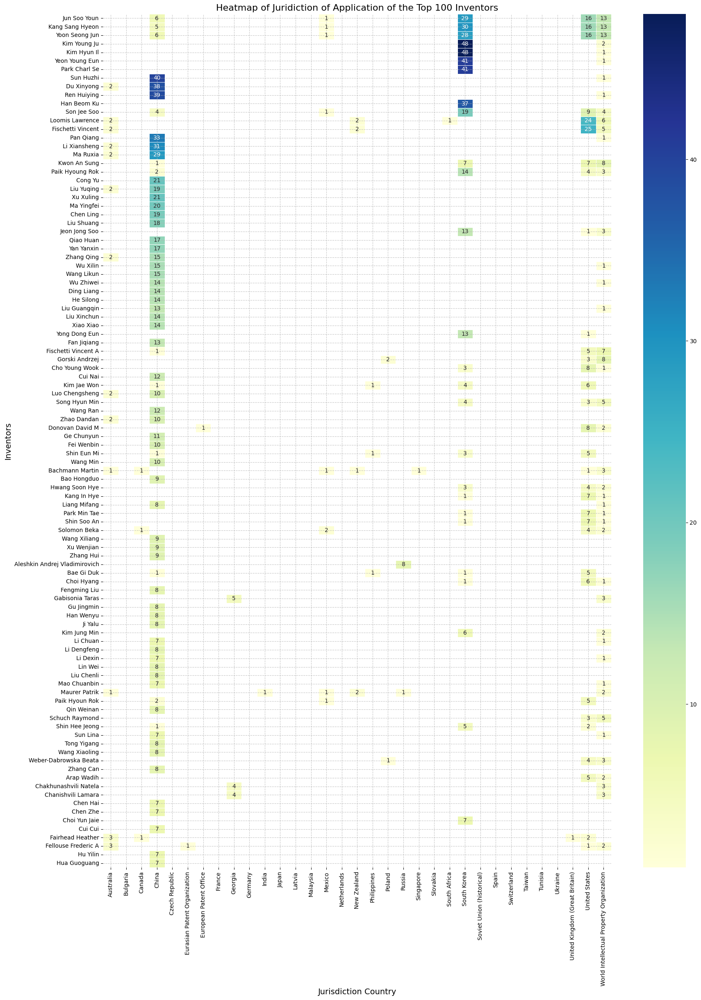

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, metric):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(100).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=(20, 27))

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot['Inventors'] = data_to_plot.apply(lambda row: f"{row['Inventors'].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index("Inventors")

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.title(f"Heatmap of Juridiction of Application of the Top 100 Inventors", fontsize=16)
    plt.xlabel("Jurisdiction Country", fontsize=14)
    plt.ylabel("Inventors", fontsize=14)
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
plot_top_50_heatmap(pivot_df, "Lens ID")
#plot_top_50_heatmap(pivot_df, "Total Citations")
# plot_top_50_heatmap(pivot_df, "Average Citation Count")


## 5 Year Interval

#### top 10 jurisdiction per period (graph)

In [ ]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Application Year', 'Earliest Priority Year', 'Application_Year_Range',
       'IPCR Sections', 'IPCR Class', 'IPCR Subclass', 'Jurisdiction_name',
       'Jurisdiction_Region'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_5_IPCR_by_country(data, ipcr_column, jurisdiction_column, top_n=10):
    """
    Plots the top 'n' IPCR classifications for each country in the provided data.

    Args:
    - data (pd.DataFrame): DataFrame containing jurisdiction and IPCR classifications columns.
    - ipcr_column (str): Name of the column containing the IPCR classifications.
    - jurisdiction_column (str): Name of the column containing the jurisdiction or country information.
    - top_n (int): The number of top IPCR classifications to plot for each country.

    Returns:
    None
    """
    #data = data.dropna(subset=jurisdiction_column)

    # Exploding the IPCR Classifications into individual rows
    exploded_data = data.assign(IPCR_Classifications=data[ipcr_column].str.split(';;')).explode('IPCR_Classifications').reset_index(drop=True)

    # 1. Group by Jurisdiction and IPCR Classifications
    grouped_data = exploded_data.groupby([jurisdiction_column, 'IPCR_Classifications']).size().reset_index(name='Counts').replace('', np.nan).dropna(subset='Counts')

    # Order jurisdictions by frequency
    jurisdiction_order = exploded_data[jurisdiction_column].value_counts().index.tolist()#.sort(reverse = False )
    jurisdiction_order = sorted(jurisdiction_order, reverse=True)

    # 2. Extract Top N IPCR Classifications for Each Jurisdiction
    def get_top_n_IPCR(data_subset):
        return data_subset.sort_values(by='Counts', ascending=False).head(top_n).replace(0,np.nan).dropna()

    top_n_IPCR_per_jurisdiction = grouped_data.groupby(jurisdiction_column).apply(get_top_n_IPCR).reset_index(drop=True)


    # Wrapping title with year and applicant name
    top_n_IPCR_per_jurisdiction['Wrapped_IPCR_Classifications'] = top_n_IPCR_per_jurisdiction.apply(lambda row: textwrap.fill(f" {row['IPCR_Classifications'].title()}", 50), axis=1)



    # 3. Visualization
    jurisdictions = [j for j in jurisdiction_order if j in top_n_IPCR_per_jurisdiction[jurisdiction_column].unique()]

    # Define subplot grid dimensions
    num_columns = 3
    num_rows = -(-len(jurisdictions) // num_columns)  # Calculate ceiling of the division

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(25, 3 * num_rows))

    for idx, jurisdiction in enumerate(jurisdictions):
        ax = axes[idx // num_columns, idx % num_columns]
        jurisdiction_data = top_n_IPCR_per_jurisdiction[top_n_IPCR_per_jurisdiction[jurisdiction_column] == jurisdiction]
        sns.barplot(data=jurisdiction_data, y='Wrapped_IPCR_Classifications', x='Counts', orient='h', palette='viridis', ax=ax)
        ax.set_title(jurisdiction)
        ax.set_ylabel('')  # To reduce redundancy

    # Remove any unused subplots
    for j in range(idx + 1, num_rows * num_columns):
        if j < num_columns * num_rows:
            fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.suptitle('Top '  + f' {ipcr_column} by Jurisdiction', fontsize=20, y=1.02) #+ str(top_n)
    plt.show()

# Example usage:
#plot_top_10_IPCR_by_country(data, 'IPCR Classifications', 'Jurisdiction')


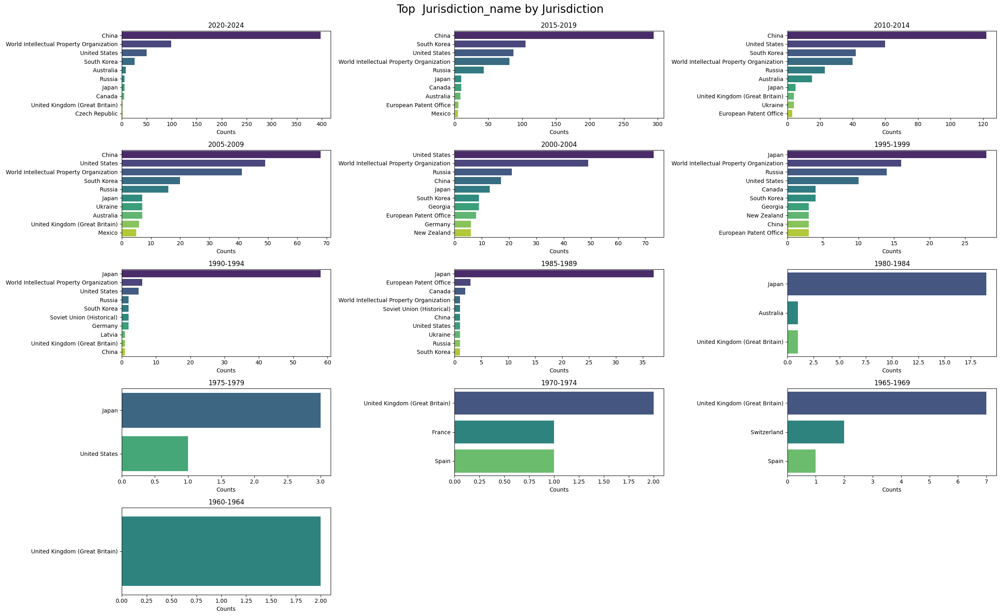

In [ ]:
plot_top_5_IPCR_by_country(data, 'Jurisdiction_name', 'Application_Year_Range')

#### top 10 jurisdiction region per period (graph)

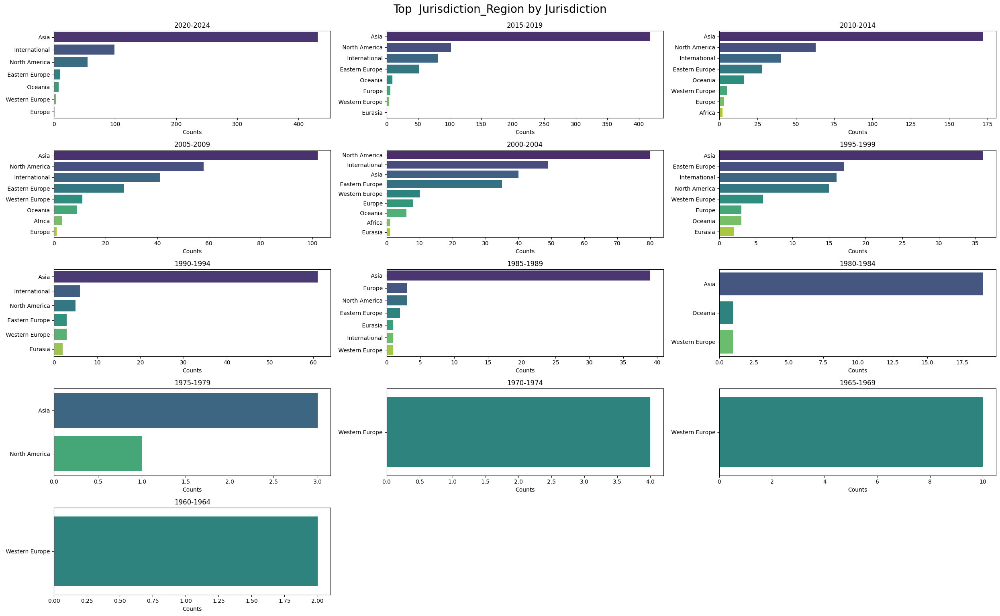

In [ ]:
plot_top_5_IPCR_by_country(data, 'Jurisdiction_Region', 'Application_Year_Range')

## entity metrix scores

### classify_entities----Newcomer/Continuant/Transient/Terminator

In [ ]:
import pandas as pd

def classify_entities(dataframe, entity_column, period_column):
    # Extract unique entities and periods
    unique_entities = set()
    for entities in dataframe[entity_column].dropna():
        unique_entities.update(str(entities).split(';;'))
    unique_periods = sorted(dataframe[period_column].dropna().astype(str).unique())

    # Initialize a DataFrame to hold the classification results
    classification_df = pd.DataFrame(index=list(unique_entities), columns=unique_periods + ['Last Classification'])

    # Track entity participation in each period
    entity_participation = {entity: [] for entity in unique_entities}
    for period in unique_periods:
        period_entities = set()
        for entities in dataframe[dataframe[period_column].astype(str) == period][entity_column].dropna():
            period_entities.update(str(entities).split(';;'))
        for entity in unique_entities:
            entity_participation[entity].append(entity in period_entities)

    # Classify entities for each period
    last_period = unique_periods[-1]
    for entity, participation in entity_participation.items():
        last_classification = None
        for i, active in enumerate(participation):
            # Determine the classification based on entire history
            ever_active_before = any(participation[:i])
            ever_active_after = any(participation[i+1:])

            if not active:
                classification = None  # Not active in the current period
            elif unique_periods[i] == last_period:
                classification = 'Continuant' if ever_active_before else 'Newcomer'
            elif ever_active_before and ever_active_after:
                classification = 'Continuant'
            elif ever_active_before:
                classification = 'Terminator'
            elif ever_active_after:
                classification = 'Newcomer'
            else:
                classification = 'Transient'  # Active only in the current period

            classification_df.at[entity, unique_periods[i]] = classification
            if classification is not None:
                last_classification = classification

        classification_df.at[entity, 'Last Classification'] = last_classification
        # Rename the index
        classification_df.index.name = entity_column
        #classification_df = classification_df.reset_index()

    return classification_df



#### Applicants

In [ ]:
classification_df = classify_entities(data, 'Applicants', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Applicants,,,,,,,,,,,,,,
SYSTEMS BIO IND,None,None,None,None,None,None,None,Transient,None,None,None,None,None,Transient
AGRICULTURAL TECH RES INST,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
WOODWARD MARTIN JOHN,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
UNIV OITA,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
GACHECHILADZE KETEVAN,None,None,None,None,None,None,None,Transient,None,None,None,None,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WELGENE INC,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
MARDH SVEN,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
MINTZ PAUL J,None,None,None,None,None,None,None,None,Newcomer,None,Terminator,None,None,Terminator


In [ ]:
classification_df = classify_entities(data, 'Applicants', 'Application Year').reset_index().set_index(['Applicants','Last Classification'])#.rename({'index':'Applicants'}, axis=1)
classification_df


,,1955,1958,1959,1963,1964,1966,1967,1968,1969,1971,1972,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Applicants,Last Classification,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SYSTEMS BIO IND,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
AGRICULTURAL TECH RES INST,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None
WOODWARD MARTIN JOHN,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
UNIV OITA,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
GACHECHILADZE KETEVAN,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WELGENE INC,Terminator,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
MARDH SVEN,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
MINTZ PAUL J,Terminator,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,None,None,None,None,None,None,Terminator,None,None,None,None,None,None,None,None,None,None,None,None,None


##### trend of Classification

###### Graph percentage

In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame
# Example: data = pd.read_csv('your_file.csv')  # Replace with your actual data loading method
data_clas = classification_df.reset_index()
# Melt the DataFrame to long format
long_format = data_clas.melt(id_vars=['Applicants', 'Last Classification'], var_name='Year', value_name='Element')

# Filter out rows where 'Element' is 'None'
filtered_data = long_format[long_format['Element'] != 'None']

# Count the occurrences of each element by year
count_data = filtered_data.groupby(['Year', 'Element']).size().unstack(fill_value=0)

# The result 'count_data' is a DataFrame with years as rows and elements as columns, showing counts
count_data

Element,Continuant,Newcomer,Terminator,Transient
Year,,,,
1955,0,0,0,3
1958,0,0,0,1
1959,0,0,0,2
1963,0,0,0,1
1964,0,0,0,1
1966,0,1,0,0
1967,0,0,1,0
1968,0,0,0,1
1969,0,0,0,2


###### Graph percentage

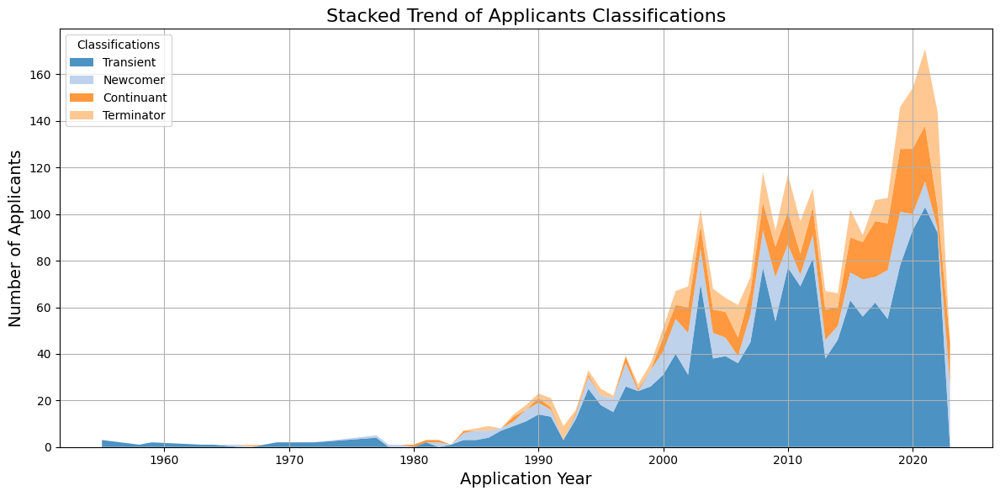

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import itertools

# Your DataFrame is assumed to be named 'df'.
# Number of jurisdictions
num_colors = len(count_data.columns)

# Combine multiple color maps
cmaps = [plt.cm.tab20, plt.cm.Set3, plt.cm.Paired]  # Add more if needed
colors = list(itertools.chain.from_iterable([cmap(np.linspace(0, 1, cmap.N)) for cmap in cmaps]))

# If more colors are needed, generate custom colors
while len(colors) < num_colors:
    # Generate a random color
    random_color = mcolors.to_rgba(np.random.rand(4,))
    # Check for distinctiveness and add to the list
    if all(mcolors.colorConverter.to_rgb(random_color) != mcolors.colorConverter.to_rgb(existing_color) for existing_color in colors):
        colors.append(random_color)


# Convert the 'Application Year' index back to integer if it was changed to float during the process
count_data.index = count_data.index.astype(int)

# Sort the columns by their overall sum so that the largest area is at the bottom
sorted_regions = count_data.sum().sort_values(ascending=False).index
count_data = count_data[sorted_regions]

# Plotting
plt.figure(figsize=(12, 6))

# Stackplot does the cumulative plot in one go, no need to cumsum manually
plt.stackplot(count_data.index, count_data.T, labels=count_data.columns, colors = colors[:num_colors], alpha=0.8)

# Add title and labels
plt.title('Stacked Trend of Applicants Classifications', fontsize=16)
plt.xlabel('Application Year', fontsize=14)
plt.ylabel('Number of Applicants', fontsize=14)

# Add legend
plt.legend(title='Classifications', loc='upper left') #, bbox_to_anchor=(1.05, 1))

# Show grid
plt.grid(True)

# Display the plot
plt.tight_layout()  # Adjust the layout to prevent clipping
plt.show()


###### table percentage

In [ ]:
# Calculate the total counts for each year
total_counts_per_year = count_data.sum(axis=1)

# Convert counts to percentages
percentage_data = count_data.div(total_counts_per_year, axis=0) * 100
percentage_data

Element,Transient,Newcomer,Continuant,Terminator
Year,,,,
1955,100.000000,0.000000,0.000000,0.000000
1958,100.000000,0.000000,0.000000,0.000000
1959,100.000000,0.000000,0.000000,0.000000
1963,100.000000,0.000000,0.000000,0.000000
1964,100.000000,0.000000,0.000000,0.000000
1966,0.000000,100.000000,0.000000,0.000000
1967,0.000000,0.000000,0.000000,100.000000
1968,100.000000,0.000000,0.000000,0.000000
1969,100.000000,0.000000,0.000000,0.000000


###### Graph percentage

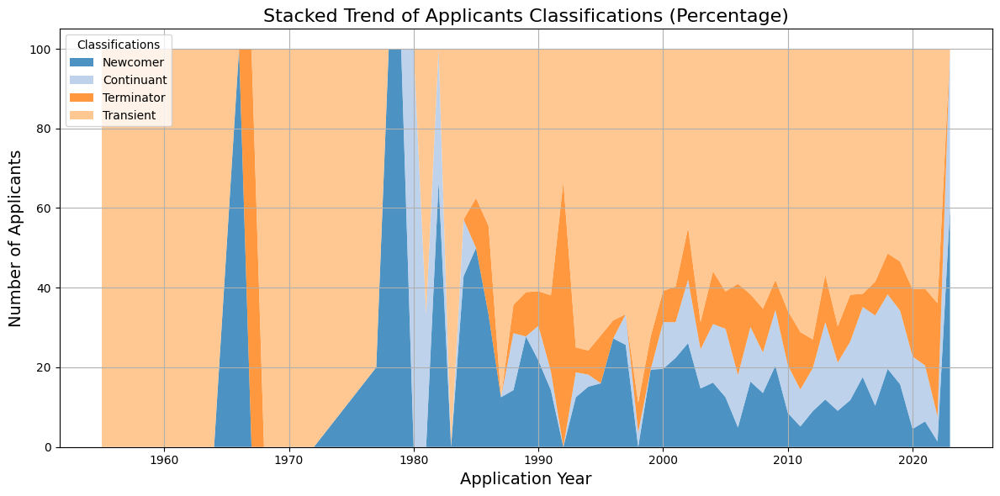

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import itertools

# Your DataFrame is assumed to be named 'df'.
# Number of jurisdictions
num_colors = len(count_data.columns)

# Combine multiple color maps
cmaps = [plt.cm.tab20, plt.cm.Set3, plt.cm.Paired]  # Add more if needed
colors = list(itertools.chain.from_iterable([cmap(np.linspace(0, 1, cmap.N)) for cmap in cmaps]))

# If more colors are needed, generate custom colors
while len(colors) < num_colors:
    # Generate a random color
    random_color = mcolors.to_rgba(np.random.rand(4,))
    # Check for distinctiveness and add to the list
    if all(mcolors.colorConverter.to_rgb(random_color) != mcolors.colorConverter.to_rgb(existing_color) for existing_color in colors):
        colors.append(random_color)


# Convert the 'Application Year' index back to integer if it was changed to float during the process
percentage_data.index = percentage_data.index.astype(int)

# Sort the columns by their overall sum so that the largest area is at the bottom
sorted_regions = ['Newcomer','Continuant','Terminator','Transient']
percentage_data = percentage_data[sorted_regions]

# Plotting
plt.figure(figsize=(12, 6))

# Stackplot does the cumulative plot in one go, no need to cumsum manually
plt.stackplot(percentage_data.index, percentage_data.T, labels=percentage_data.columns, colors = colors[:num_colors], alpha=0.8)

# Add title and labels
plt.title('Stacked Trend of Applicants Classifications (Percentage)', fontsize=16)
plt.xlabel('Application Year', fontsize=14)
plt.ylabel('Number of Applicants', fontsize=14)

# Add legend
plt.legend(title='Classifications', loc='upper left') #, bbox_to_anchor=(1.05, 1))

# Show grid
plt.grid(True)

# Display the plot
plt.tight_layout()  # Adjust the layout to prevent clipping
plt.show()


#### Inventors

In [ ]:
classification_df = classify_entities(data, 'Inventors', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Inventors,,,,,,,,,,,,,,
URAKOV N N,None,None,None,None,None,None,None,Transient,None,None,None,None,None,Transient
WANG BING,None,None,None,None,None,None,None,None,Newcomer,None,None,Terminator,None,Terminator
XU TING,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
WANG CHUNFENG,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
XI XIAOZHI,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JING HAIWEI,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
MARDH SVEN,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
BAI YI,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient


In [ ]:
classification_df = classify_entities(data, 'Inventors', 'Application Year')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1955,1958,1959,1963,1964,1966,1967,1968,1969,1971,1972,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Last Classification
Inventors,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
URAKOV N N,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
WANG BING,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Terminator,None,None,None,None,Terminator
XU TING,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,None,None,Terminator,None,None,None,None,Terminator
WANG CHUNFENG,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
XI XIAOZHI,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JING HAIWEI,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,Transient
MARDH SVEN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
BAI YI,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,Continuant,None,Terminator,None,None,None,None,Terminator


##### trend of Classification

###### Graph percentage

In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame
# Example: data = pd.read_csv('your_file.csv')  # Replace with your actual data loading method
data_clas = classification_df.reset_index()
# Melt the DataFrame to long format
long_format = data_clas.melt(id_vars=['Inventors', 'Last Classification'], var_name='Year', value_name='Element')

# Filter out rows where 'Element' is 'None'
filtered_data = long_format[long_format['Element'] != 'None']

# Count the occurrences of each element by year
count_data = filtered_data.groupby(['Year', 'Element']).size().unstack(fill_value=0)

# The result 'count_data' is a DataFrame with years as rows and elements as columns, showing counts
count_data

Element,Continuant,Newcomer,Terminator,Transient
Year,,,,
1955,0,0,0,5
1963,0,0,0,1
1967,0,0,0,1
1969,0,0,0,1
1977,0,0,0,10
1978,0,0,0,2
1979,0,0,0,2
1980,0,2,0,2
1981,1,1,1,7


###### Graph percentage

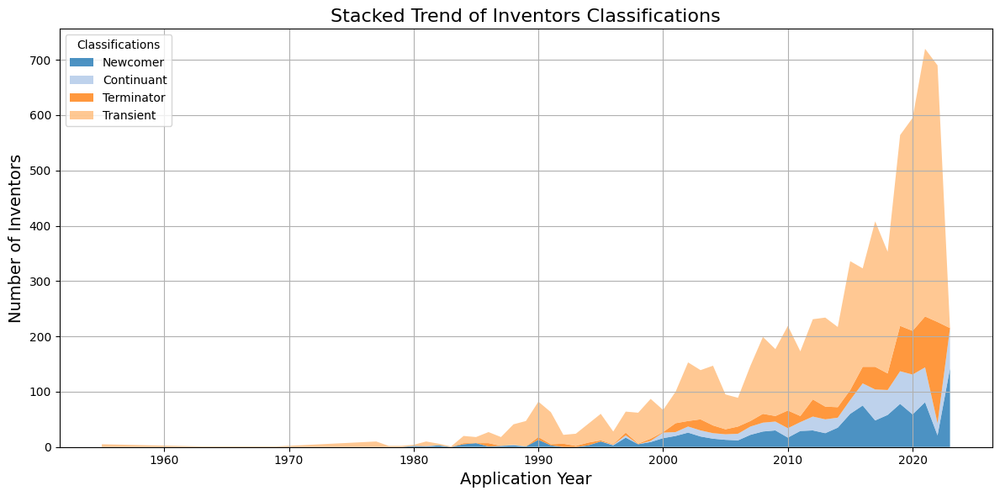

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import itertools

# Your DataFrame is assumed to be named 'df'.
# Number of jurisdictions
num_colors = len(count_data.columns)

# Combine multiple color maps
cmaps = [plt.cm.tab20, plt.cm.Set3, plt.cm.Paired]  # Add more if needed
colors = list(itertools.chain.from_iterable([cmap(np.linspace(0, 1, cmap.N)) for cmap in cmaps]))

# If more colors are needed, generate custom colors
while len(colors) < num_colors:
    # Generate a random color
    random_color = mcolors.to_rgba(np.random.rand(4,))
    # Check for distinctiveness and add to the list
    if all(mcolors.colorConverter.to_rgb(random_color) != mcolors.colorConverter.to_rgb(existing_color) for existing_color in colors):
        colors.append(random_color)


# Convert the 'Application Year' index back to integer if it was changed to float during the process
count_data.index = count_data.index.astype(int)

# Sort the columns by their overall sum so that the largest area is at the bottom
sorted_regions = ['Newcomer','Continuant','Terminator','Transient']
count_data = count_data[sorted_regions]

# Plotting
plt.figure(figsize=(12, 6))

# Stackplot does the cumulative plot in one go, no need to cumsum manually
plt.stackplot(count_data.index, count_data.T, labels=count_data.columns, colors = colors[:num_colors], alpha=0.8)

# Add title and labels
plt.title('Stacked Trend of Inventors Classifications', fontsize=16)
plt.xlabel('Application Year', fontsize=14)
plt.ylabel('Number of Inventors', fontsize=14)

# Add legend
plt.legend(title='Classifications', loc='upper left') #, bbox_to_anchor=(1.05, 1))

# Show grid
plt.grid(True)

# Display the plot
plt.tight_layout()  # Adjust the layout to prevent clipping
plt.show()


###### table percentage

In [ ]:
# Calculate the total counts for each year
total_counts_per_year = count_data.sum(axis=1)

# Convert counts to percentages
percentage_data = count_data.div(total_counts_per_year, axis=0) * 100
percentage_data

Element,Newcomer,Continuant,Terminator,Transient
Year,,,,
1955,0.000000,0.000000,0.000000,100.000000
1963,0.000000,0.000000,0.000000,100.000000
1967,0.000000,0.000000,0.000000,100.000000
1969,0.000000,0.000000,0.000000,100.000000
1977,0.000000,0.000000,0.000000,100.000000
1978,0.000000,0.000000,0.000000,100.000000
1979,0.000000,0.000000,0.000000,100.000000
1980,50.000000,0.000000,0.000000,50.000000
1981,10.000000,10.000000,10.000000,70.000000


###### Graph percentage

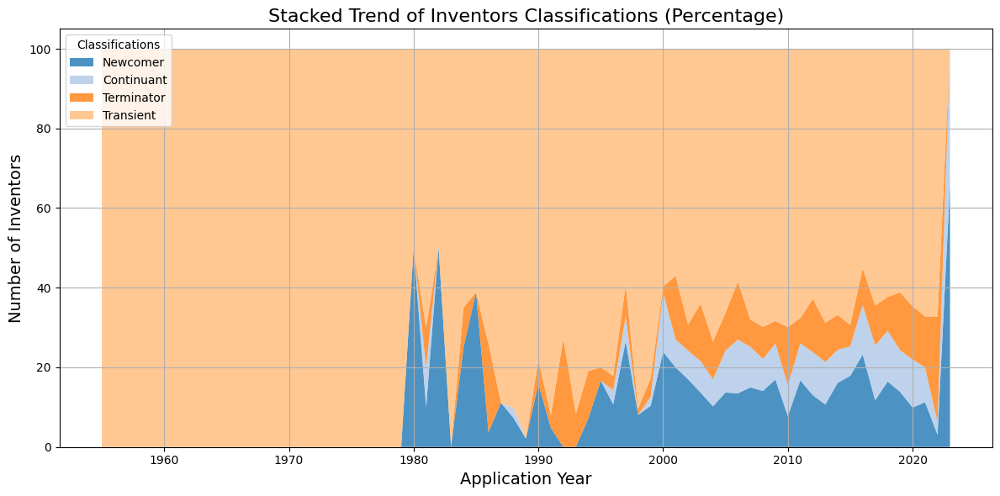

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import itertools

# Your DataFrame is assumed to be named 'df'.
# Number of jurisdictions
num_colors = len(count_data.columns)

# Combine multiple color maps
cmaps = [plt.cm.tab20, plt.cm.Set3, plt.cm.Paired]  # Add more if needed
colors = list(itertools.chain.from_iterable([cmap(np.linspace(0, 1, cmap.N)) for cmap in cmaps]))

# If more colors are needed, generate custom colors
while len(colors) < num_colors:
    # Generate a random color
    random_color = mcolors.to_rgba(np.random.rand(4,))
    # Check for distinctiveness and add to the list
    if all(mcolors.colorConverter.to_rgb(random_color) != mcolors.colorConverter.to_rgb(existing_color) for existing_color in colors):
        colors.append(random_color)


# Convert the 'Application Year' index back to integer if it was changed to float during the process
percentage_data.index = percentage_data.index.astype(int)

# Sort the columns by their overall sum so that the largest area is at the bottom
sorted_regions = ['Newcomer','Continuant','Terminator','Transient']
percentage_data = percentage_data[sorted_regions]

# Plotting
plt.figure(figsize=(12, 6))

# Stackplot does the cumulative plot in one go, no need to cumsum manually
plt.stackplot(percentage_data.index, percentage_data.T, labels=percentage_data.columns, colors = colors[:num_colors], alpha=0.8)

# Add title and labels
plt.title('Stacked Trend of Inventors Classifications (Percentage)', fontsize=16)
plt.xlabel('Application Year', fontsize=14)
plt.ylabel('Number of Inventors', fontsize=14)

# Add legend
plt.legend(title='Classifications', loc='upper left') #, bbox_to_anchor=(1.05, 1))

# Show grid
plt.grid(True)

# Display the plot
plt.tight_layout()  # Adjust the layout to prevent clipping
plt.show()


In [ ]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Application Year', 'Earliest Priority Year', 'Application_Year_Range',
       'IPCR Sections', 'IPCR Class', 'IPCR Subclass', 'Jurisdiction_name',
       'Jurisdiction_Region'],
      dtype='object')

### extract_first_last_years

In [ ]:
data[['Applicants','Application Year']]

,Applicants,Application Year
0,NOVOSIB NII T;;UBERKULEZA,2001
1,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,2015
2,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,2015
3,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,2015
4,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,2017
...,...,...
2360,UPJOHN CO,1966
2361,UPJOHN CO,1966
2362,TCM BIOTECH INT CORP,2018
2363,FLAGSHIP PIONEERING INNOVATIONS V INC,2018


In [ ]:
import pandas as pd

def extract_first_last_years(dataframe, entity_column, year_column):
    # Initialize a dictionary to hold the first and last year of activity for each entity
    entity_years = {}

    for _, row in dataframe.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        year = row[year_column]
        for entity in entities:
            if entity not in entity_years:
                entity_years[entity] = {'first_year': year, 'last_year': year}
            else:
                entity_years[entity]['first_year'] = min(entity_years[entity]['first_year'], year)
                entity_years[entity]['last_year'] = max(entity_years[entity]['last_year'], year)

    # Convert the dictionary to a DataFrame
    result_df = pd.DataFrame.from_dict(entity_years, orient='index').reset_index()
    result_df.columns = [f'{entity_column}', 'First Year', 'Last Year']

    # Calculate the duration in years
    result_df['Duration (Years)'] = result_df['Last Year'] - result_df['First Year'] + 1

    return result_df

# Example usage with actual data
# Replace 'data' with your actual DataFrame
# data = pd.read_csv('your_file.csv')  # Example loading of your DataFrame
# result = extract_first_last_years(data, 'YourEntityColumn', 'YourYearColumn')


#### Applicants

In [ ]:
first_last_years_df = extract_first_last_years(data, 'Applicants', 'Application Year')
first_last_years_df

,Applicants,First Year,Last Year,Duration (Years)
0,NOVOSIB NII T,2001,2001,1
1,UBERKULEZA,2001,2001,1
2,TECNIFAR-INDUSTRIA TECNICA FARM S A,2015,2015,1
3,TECHNOPHAGE INVESTIG E DES,2015,2015,1
4,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A,2015,2015,1
...,...,...,...,...
1966,CHUNQING LUO,2007,2007,1
1967,GAMBRO INC,1999,1999,1
1968,TCM BIOTECH INT CORP,2018,2018,1
1969,FLAGSHIP PIONEERING INNOVATIONS V INC,2018,2018,1


In [ ]:
sorted_df = first_last_years_df[['Applicants', 'Duration (Years)']].sort_values(by='Duration (Years)', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Duration (Years)
270,Unilever Nv,31
198,Univ Texas,29
964,Inst Nat Sante Rech Med,29
485,Consejo Superior Investigacion,29
13,Us Army,27
507,Harvard College,27
28,Us Health,26
61,Univ Maryland,25
662,Univ Yale,22
659,Univ California,22


#### Inventors

In [ ]:
first_last_years_df = extract_first_last_years(data, 'Inventors', 'Application Year')
first_last_years_df

,Inventors,First Year,Last Year,Duration (Years)
0,KURUNOV JU N,2001,2001,1
1,KURUNOVA N N,2001,2001,1
2,SHATALOVA N D,2001,2001,1
3,MIGUEL ANGELO DA COSTA GARCIA,2015,2015,1
4,CARLOS JORGE SOUSA DE SAO JOSE,2015,2015,1
...,...,...,...,...
5819,MARTINEZ IGNACIO,2018,2018,1
5820,ARMEN ZACHARY,2018,2018,1
5821,CEZAR CHRISTINE,2018,2018,1
5822,MARTIN BARRY,2018,2018,1


In [ ]:
sorted_df = first_last_years_df[['Inventors', 'Duration (Years)']].sort_values(by='Duration (Years)', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Duration (Years)
996,Jacobs William R,31
373,Hatfull Graham,30
733,Ghanbari Hossein A,25
820,Fischetti Vincent,23
26,Merril Carl R,22
3702,Liang Mifang,22
4126,Miyabayashi Tomoyuki,21
2837,Ren Zhaojun,20
478,Sulakvelidze Alexander,19
1267,Nelson Daniel,18


### calculate_influence_scores


```
# Ce texte est au format code
```



#### calculate_centrality_measures

```
The function calculate_centrality_measures has been successfully executed. It computes four key centrality measures for each entity in your dataset:

    Degree Centrality: Measures the number of connections an entity has to others.
    Betweenness Centrality: Indicates how often an entity appears on the shortest path between other entities.
    Closeness Centrality: Reflects how close an entity is to all other entities in the network.
    Eigenvector Centrality: Accounts for the influence of an entity's connections.

The output DataFrame, centrality_df, lists these measures for each entity.
```



In [ ]:
import pandas as pd
import networkx as nx
import itertools
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
from collections import Counter
from itertools import combinations
from matplotlib import cm
import community as community_louvain

def calculate_centrality_measures(dataframe, entity_column):
    # Create a graph from the dataframe
    G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        for pair in combinations(entities, 2):
            G.add_edge(*pair)

    # Calculate centrality measures
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

    # Eigenvector Centrality with increased iterations and error handling
    try:
        eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=500)
    except nx.PowerIterationFailedConvergence:
        eigenvector_centrality = {n: 0 for n in G.nodes()}  # Assign 0 if fails to converge

    # Create DataFrames for each centrality measure
    degree_df = pd.DataFrame(degree_centrality.items(), columns=[f'{entity_column}', 'Degree Centrality'])
    betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=[f'{entity_column}', 'Betweenness Centrality'])
    closeness_df = pd.DataFrame(closeness_centrality.items(), columns=[f'{entity_column}', 'Closeness Centrality'])
    eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=[f'{entity_column}', 'Eigenvector Centrality'])

    # Merge all centrality measures into one DataFrame
    centrality_df = degree_df.merge(betweenness_df, on=f'{entity_column}').merge(closeness_df, on=f'{entity_column}').merge(eigenvector_df, on=f'{entity_column}')

    return centrality_df


##### Applicants

In [ ]:
centrality_df = calculate_centrality_measures(data, 'Applicants')
centrality_df

,Applicants,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
0,NOVOSIB NII T,0.000929,0.0,0.000929,0.000000e+00
1,UBERKULEZA,0.000929,0.0,0.000929,0.000000e+00
2,TECNIFAR-INDUSTRIA TECNICA FARM S A,0.000929,0.0,0.000929,0.000000e+00
3,TECHNOPHAGE INVESTIG E DES,0.000929,0.0,0.000929,0.000000e+00
4,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A,0.000929,0.0,0.000929,0.000000e+00
...,...,...,...,...,...
1072,PARK KUN TAEK,0.003717,0.0,0.003717,1.697130e-205
1073,SHANDONG NEWHOPE LIUHE GROUP,0.001859,0.0,0.001859,5.567709e-314
1074,NEW HOPE LIUHE CO LTD,0.001859,0.0,0.001859,5.567709e-314
1075,QINGDAO JIAZHI BIOTECHNOLOGY CO LTD,0.001859,0.0,0.001859,5.567709e-314


In [ ]:
sorted_df = centrality_df[['Applicants', 'Degree Centrality']].sort_values(by='Degree Centrality', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Degree Centrality
50,Gorski Andrzej,0.021375
135,Gabisonia Taras,0.019517
278,Dzidzishvili Luiza,0.015799
271,Kvatadze Nino,0.015799
281,Meipariani Amiran,0.015799
280,Chanishvili Teimuraz,0.015799
247,Univ Rockefeller,0.015799
23,Univ Boston,0.013011
101,Us Agriculture,0.013011
720,Bachmann Martin,0.012082


In [ ]:
sorted_df = centrality_df[['Applicants', 'Betweenness Centrality']].sort_values(by='Betweenness Centrality', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Betweenness Centrality
135,Gabisonia Taras,0.000301
50,Gorski Andrzej,0.000264
280,Chanishvili Teimuraz,0.000222
247,Univ Rockefeller,0.000169
197,Loomis Lawrence,0.000119
24,Massachusetts Inst Technology,0.000112
101,Us Agriculture,0.000109
258,Us Navy,0.000092
23,Univ Boston,0.000087
71,Brigham & Womens Hospital,0.000083


In [ ]:
sorted_df = centrality_df[['Applicants', 'Closeness Centrality']].sort_values(by='Closeness Centrality', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Closeness Centrality
135,Gabisonia Taras,0.022132
50,Gorski Andrzej,0.021664
280,Chanishvili Teimuraz,0.020248
271,Kvatadze Nino,0.020248
278,Dzidzishvili Luiza,0.020248
281,Meipariani Amiran,0.020248
272,Goderdzishvili Marine,0.017956
273,Gachechiladze Ketevan,0.017956
274,Zhgenti Darejan,0.017956
275,Sharmazanazhvili Tamar,0.017956


In [ ]:
sorted_df = centrality_df[['Applicants', 'Eigenvector Centrality']].sort_values(by='Eigenvector Centrality', ascending=False)
sorted_df['Applicants'] = sorted_df['Applicants'].str.title()
sorted_df.head(25)

,Applicants,Eigenvector Centrality
135,Gabisonia Taras,0.303211
278,Dzidzishvili Luiza,0.297566
281,Meipariani Amiran,0.297566
271,Kvatadze Nino,0.297566
280,Chanishvili Teimuraz,0.258857
275,Sharmazanazhvili Tamar,0.239617
276,Darsavelidze Marine,0.239617
277,Chkonia Irine,0.239617
279,Alavidze Zempira,0.239617
273,Gachechiladze Ketevan,0.239617


##### Inventors

In [ ]:
centrality_df = calculate_centrality_measures(data, 'Inventors')
centrality_df

,Inventors,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
0,KURUNOV JU N,0.000355,0.0,0.000355,5.910773e-92
1,KURUNOVA N N,0.000355,0.0,0.000355,5.910773e-92
2,SHATALOVA N D,0.000355,0.0,0.000355,5.910773e-92
3,MIGUEL ANGELO DA COSTA GARCIA,0.000710,0.0,0.000710,3.231919e-68
4,CARLOS JORGE SOUSA DE SAO JOSE,0.000710,0.0,0.000710,3.231919e-68
...,...,...,...,...,...
5629,MARTINEZ IGNACIO,0.000710,0.0,0.000710,3.231919e-68
5630,ARMEN ZACHARY,0.000710,0.0,0.000710,3.231919e-68
5631,CEZAR CHRISTINE,0.000710,0.0,0.000710,3.231919e-68
5632,MARTIN BARRY,0.000710,0.0,0.000710,3.231919e-68


In [ ]:
sorted_df = centrality_df[['Inventors', 'Degree Centrality']].sort_values(by='Degree Centrality', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Degree Centrality
128,Jun Soo Youn,0.008876
124,Yoon Seong Jun,0.008876
102,Aleshkin Andrej Vladimirovich,0.008699
35,Ren Huiying,0.008166
36,Sun Huzhi,0.007989
86,Liu Yuqing,0.007811
129,Kang Sang Hyeon,0.007634
81,Du Xinyong,0.007279
101,Aleshkin Vladimir Andrianovich,0.007101
175,Gorski Andrzej,0.006568


In [ ]:
sorted_df = centrality_df[['Inventors', 'Betweenness Centrality']].sort_values(by='Betweenness Centrality', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Betweenness Centrality
86,Liu Yuqing,0.001376
516,Liu Shuang,0.001322
373,Zhang Wei,0.000766
991,Wang Shuang,0.000543
35,Ren Huiying,0.000509
1715,Li Yan,0.000476
990,Wu Bin,0.000475
2124,Liu Bo,0.000450
288,Tong Guixiang,0.000435
2366,Liu Yang,0.000365


In [ ]:
sorted_df = centrality_df[['Inventors', 'Closeness Centrality']].sort_values(by='Closeness Centrality', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Closeness Centrality
86,Liu Yuqing,0.018476
516,Liu Shuang,0.018138
81,Du Xinyong,0.016974
84,Li Xiansheng,0.016741
85,Ma Ruxia,0.016741
1000,Wang Likun,0.016379
87,Zhang Qing,0.016295
35,Ren Huiying,0.016113
373,Zhang Wei,0.016080
1582,Wang Xiaoling,0.016064


In [ ]:
sorted_df = centrality_df[['Inventors', 'Eigenvector Centrality']].sort_values(by='Eigenvector Centrality', ascending=False)
sorted_df['Inventors'] = sorted_df['Inventors'].str.title()
sorted_df.head(25)

,Inventors,Eigenvector Centrality
143,Xu Xuling,0.251492
142,Qiao Huan,0.251492
149,Cong Yu,0.251492
150,Xiao Xiao,0.247032
151,Ding Liang,0.241996
152,Xu Wenjian,0.230724
145,Fei Wenbin,0.228130
155,Shen Chanjuan,0.212398
154,Wang Weibin,0.207362
668,Yu Hao,0.200639


#### calculate_influence_scores with citations

In [ ]:
import pandas as pd
import networkx as nx
from itertools import combinations

def calculate_influence_scores(dataframe, applicants_column, citation_column):
    # Create a weighted directed graph
    G = nx.DiGraph()

    # Dictionaries to hold various metrics for each entity
    entity_citations = {}
    entity_collaborations = {}
    entity_patent_counts = {}
    entity_unique_collaborations = {}
    entity_joint_patent_counts = {}

    # Iterate over rows in the dataframe
    for _, row in dataframe.iterrows():
        # Skip if citation count or applicants are NaN
        if pd.isna(row[citation_column]) or pd.isna(row[applicants_column]):
            continue

        # Split the entities in the applicants column
        entities = str(row[applicants_column]).split(';;')
        # Get the citation count for this row
        citation_count = row[citation_column]

        # Count patents and update metrics for each entity
        for entity in entities:
            entity_citations[entity] = entity_citations.get(entity, 0) + citation_count
            entity_collaborations[entity] = entity_collaborations.get(entity, 0) + 1
            entity_patent_counts[entity] = entity_patent_counts.get(entity, 0) + 1
            entity_unique_collaborations[entity] = entity_unique_collaborations.get(entity, set())
            entity_joint_patent_counts[entity] = entity_joint_patent_counts.get(entity, 0) + (1 if len(entities) > 1 else 0)

            # Add nodes to the graph
            if entity not in G:
                G.add_node(entity)

        # Update collaboration sets and add weighted edges to the graph
        for entity1, entity2 in combinations(entities, 2):
            entity_unique_collaborations[entity1].add(entity2)
            entity_unique_collaborations[entity2].add(entity1)
            if G.has_edge(entity1, entity2):
                G[entity1][entity2]['weight'] += citation_count
            else:
                G.add_edge(entity1, entity2, weight=citation_count)

    # Calculate centrality and influence metrics
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    closeness_centrality = nx.closeness_centrality(G, distance='weight')
    eigenvector_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')
    pagerank = nx.pagerank(G, weight='weight')

    # Prepare the output dataframe
    output_data = []
    for entity in G.nodes():
        total_citations = entity_citations[entity]
        collaborations = entity_collaborations[entity]
        patent_count = entity_patent_counts[entity]
        unique_collaborations_count = len(entity_unique_collaborations[entity])
        joint_patent_count = entity_joint_patent_counts[entity]
        avg_citations = total_citations / collaborations if collaborations else 0
        collaboration_impact_factor = total_citations * degree_centrality[entity]

        output_data.append([
            entity,
            degree_centrality[entity],
            betweenness_centrality[entity],
            closeness_centrality[entity],
            eigenvector_centrality.get(entity, 0),  # Handle entities with no connections
            pagerank[entity],
            total_citations,
            avg_citations,
            collaboration_impact_factor,
            patent_count,
            unique_collaborations_count,
            joint_patent_count
        ])

    output_df = pd.DataFrame(output_data, columns=[
        f'{applicants_column}',
        'Citation-Weighted Degree Centrality',
        'Citation-Weighted Betweenness Centrality',
        'Citation-Weighted Closeness Centrality',
        'Citation-Weighted Eigenvector Centrality',
        'PageRank',
        'Total Citation Count',
        'Average Citation Count',
        'Collaboration Impact Factor',
        'Patent Count',
        'Unique Collaboration Count',
        'Joint Patent Count'
    ])
    return output_df


##### Applicants

In [ ]:
influence_df = calculate_influence_scores(data, 'Applicants', 'Cited by Patent Count')
influence_df

,Applicants,Citation-Weighted Degree Centrality,Citation-Weighted Betweenness Centrality,Citation-Weighted Closeness Centrality,Citation-Weighted Eigenvector Centrality,PageRank,Total Citation Count,Average Citation Count,Collaboration Impact Factor,Patent Count,Unique Collaboration Count,Joint Patent Count
0,NOVOSIB NII T,0.000508,0.0,0.000000,-9.476581e-18,0.000373,4,4.0,0.002030,1,1,1
1,UBERKULEZA,0.000508,0.0,0.000127,3.984625e-18,0.000690,4,4.0,0.002030,1,1,1
2,TECNIFAR-INDUSTRIA TECNICA FARM S A,0.000508,0.0,0.000000,1.356802e-18,0.000373,1,1.0,0.000508,1,1,1
3,TECHNOPHAGE INVESTIG E DES,0.000508,0.0,0.000508,-1.893171e-18,0.000690,1,1.0,0.000508,1,1,1
4,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A,0.000508,0.0,0.000000,-1.009446e-18,0.000373,0,0.0,0.000000,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1966,CHUNQING LUO,0.000000,0.0,0.000000,-8.257228e-18,0.000373,15,15.0,0.000000,1,0,0
1967,GAMBRO INC,0.000000,0.0,0.000000,1.450615e-18,0.000373,0,0.0,0.000000,1,0,0
1968,TCM BIOTECH INT CORP,0.000000,0.0,0.000000,6.859463e-18,0.000373,0,0.0,0.000000,1,0,0
1969,FLAGSHIP PIONEERING INNOVATIONS V INC,0.000000,0.0,0.000000,3.065519e-18,0.000373,0,0.0,0.000000,1,0,0


##### Inventors

In [ ]:
influence_df = calculate_influence_scores(data, 'Inventors', 'Cited by Patent Count')
influence_df

,Inventors,Citation-Weighted Degree Centrality,Citation-Weighted Betweenness Centrality,Citation-Weighted Closeness Centrality,Citation-Weighted Eigenvector Centrality,PageRank,Total Citation Count,Average Citation Count,Collaboration Impact Factor,Patent Count,Unique Collaboration Count,Joint Patent Count
0,KURUNOV JU N,0.000343,0.000000e+00,0.000000,-7.707300e-19,0.000103,4,4.0,0.001374,1,2,1
1,KURUNOVA N N,0.000343,0.000000e+00,0.000043,1.201267e-19,0.000147,4,4.0,0.001374,1,2,1
2,SHATALOVA N D,0.000343,0.000000e+00,0.000086,1.797678e-18,0.000273,4,4.0,0.001374,1,2,1
3,MIGUEL ANGELO DA COSTA GARCIA,0.000687,0.000000e+00,0.000000,5.962298e-19,0.000103,1,1.0,0.000687,1,4,1
4,CARLOS JORGE SOUSA DE SAO JOSE,0.000687,0.000000e+00,0.000172,-4.402189e-19,0.000125,1,1.0,0.000687,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5819,MARTINEZ IGNACIO,0.000687,0.000000e+00,0.000000,-7.928107e-19,0.000103,0,0.0,0.000000,1,4,1
5820,ARMEN ZACHARY,0.000687,4.424582e-08,0.000000,-1.130970e-19,0.000103,0,0.0,0.000000,1,4,1
5821,CEZAR CHRISTINE,0.000687,5.899443e-08,0.000000,8.168588e-19,0.000103,0,0.0,0.000000,1,4,1
5822,MARTIN BARRY,0.000687,4.424582e-08,0.000000,-8.069918e-19,0.000103,0,0.0,0.000000,1,4,1
